In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
from AVN import *
import pandas as pd
from scipy.stats import norm
import scipy.special as scp
import os

In [3]:
###Define colors code for plots:
from matplotlib import cm

##Get colors : 
cmap_name1 = cm.get_cmap('tab20', 20)
cmap_name2 = cm.get_cmap('tab20b', 20)
cmap_name3 = cm.get_cmap('tab20c', 20)
cmap_name4 = cm.get_cmap('tab10', 10)
cmap_name5 = cm.get_cmap('Set3', 12)

cmap1 = cmap_name1(np.linspace(0, 1, 20))
cmap2 = cmap_name2(np.linspace(0, 1, 20))
cmap3 = cmap_name3(np.linspace(0, 1, 20))
cmap4 = cmap_name4(np.linspace(0, 1, 10))
cmap5 = cmap_name5(np.linspace(0, 1, 12))

cmap = np.vstack([cmap1, cmap2, cmap3, cmap4, cmap5])

print(len(cmap))

82


In [4]:
path_to_df0 = "/home/xianglo/Bureau/DATA_AMATRICE/DBSCAN_David/new_all_run_files_for_etas_23052024_2/new_all_run_files_for_etas/catalog_all/"

####Raw data:
df0 = pd.read_csv(path_to_df0+'raw_data_modified_version.csv')
###Structure : t, x, y, z, m, x_km, y_km

###Swarms obtained by after ETAS & seismicity rate & checking step:
df_swarms = pd.read_csv('/home/xianglo/Bureau/DATA_AMATRICE/DBSCAN_David/new_all_run_files_for_etas_23052024_2/new_all_run_files_for_etas/v0_d03_n50_every1_clusters/new_df_final_swarms_of_v0_d03_n50_every1.csv')

##Rename swarms after sorting along t1:
df_swarms = df_swarms.sort_values("t1")
df_swarms.index = np.arange(1, len(df_swarms)+1)

df_swarms

,t1,t2,x1,x2,y1,y2,z1,z2,num_EQ
1,13.534078,16.936724,42.763,42.771,13.153,13.163,5.301,6.640,31
2,21.189318,23.352065,42.512,42.518,13.414,13.421,9.786,10.828,30
3,31.959698,34.152999,42.905,42.914,13.173,13.183,4.573,5.337,52
4,33.400373,35.318887,42.766,42.773,13.219,13.227,6.343,7.093,97
5,43.213940,47.283527,42.896,42.905,13.219,13.228,2.722,3.792,50
6,54.623879,57.830113,42.632,42.653,13.287,13.310,6.468,7.906,27
7,56.921319,57.148958,42.863,42.881,13.066,13.090,1.165,3.237,114
8,72.571283,76.237535,42.523,42.529,13.451,13.464,9.863,11.278,124
9,82.026167,86.479576,42.763,42.770,13.101,13.110,4.584,5.328,162
10,89.020661,90.444182,42.458,42.473,13.239,13.256,6.073,7.706,175


In [5]:
###Create a column of swarms number:
df0["swarms_num"] = np.zeros(len(df0)) -1


for i in range(0, len(df_swarms)):
    select_swarms = df0.index[(df0.t >= df_swarms.t1.iloc[i])&(df0.t <= df_swarms.t2.iloc[i])
                       & (df0.x >= df_swarms.x1.iloc[i])&(df0.x <= df_swarms.x2.iloc[i])
                       & (df0.y >= df_swarms.y1.iloc[i])&(df0.y <= df_swarms.y2.iloc[i])
                       & (df0.z >= df_swarms.z1.iloc[i])&(df0.z <= df_swarms.z2.iloc[i])]
    
    df0.swarms_num.iloc[select_swarms] = df_swarms.index[i]   
    
    
df0['swarms_num'] = df0['swarms_num'].astype(int)

print(np.unique(df0["swarms_num"].values)[1:])

###Remove all rows with a magnitude equal to a nan value:
df0 = df0.dropna()

df0.index = np.arange(0, len(df0))

df0

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40]


,t,x,y,z,m,x_km,y_km,swarms_num
0,0.004465,42.99118,12.92042,4.107,0.547416,4780.401106,1050.875824,-1
1,0.024991,42.30519,13.68531,6.154,0.964305,4704.122499,1125.431260,-1
2,0.028414,43.52994,12.65680,14.826,0.025395,4840.308485,1020.365169,-1
3,0.030136,43.16713,12.99694,8.917,-0.127835,4799.965854,1054.068313,-1
4,0.043938,43.31555,12.55297,3.274,-0.889339,4816.469405,1015.584715,-1
...,...,...,...,...,...,...,...,...
894438,365.996726,42.81393,13.10829,7.216,-0.325824,4760.691806,1069.225754,-1
894439,365.997166,42.80558,13.14988,3.126,0.304970,4759.763328,1072.763006,-1
894440,365.997419,43.00835,13.14668,1.336,-0.183670,4782.310323,1068.979802,-1
894441,365.999614,42.66073,13.21744,4.262,-0.273458,4743.656743,1080.795874,-1


In [6]:
from AVN import *

###Define AVN MS:
A, V, N, df_AVN = AVN(df0)

df_AVN

,t,x,y,z,m,x_km,y_km,swarms_num
621,9.067054,42.71446,13.24279,3.276,6.046692,4749.631246,1081.932511,-1.0
184899,72.804244,42.91094,13.13936,2.605,5.576763,4771.478826,1070.077358,-1.0
201811,76.277989,42.83603,13.12131,6.104,6.074127,4763.149214,1069.905228,-1.0


In [7]:
###Rescale on Norcia event:
xN_km = df0.x_km - N.x_km
yN_km = df0.y_km - N.y_km

df0["xN_km"] = xN_km
df0["yN_km"] = yN_km

###Redefine AVN MS:
A, V, N, df_AVN = AVN(df0)

df_msup5 = df0[df0.m >= 5]

df0

,t,x,y,z,m,x_km,y_km,swarms_num,xN_km,yN_km
0,0.004465,42.99118,12.92042,4.107,0.547416,4780.401106,1050.875824,-1,17.251893,-19.029404
1,0.024991,42.30519,13.68531,6.154,0.964305,4704.122499,1125.431260,-1,-59.026715,55.526032
2,0.028414,43.52994,12.65680,14.826,0.025395,4840.308485,1020.365169,-1,77.159272,-49.540059
3,0.030136,43.16713,12.99694,8.917,-0.127835,4799.965854,1054.068313,-1,36.816640,-15.836915
4,0.043938,43.31555,12.55297,3.274,-0.889339,4816.469405,1015.584715,-1,53.320191,-54.320513
...,...,...,...,...,...,...,...,...,...,...
894438,365.996726,42.81393,13.10829,7.216,-0.325824,4760.691806,1069.225754,-1,-2.457408,-0.679474
894439,365.997166,42.80558,13.14988,3.126,0.304970,4759.763328,1072.763006,-1,-3.385886,2.857778
894440,365.997419,43.00835,13.14668,1.336,-0.183670,4782.310323,1068.979802,-1,19.161110,-0.925426
894441,365.999614,42.66073,13.21744,4.262,-0.273458,4743.656743,1080.795874,-1,-19.492471,10.890646


## Simple stastistics 

In [8]:
###Separation in time:
##blue
##orange
##green

swarm n°: 1 
tiers_factor = 60


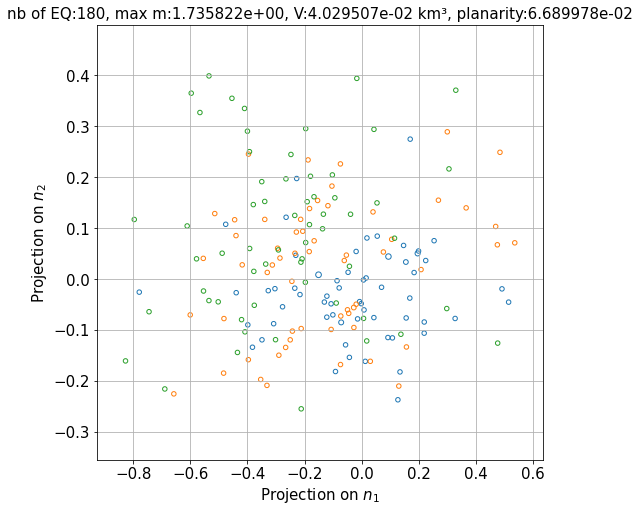

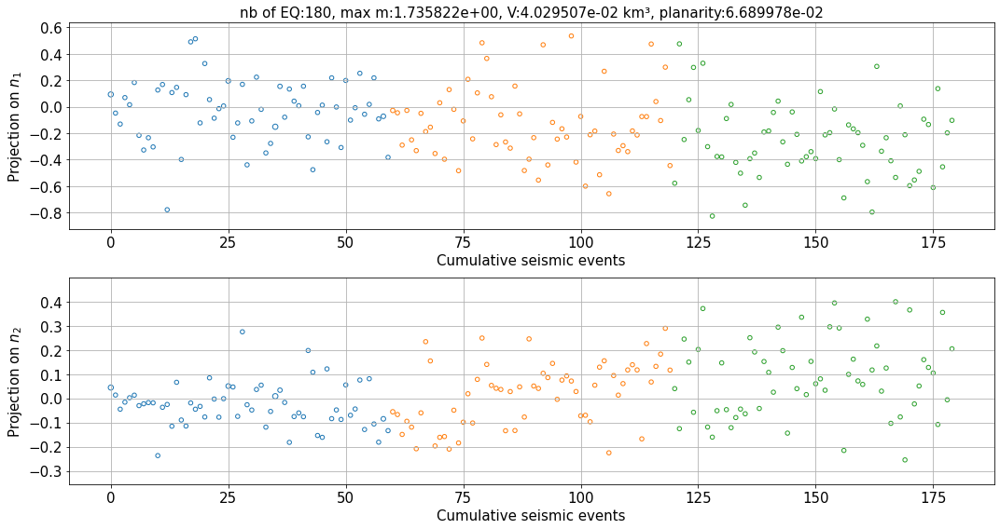

swarm n°: 2 
tiers_factor = 28


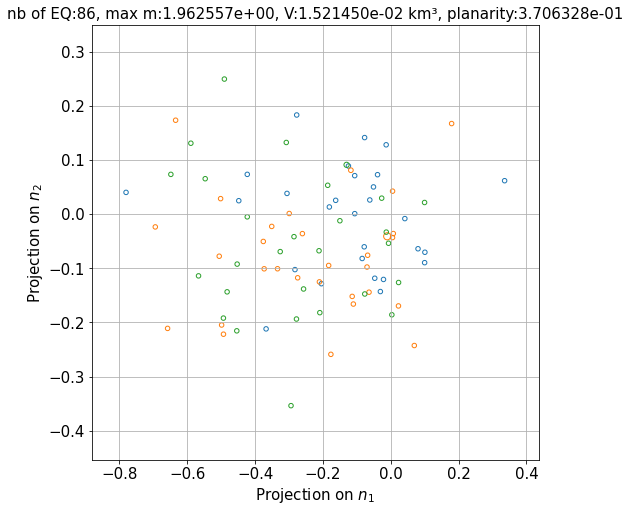

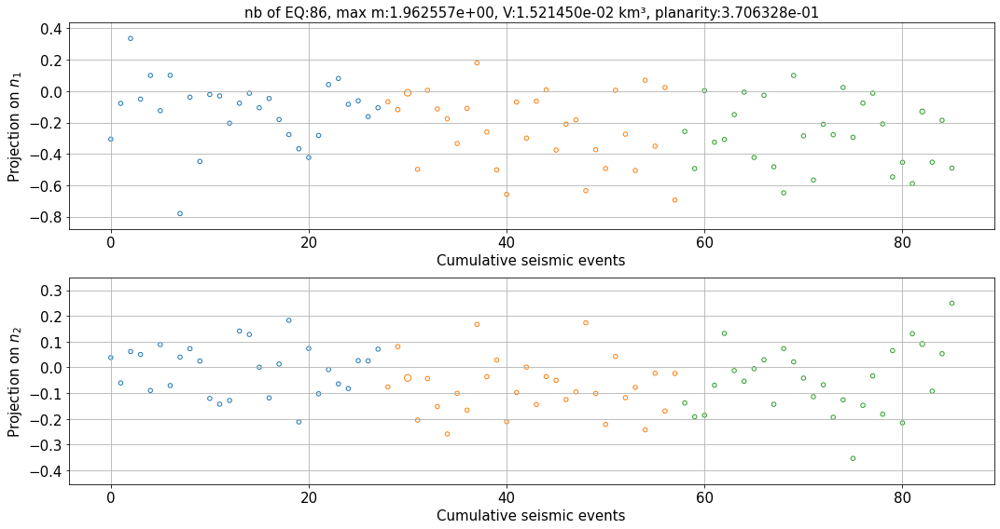

swarm n°: 3 
tiers_factor = 22


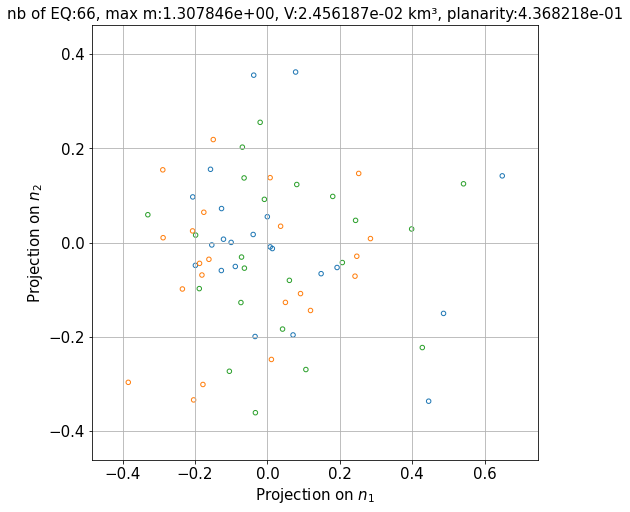

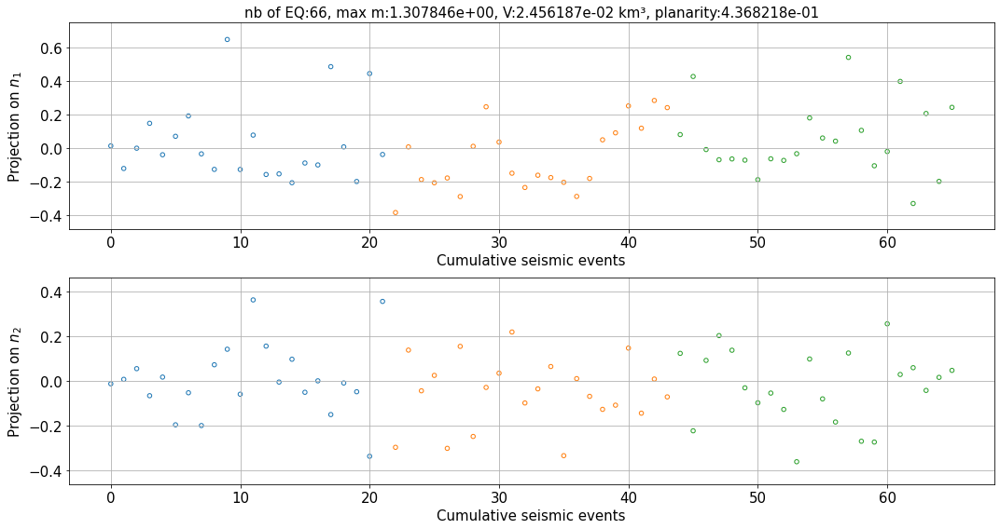

swarm n°: 4 
tiers_factor = 23


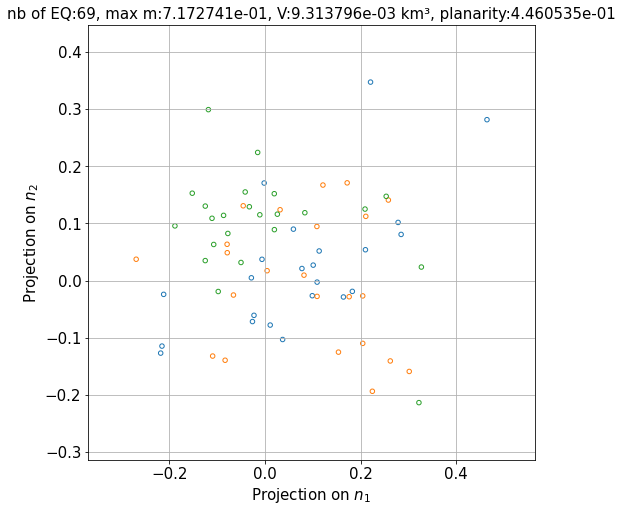

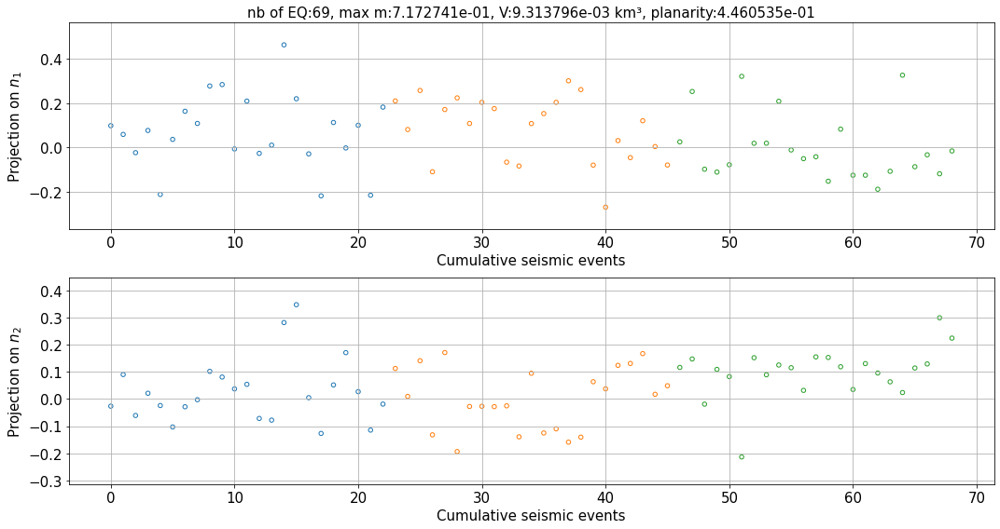

swarm n°: 5 
tiers_factor = 30


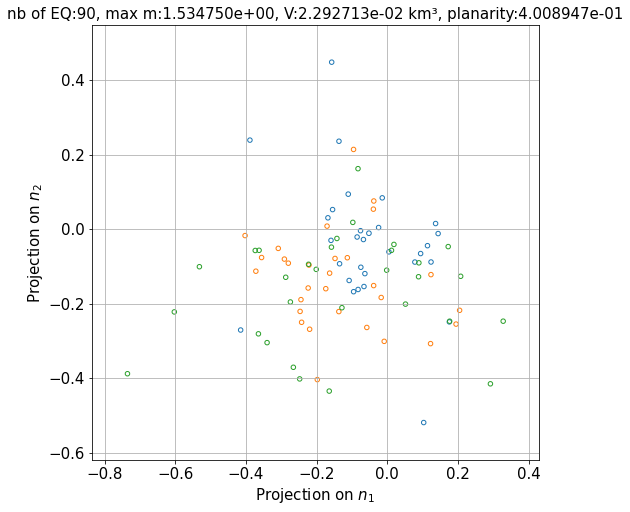

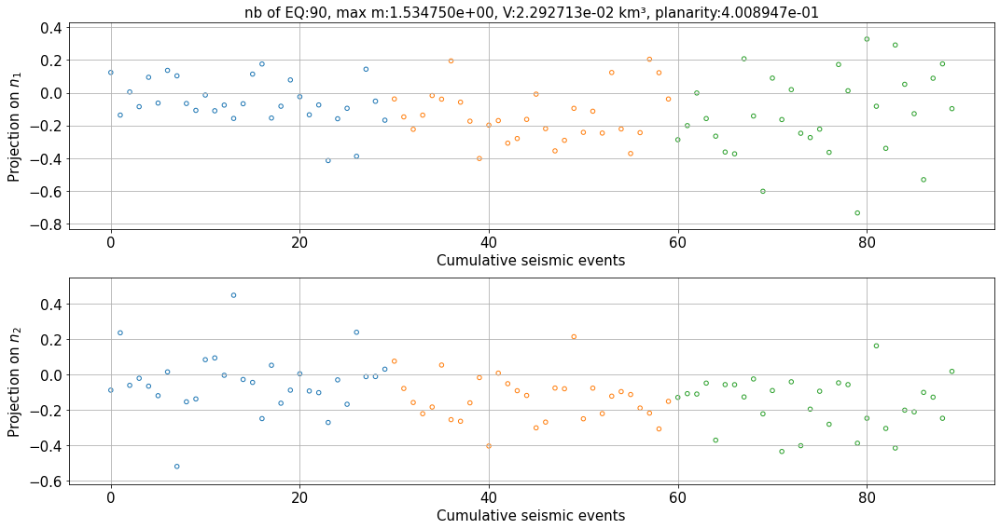

swarm n°: 6 
tiers_factor = 55


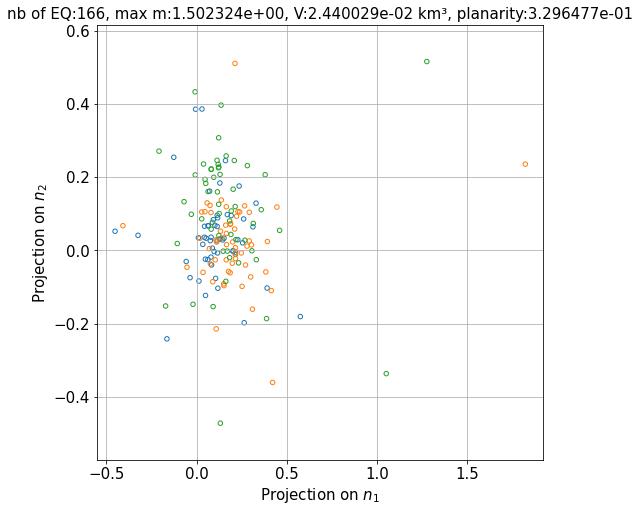

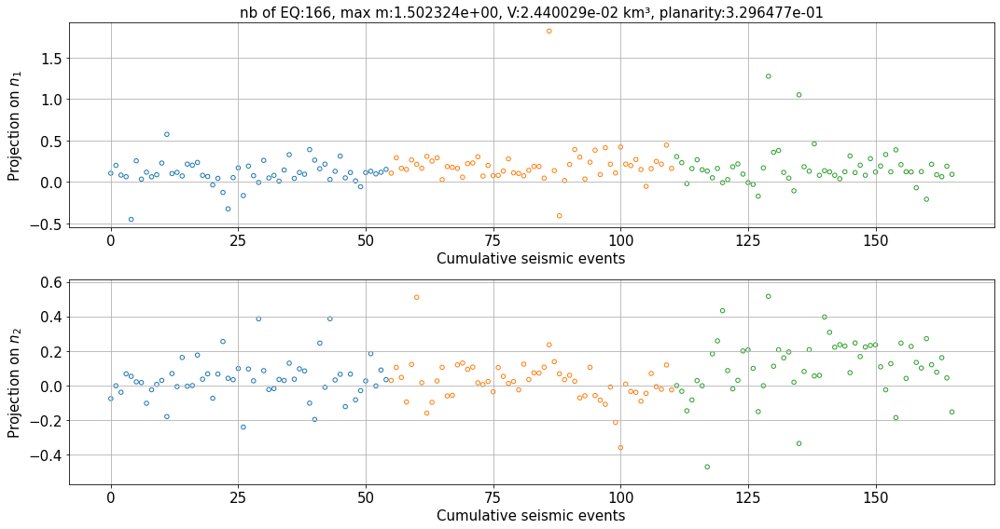

swarm n°: 7 
tiers_factor = 17


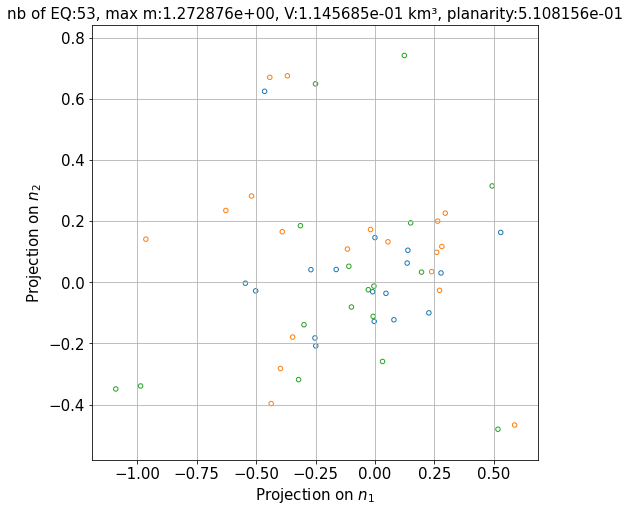

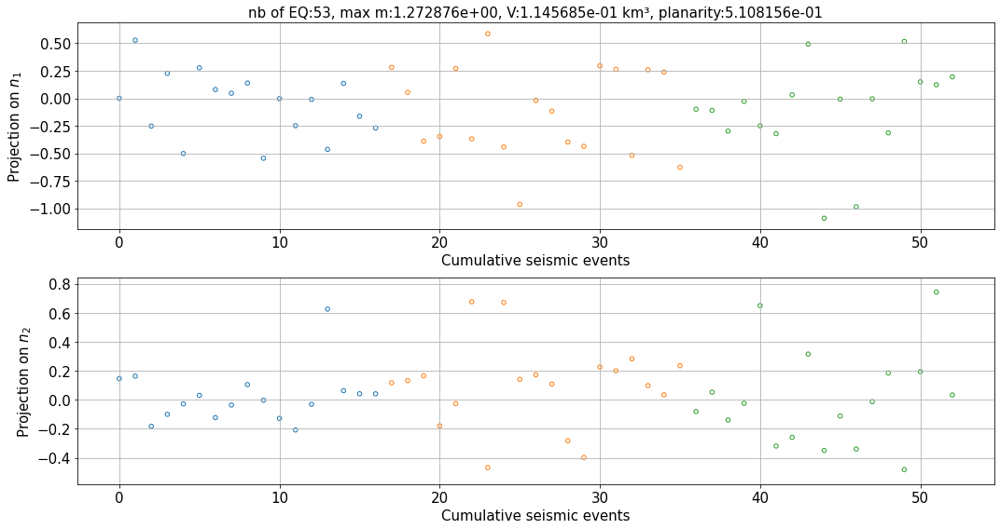

swarm n°: 8 
tiers_factor = 53


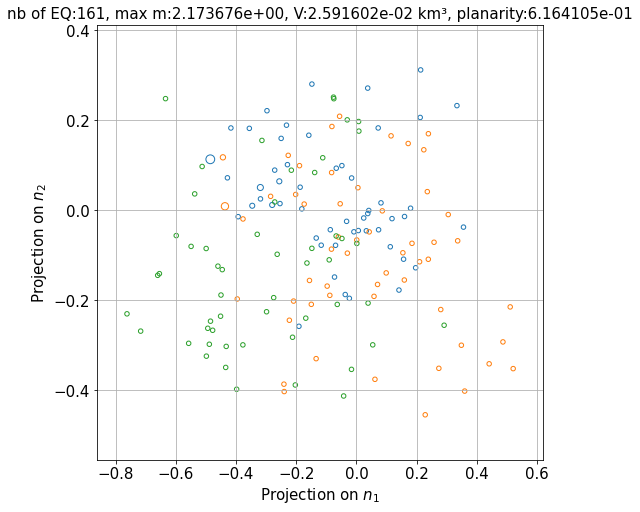

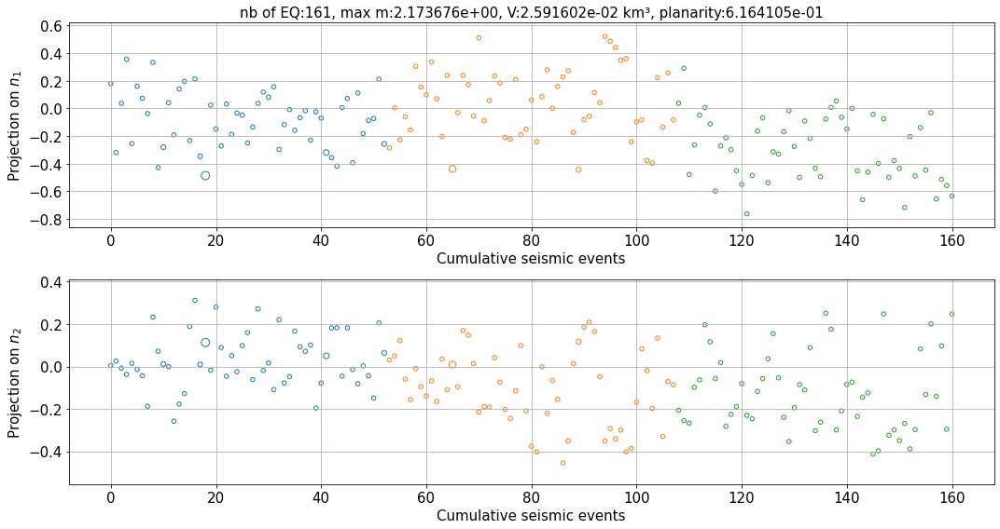

swarm n°: 9 
tiers_factor = 36


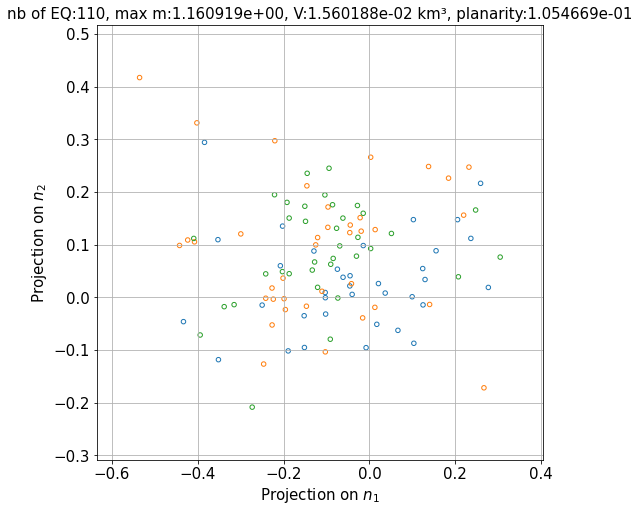

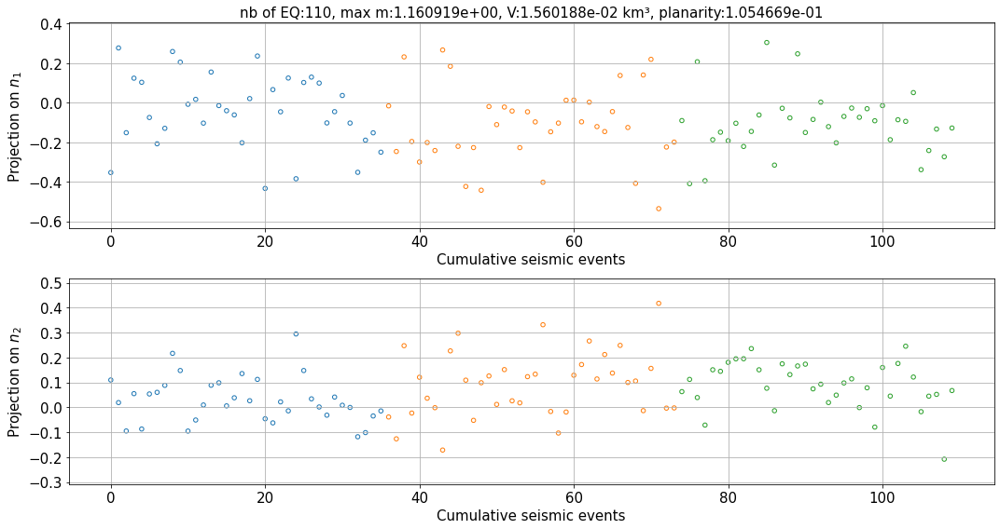

swarm n°: 10 
tiers_factor = 174


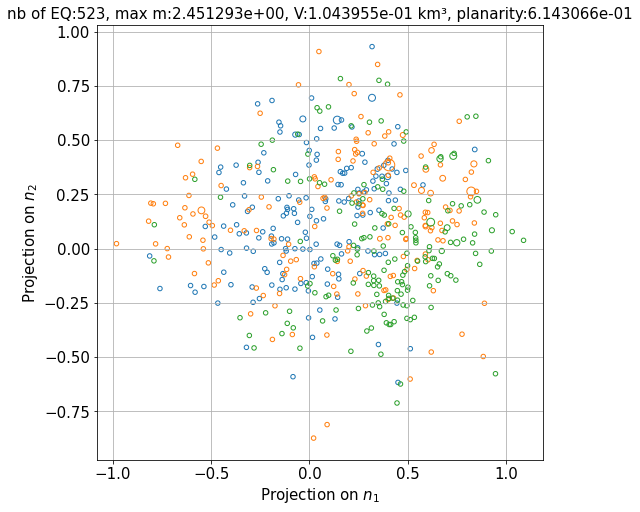

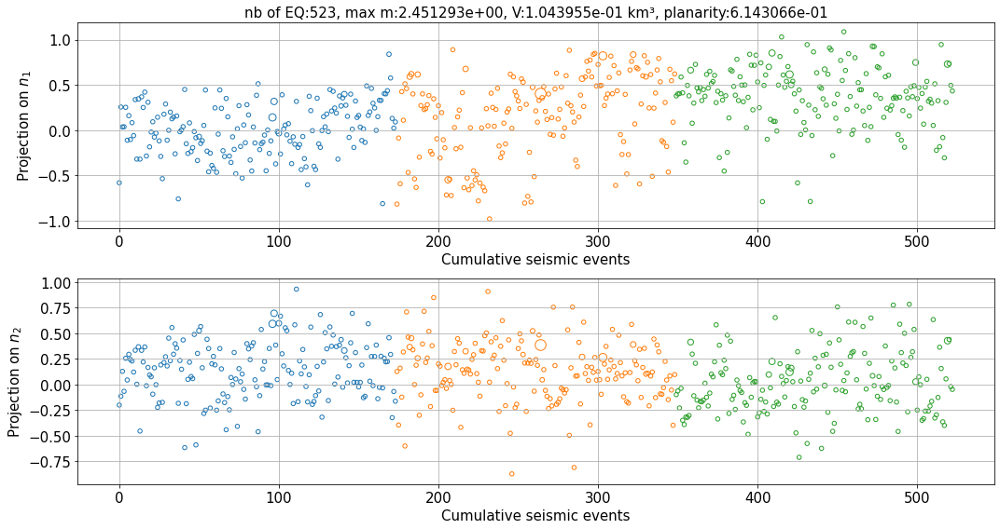

swarm n°: 11 
tiers_factor = 34


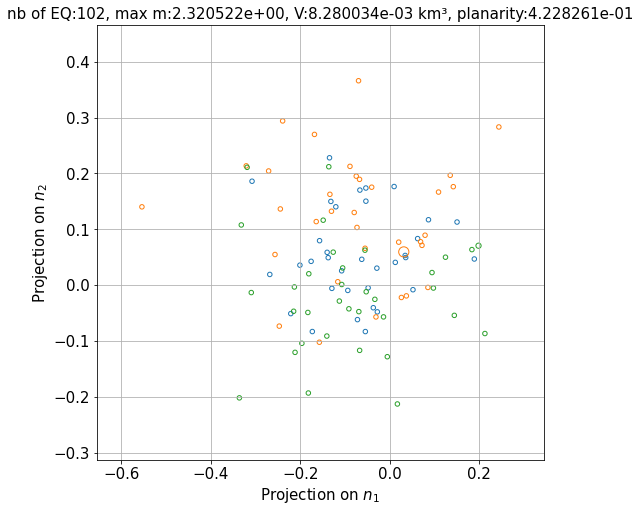

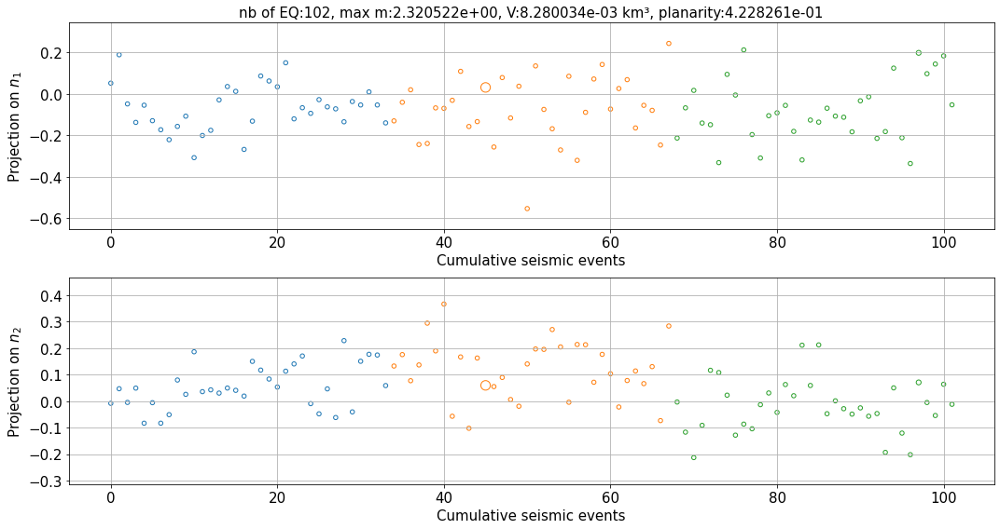

swarm n°: 12 
tiers_factor = 83


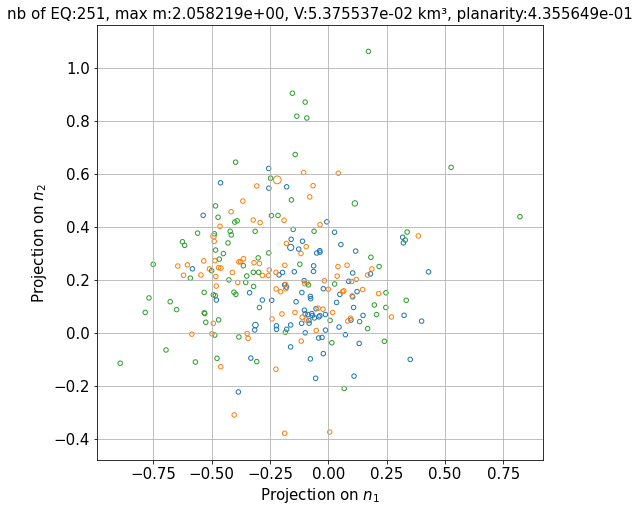

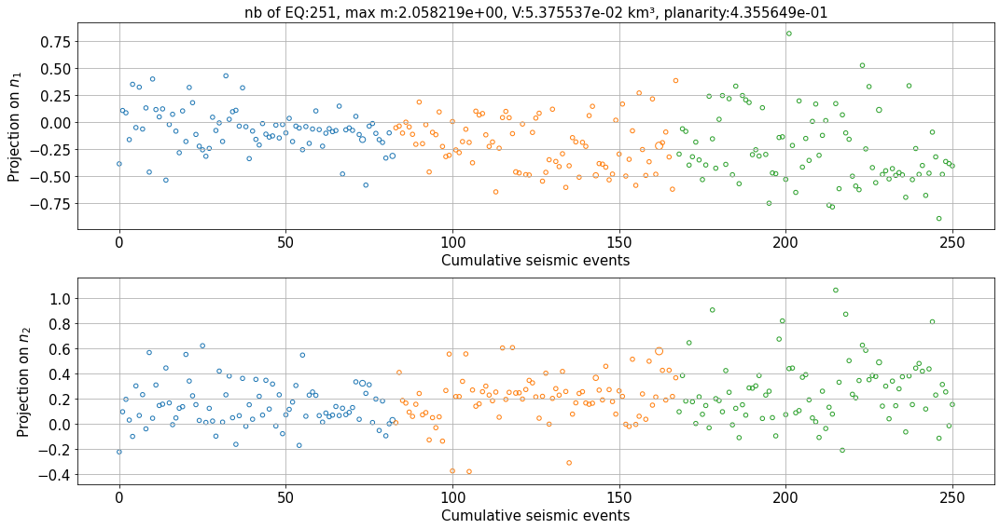

swarm n°: 13 
tiers_factor = 336


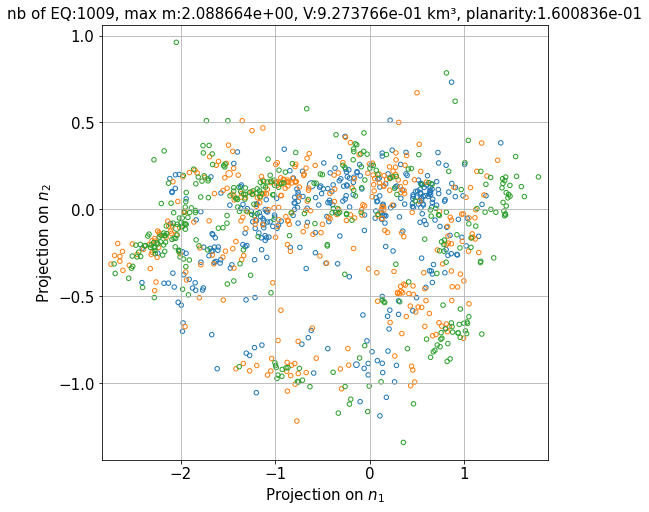

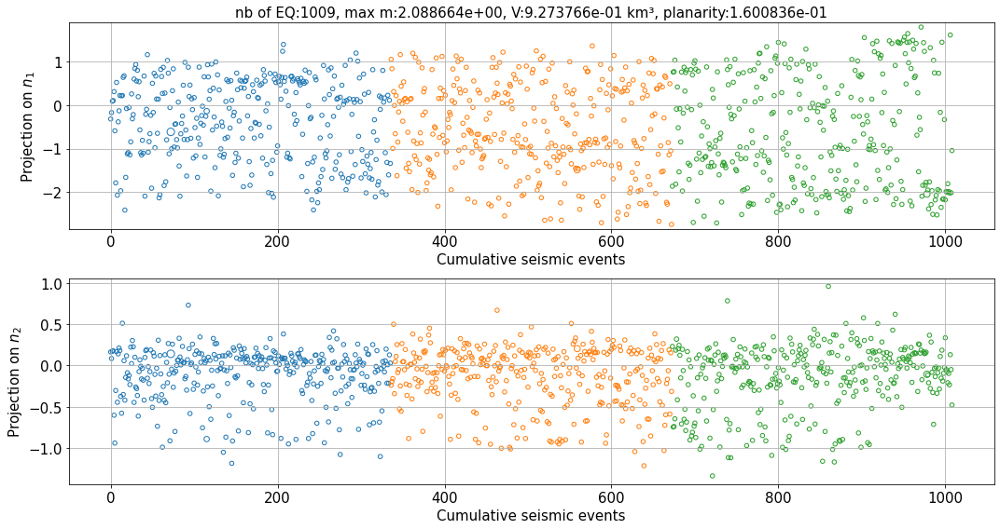

swarm n°: 14 
tiers_factor = 67


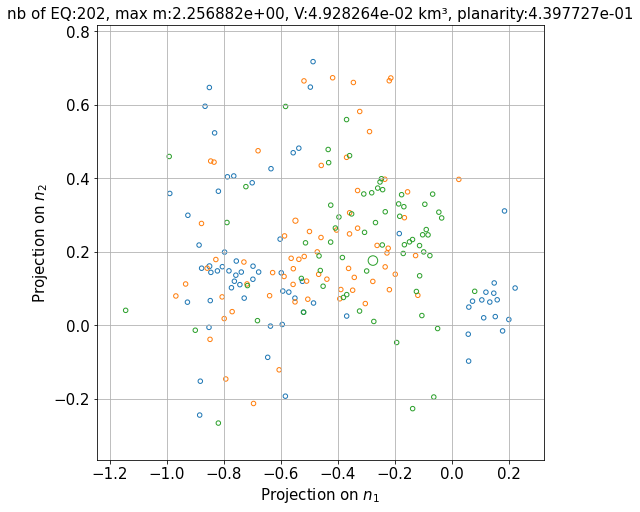

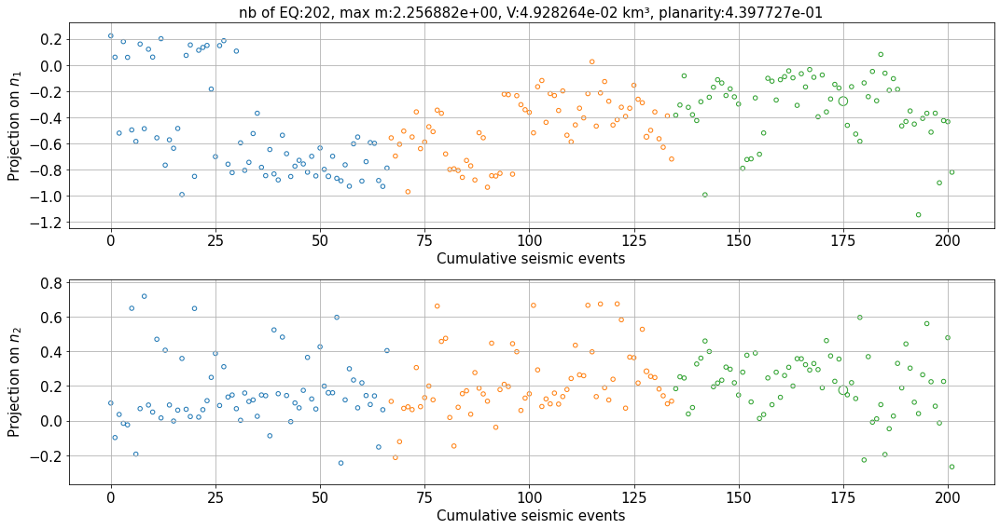

swarm n°: 15 
tiers_factor = 24


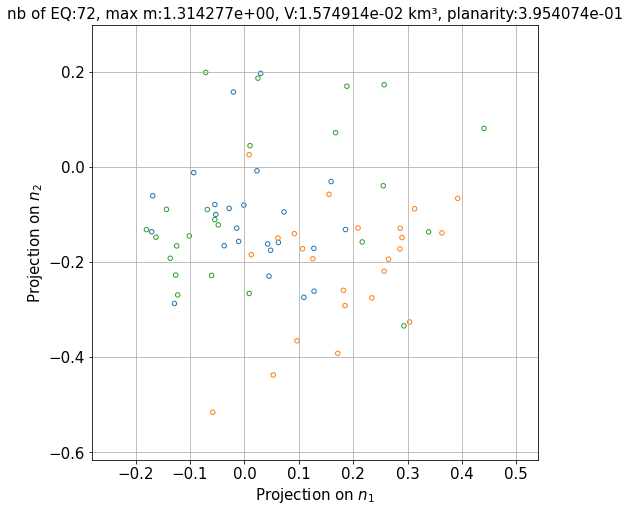

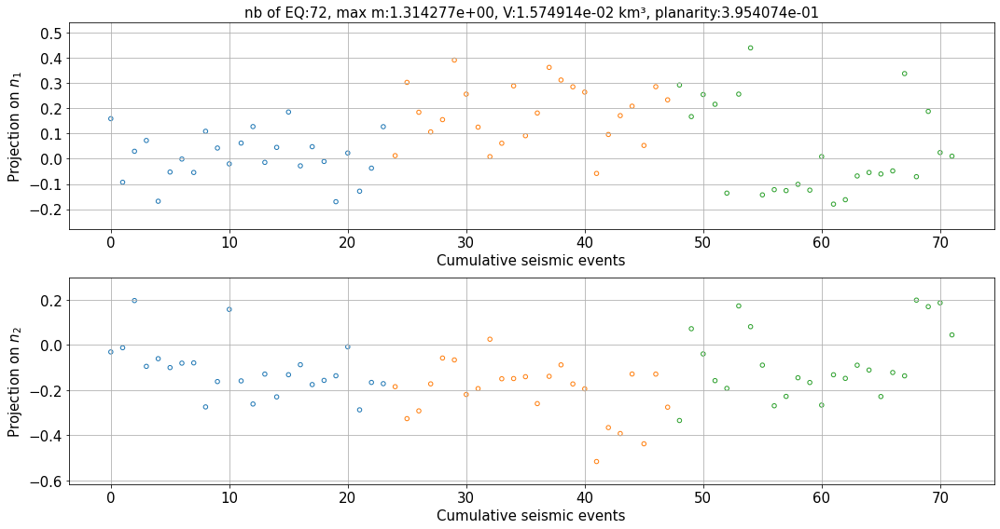

swarm n°: 16 
tiers_factor = 33


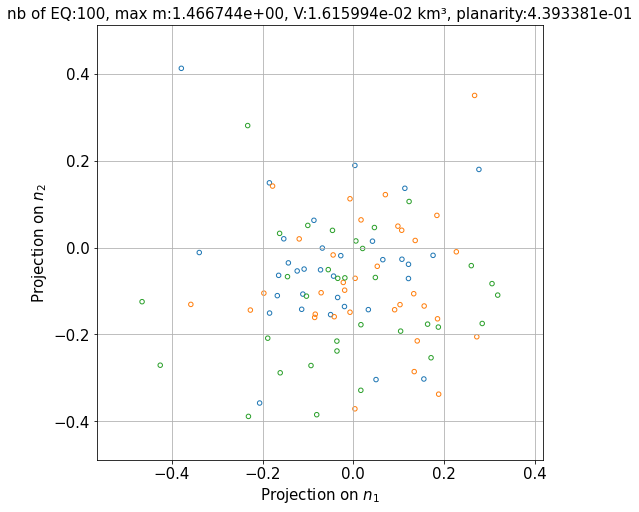

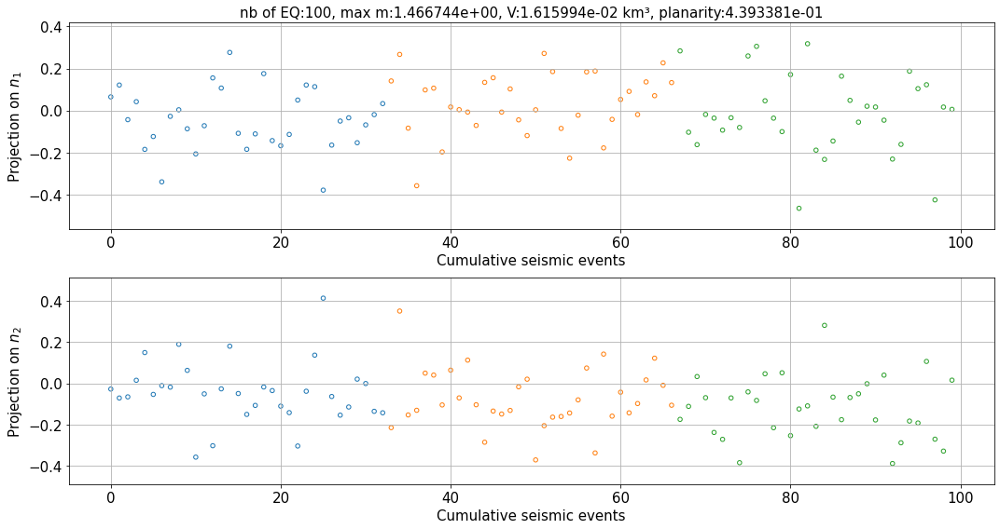

swarm n°: 17 
tiers_factor = 64


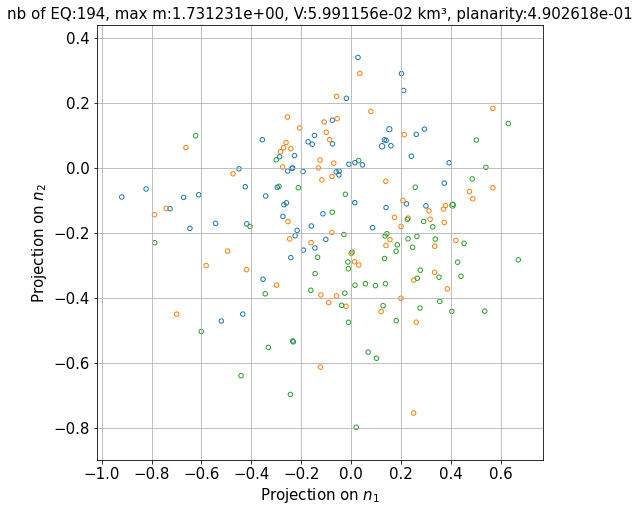

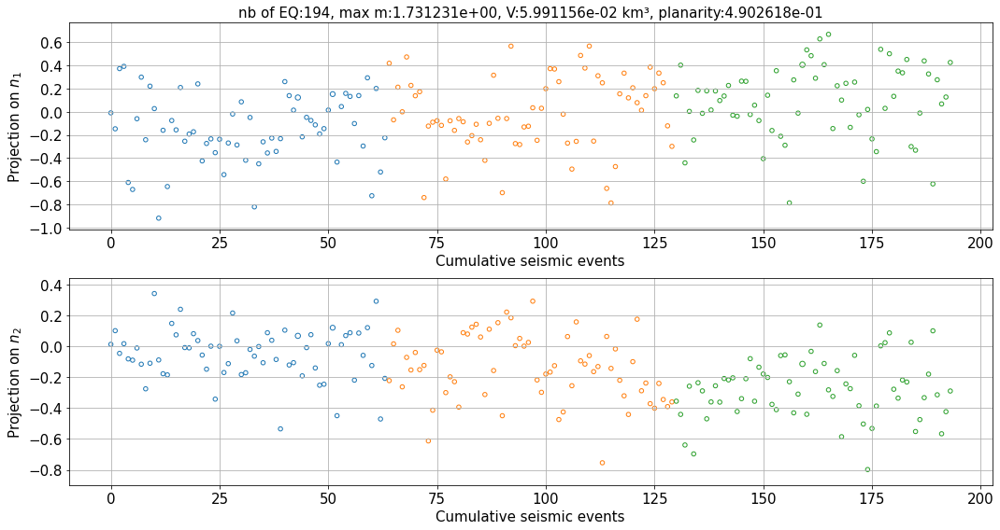

swarm n°: 18 
tiers_factor = 721


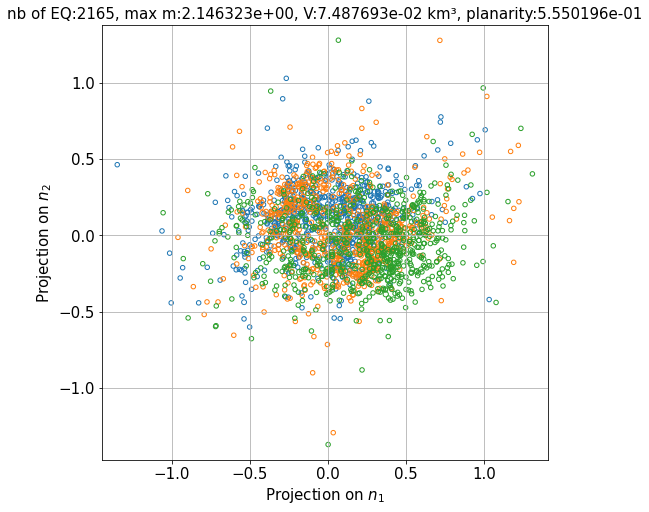

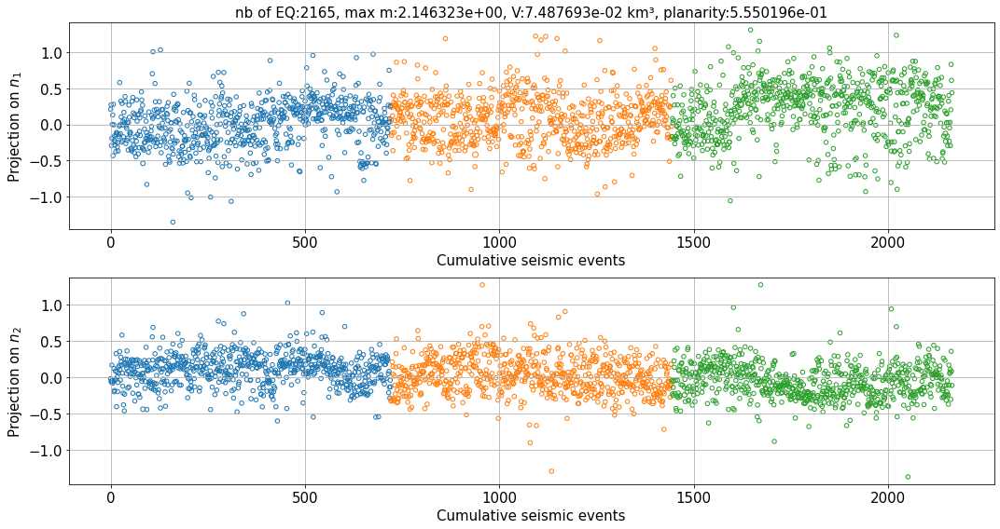

swarm n°: 19 
tiers_factor = 18


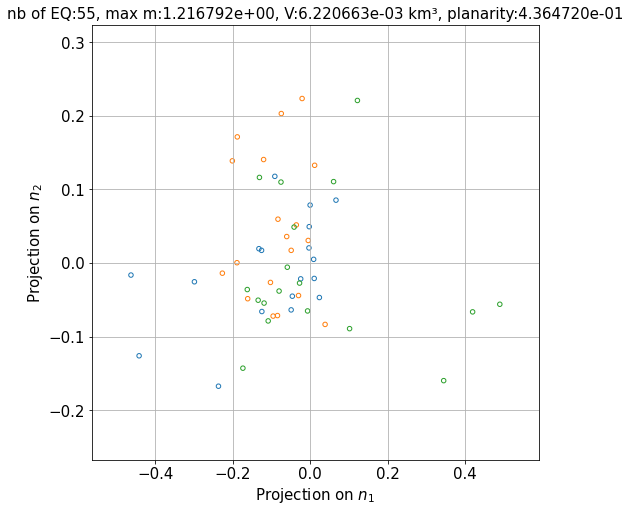

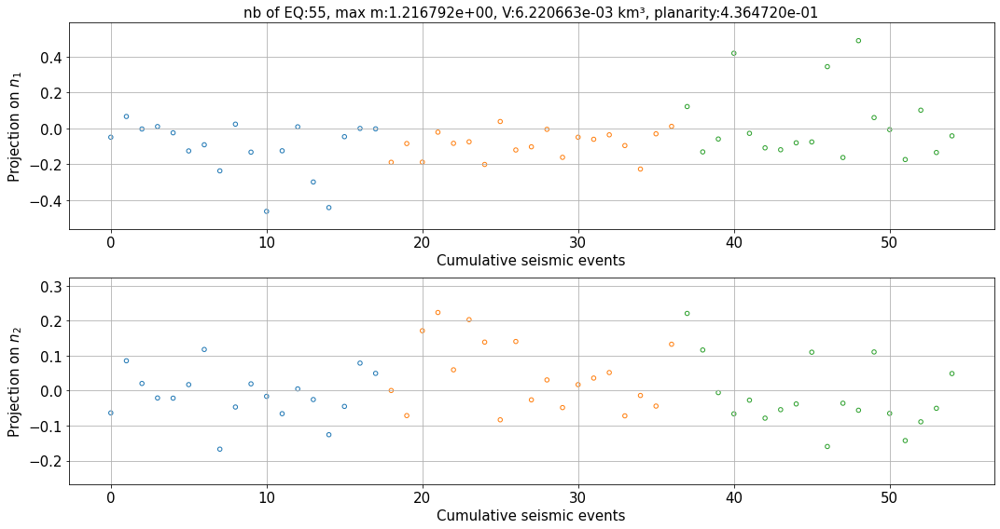

swarm n°: 20 
tiers_factor = 76


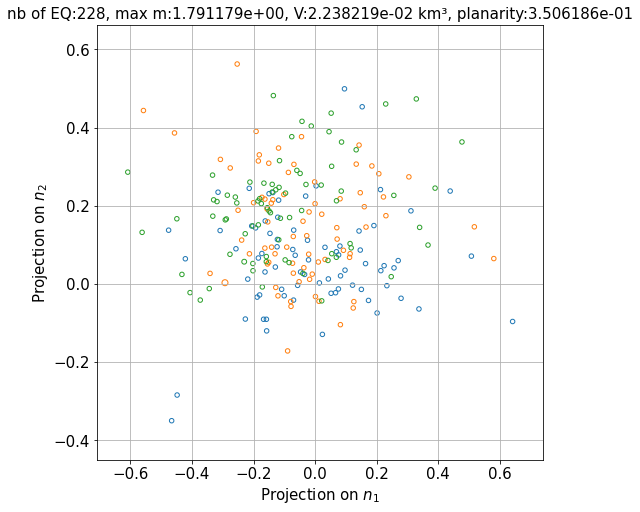

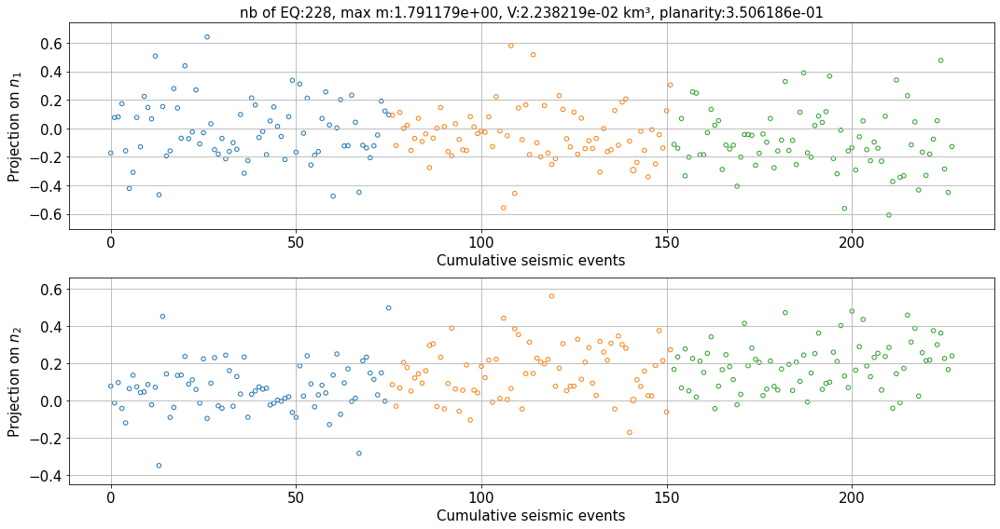

swarm n°: 21 
tiers_factor = 58


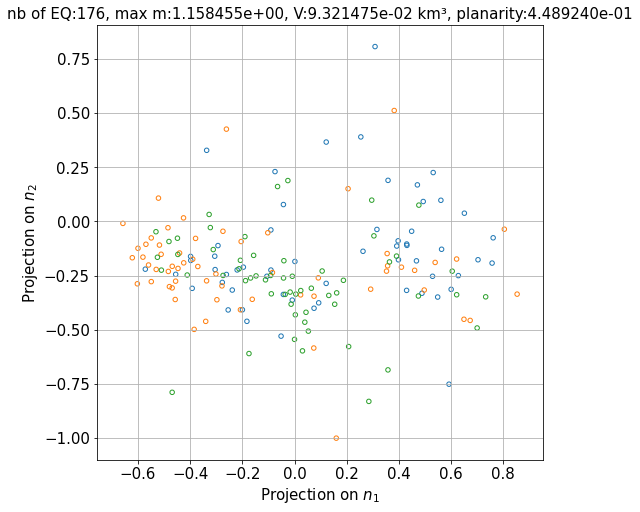

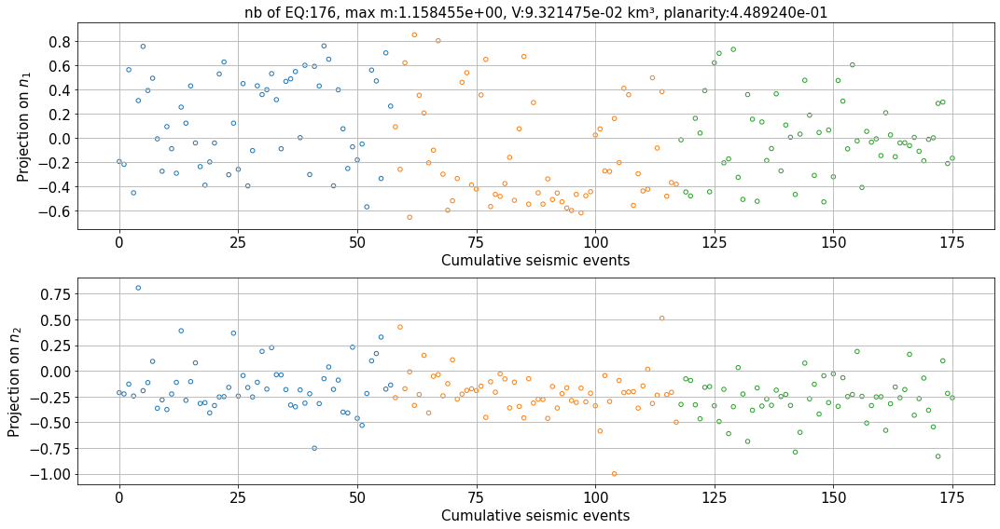

swarm n°: 22 
tiers_factor = 25


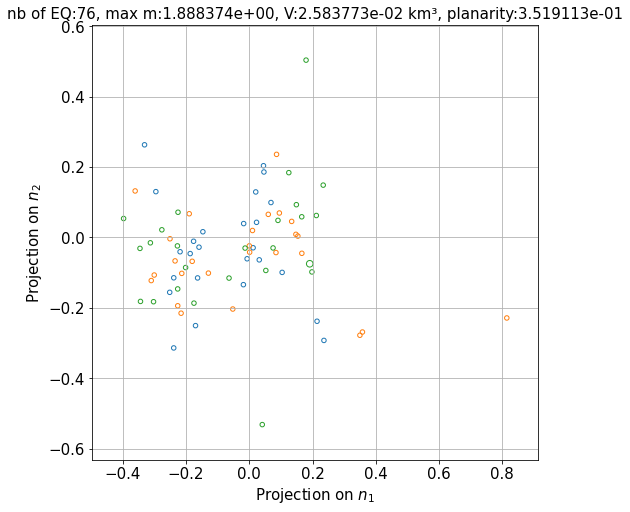

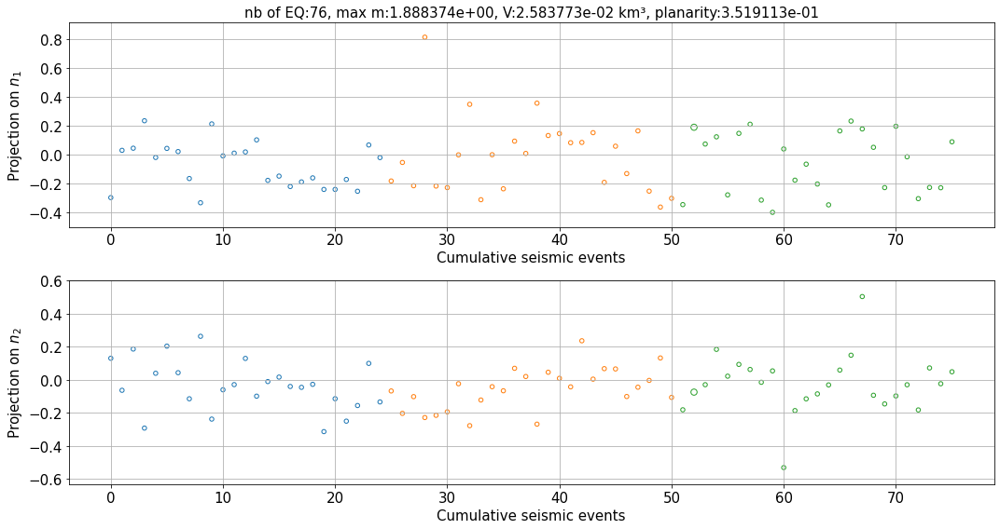

swarm n°: 23 
tiers_factor = 35


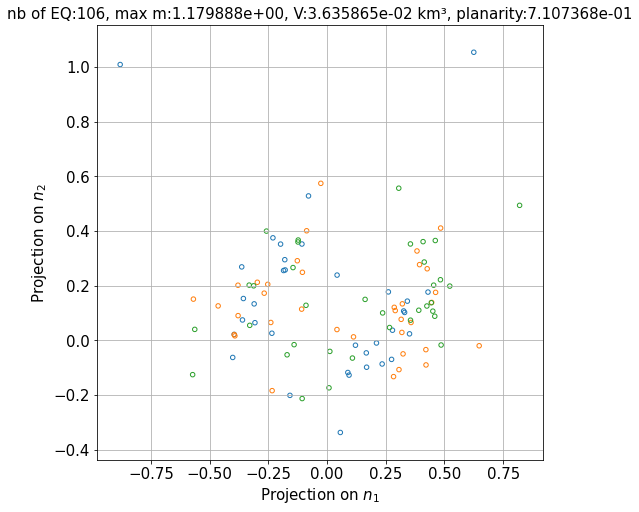

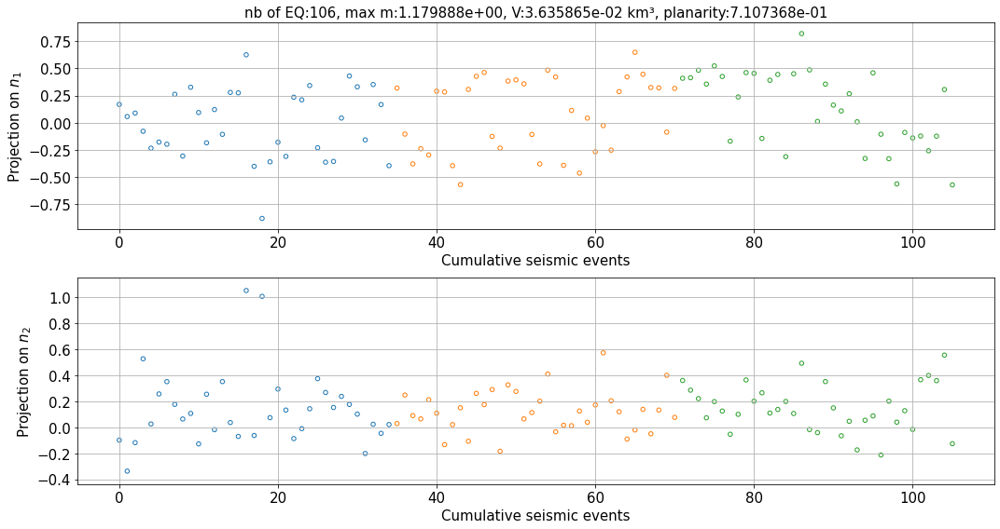

swarm n°: 24 
tiers_factor = 121


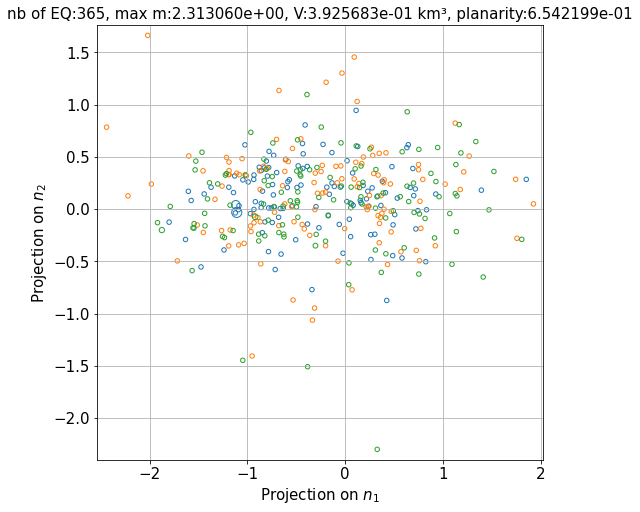

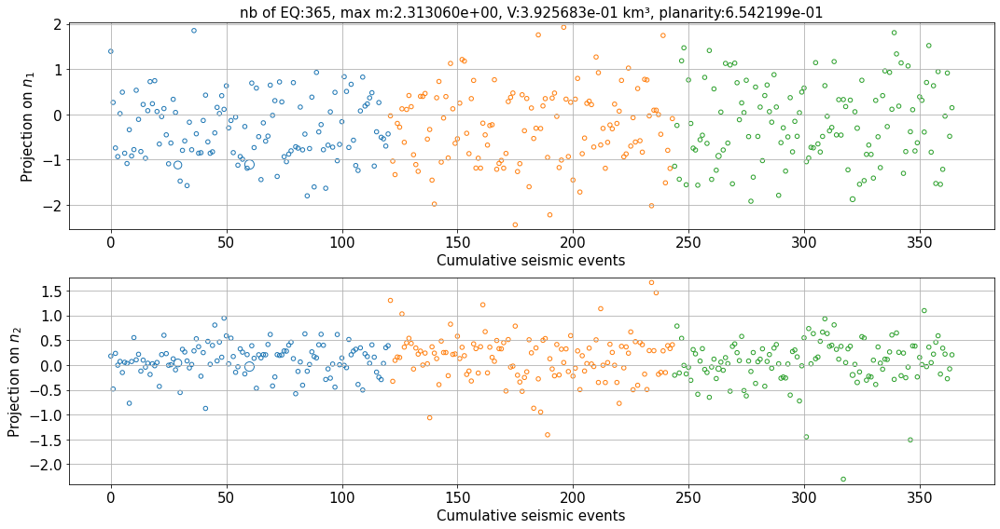

swarm n°: 25 
tiers_factor = 109


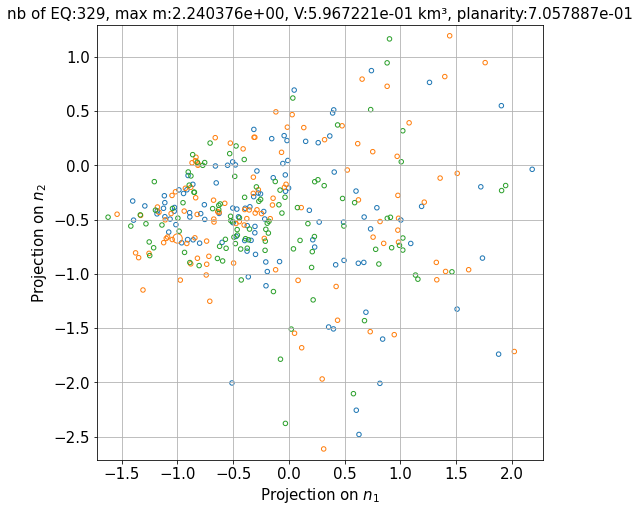

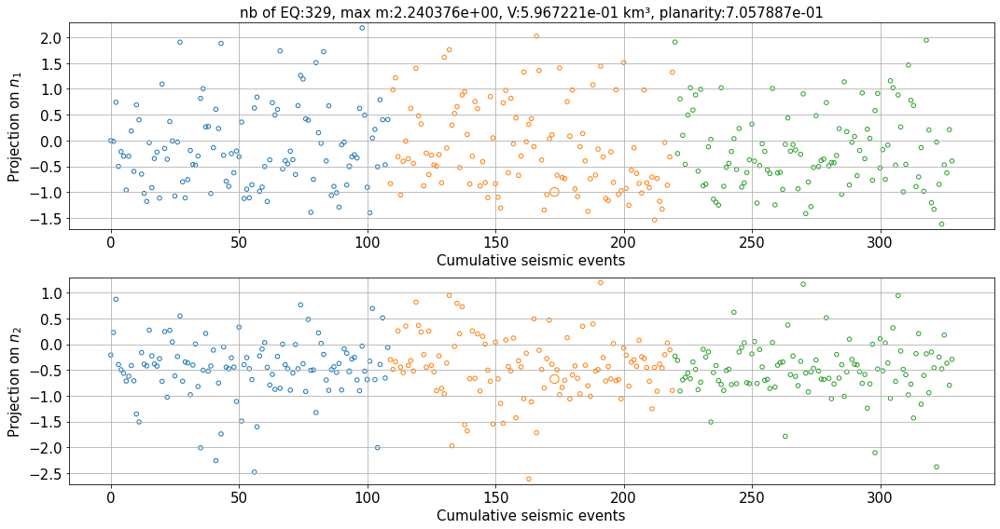

swarm n°: 26 
tiers_factor = 23


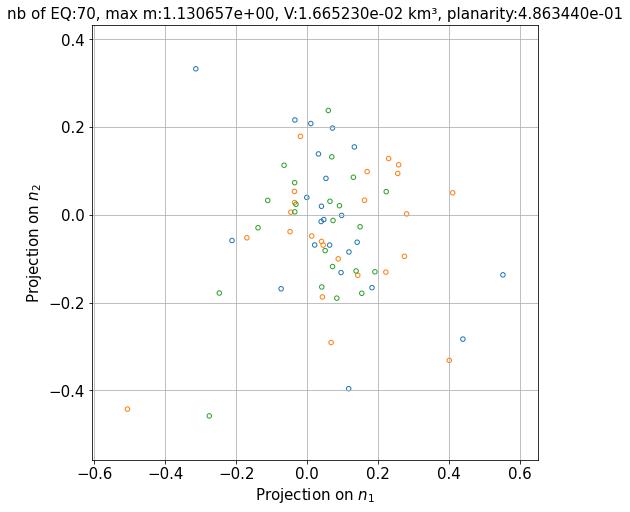

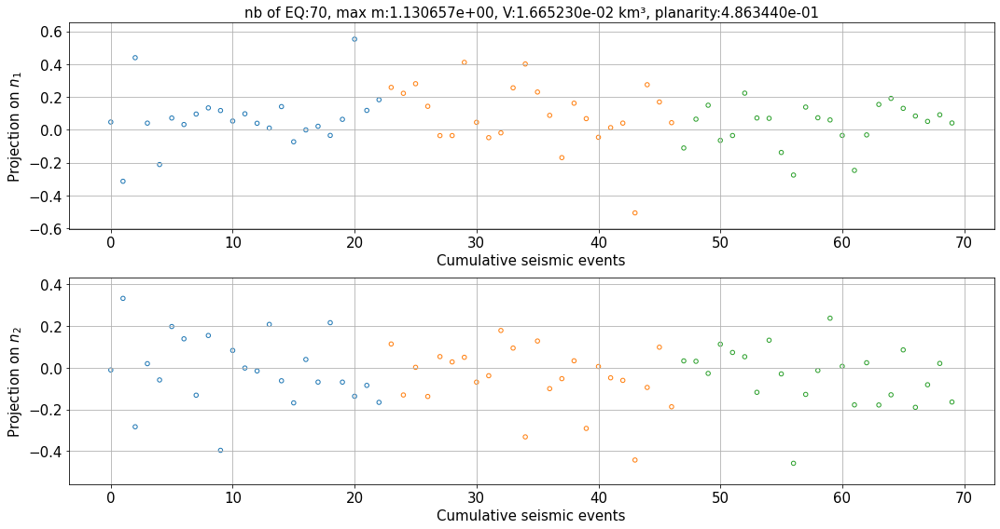

swarm n°: 27 
tiers_factor = 20


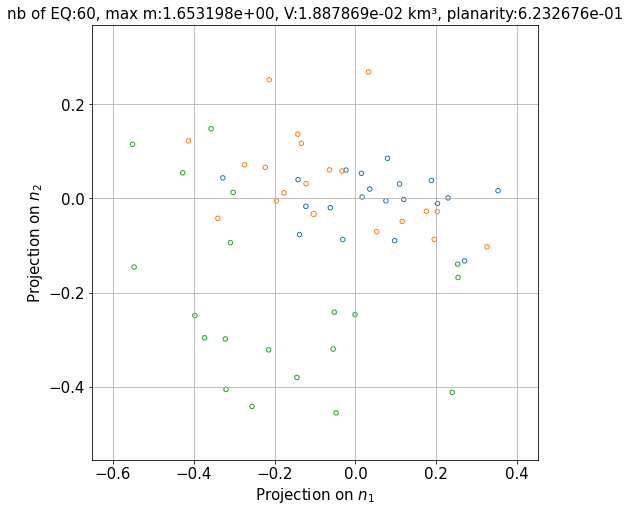

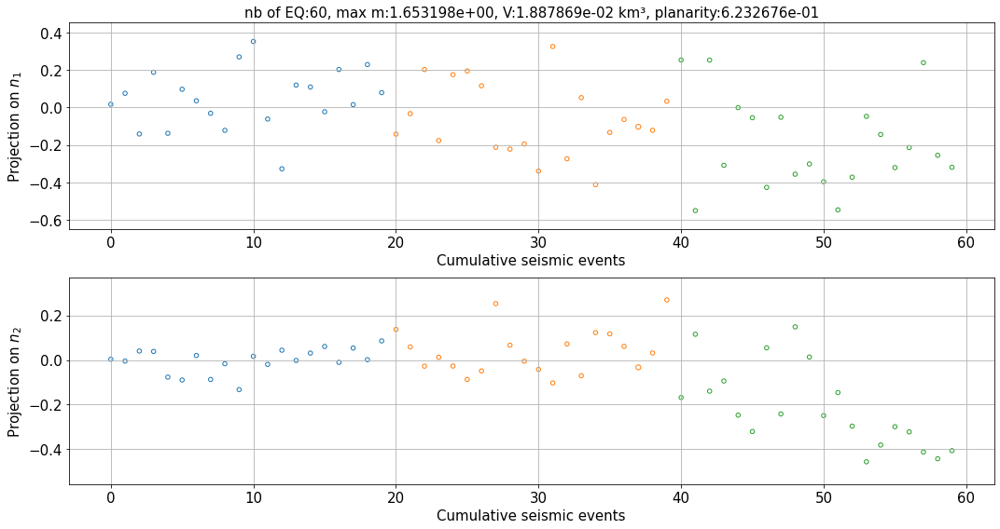

swarm n°: 28 
tiers_factor = 63


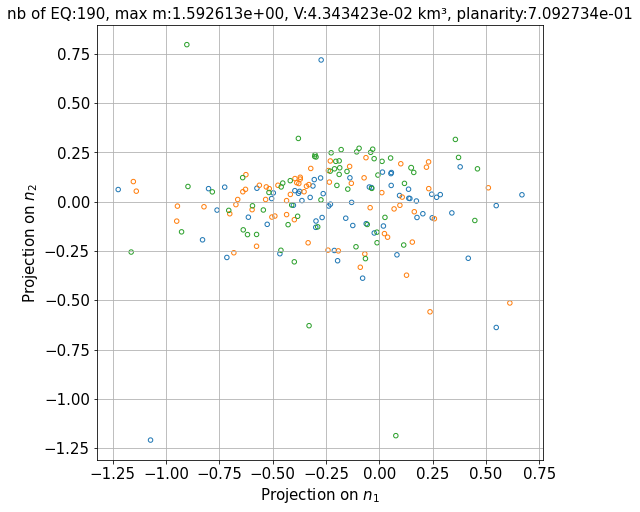

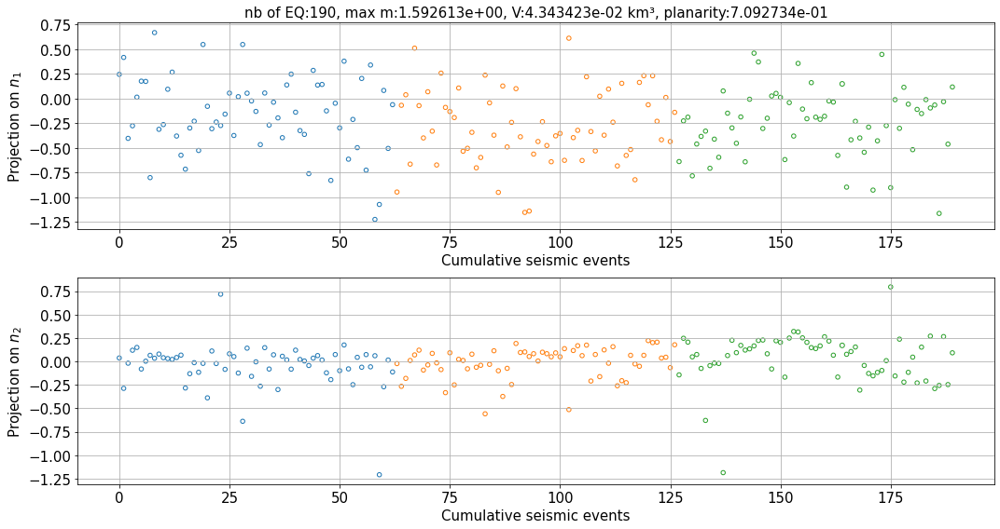

swarm n°: 29 
tiers_factor = 154


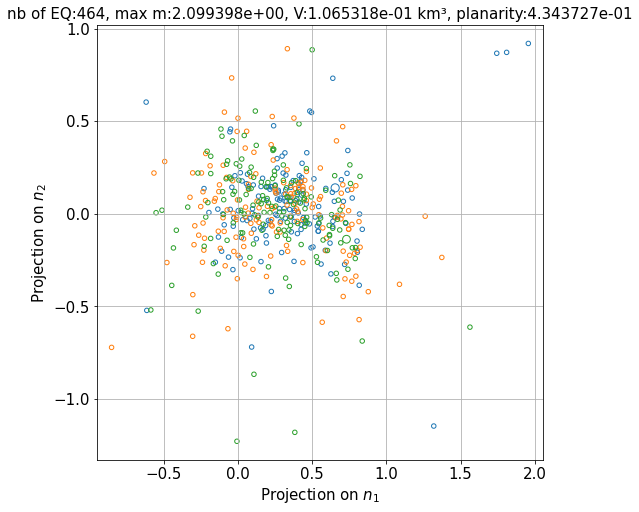

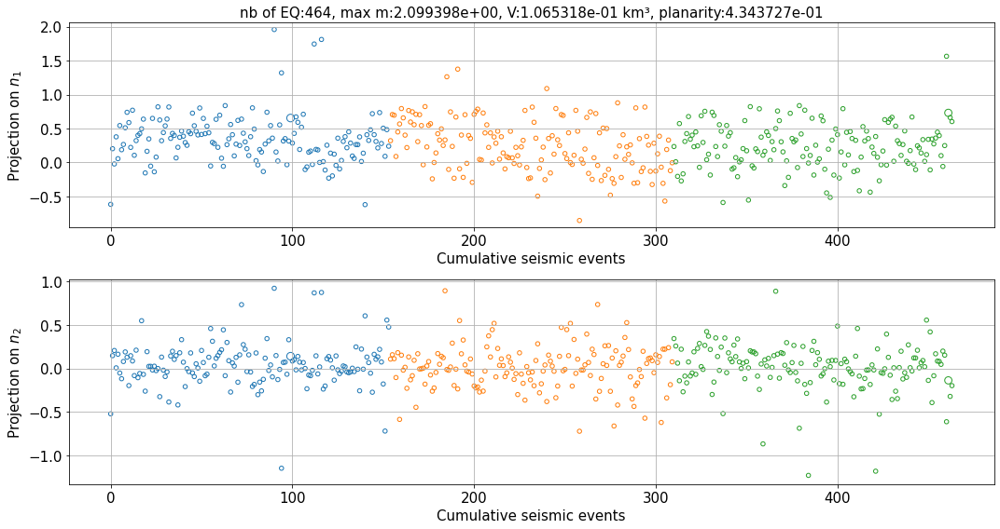

swarm n°: 30 
tiers_factor = 66


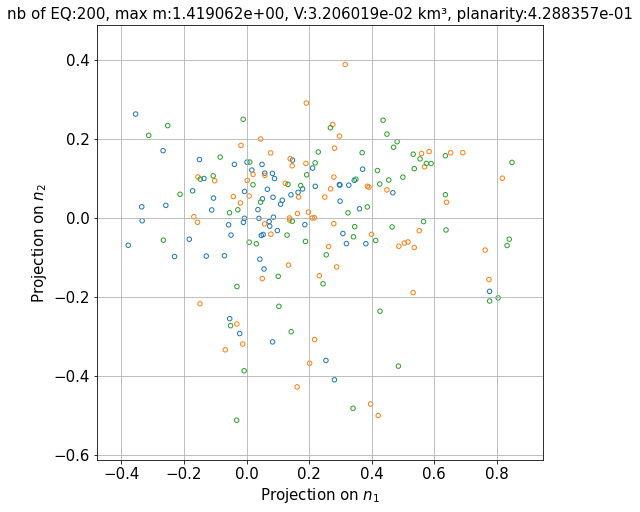

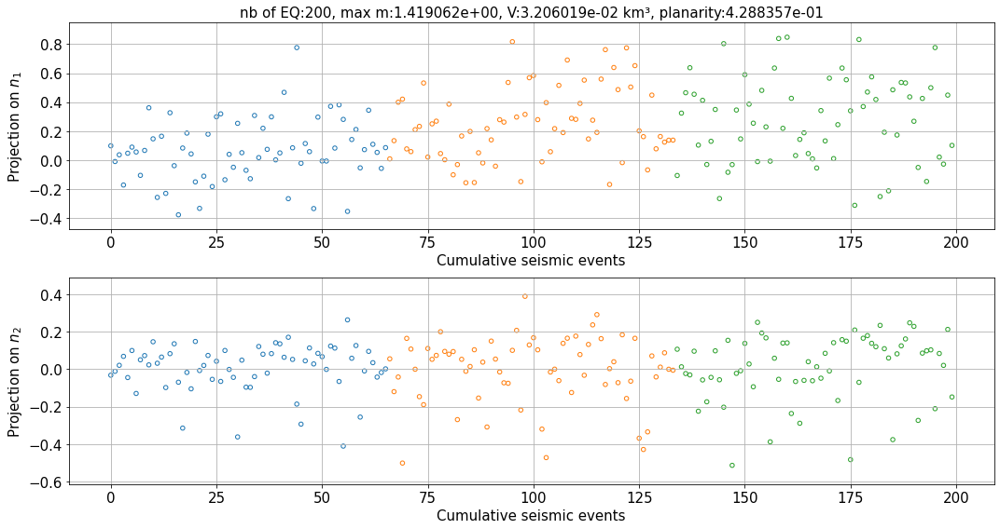

swarm n°: 31 
tiers_factor = 52


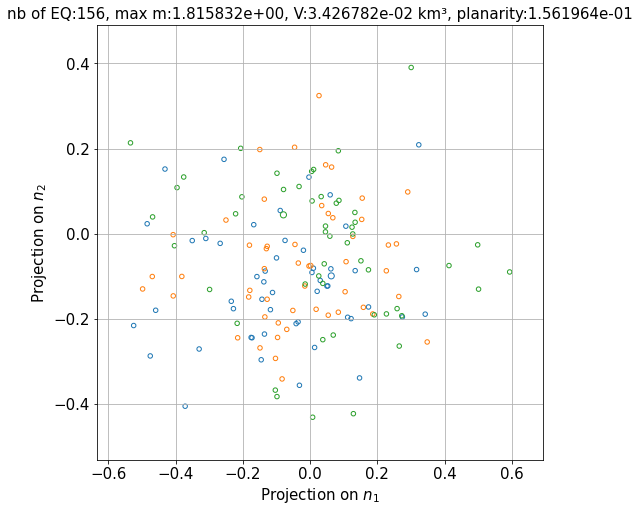

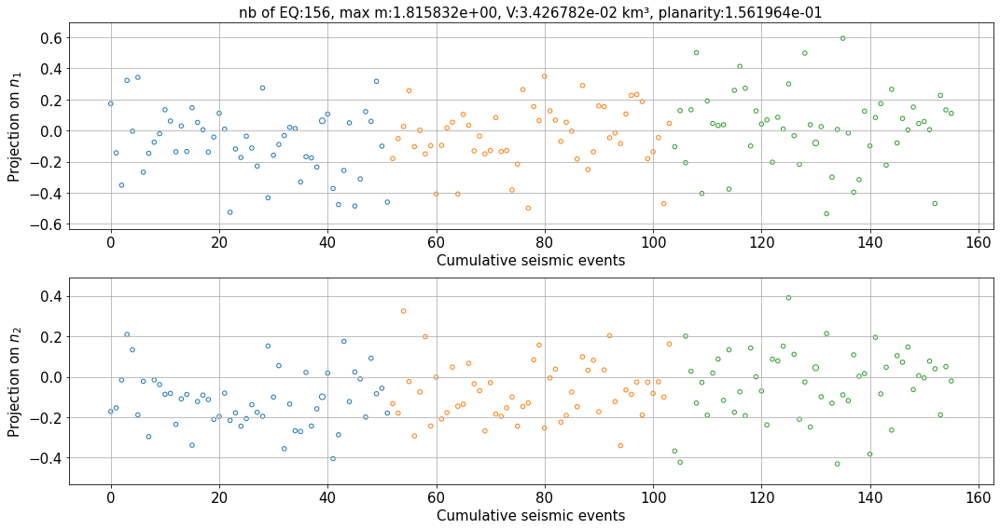

swarm n°: 32 
tiers_factor = 114


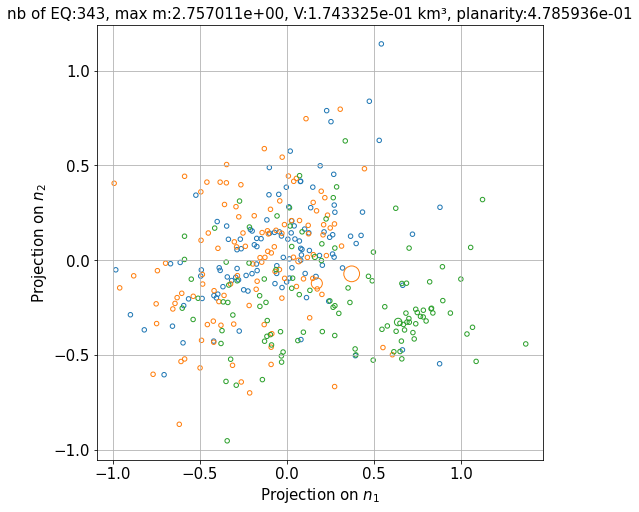

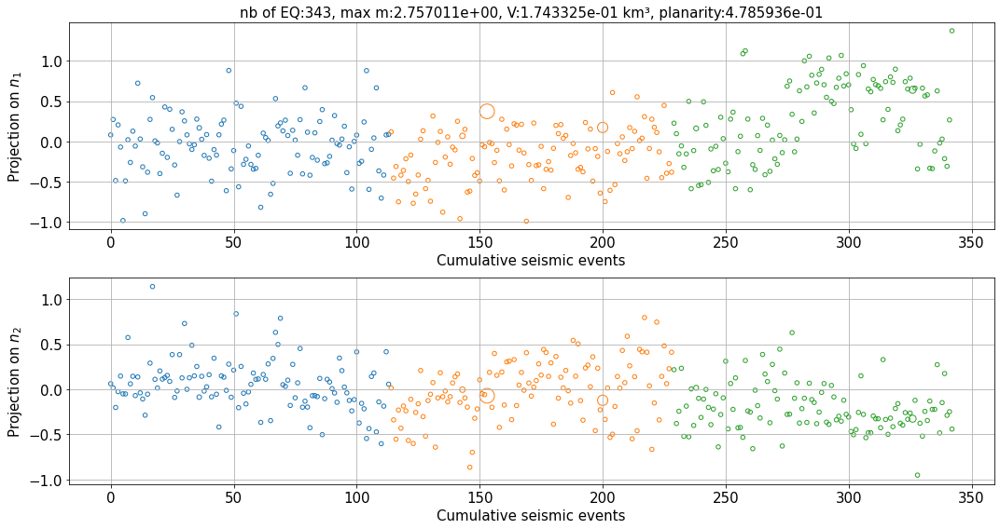

swarm n°: 33 
tiers_factor = 38


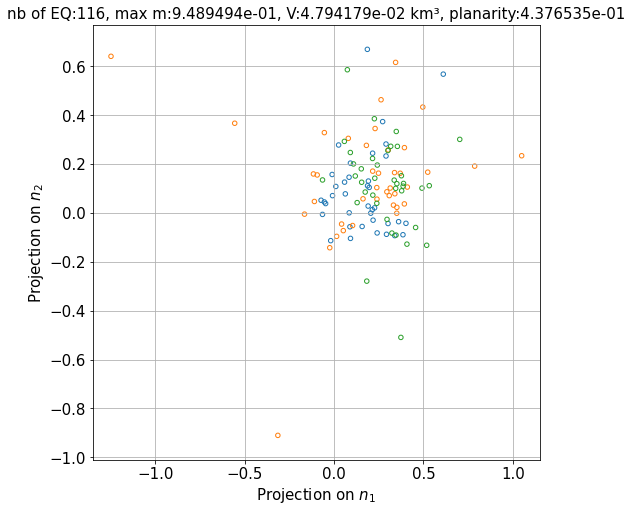

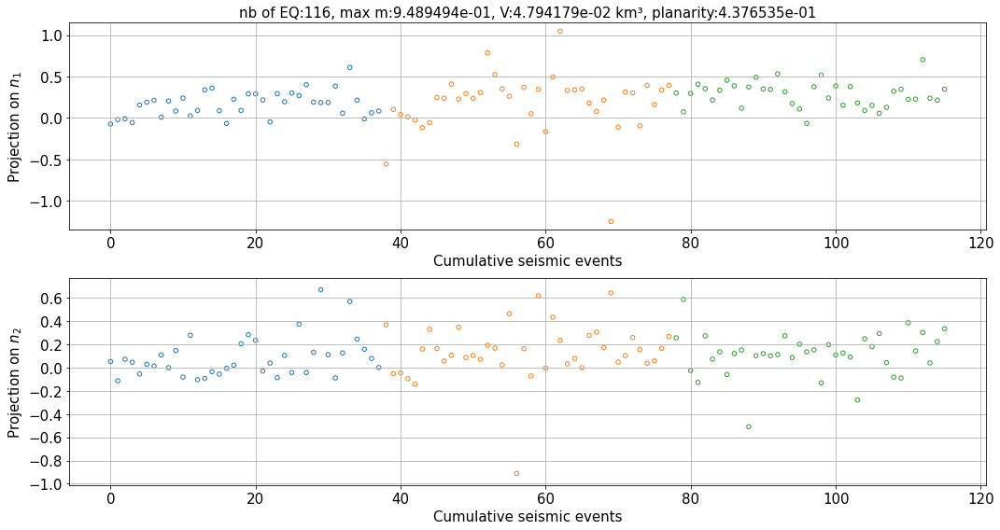

swarm n°: 34 
tiers_factor = 17


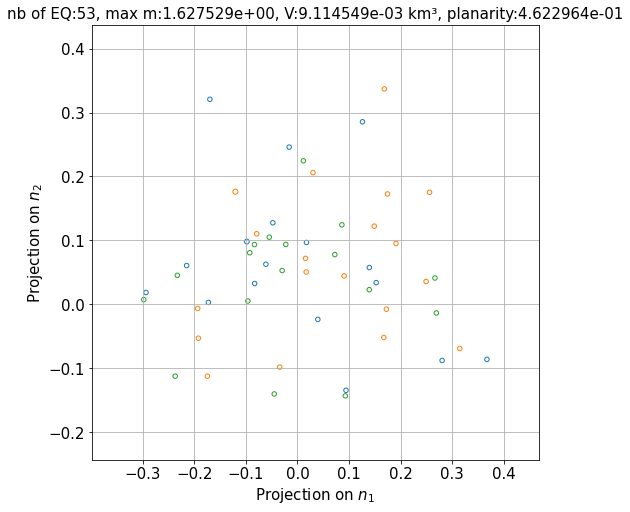

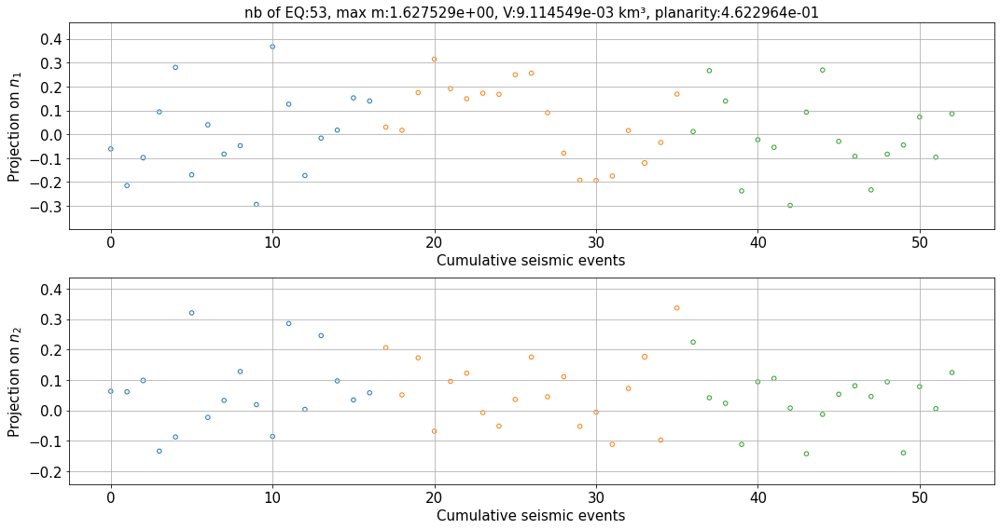

swarm n°: 35 
tiers_factor = 21


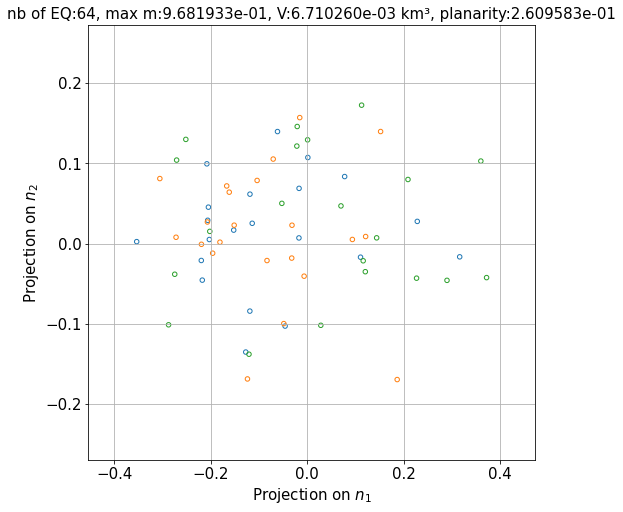

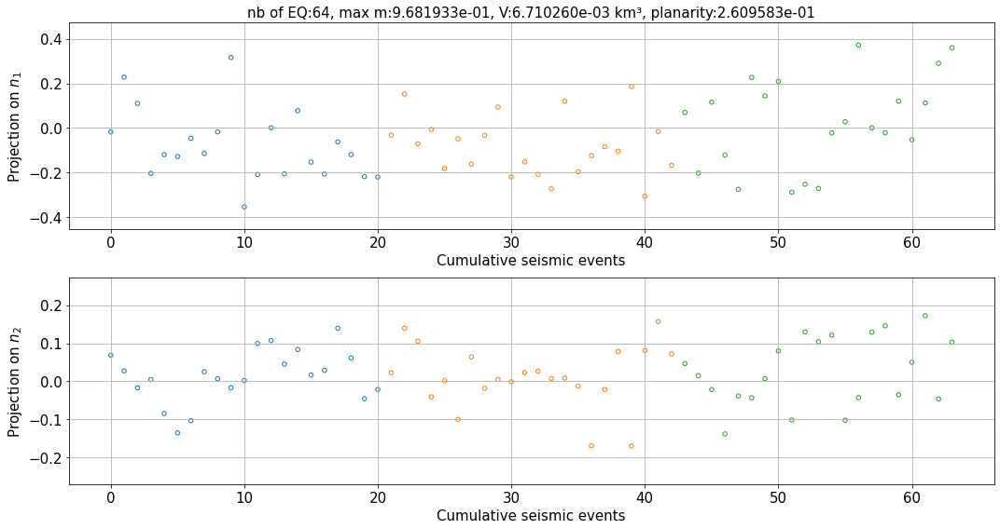

swarm n°: 36 
tiers_factor = 47


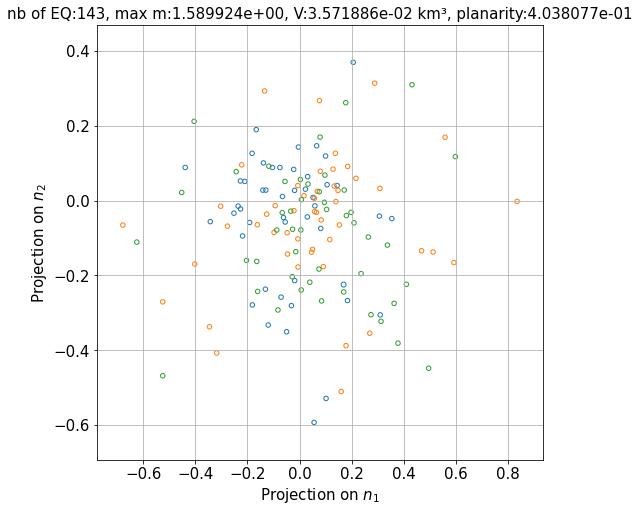

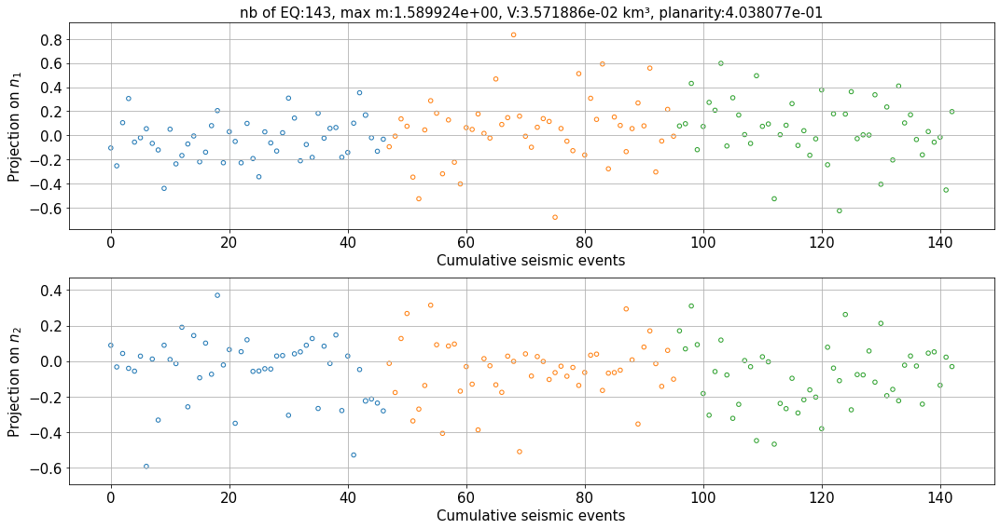

swarm n°: 37 
tiers_factor = 49


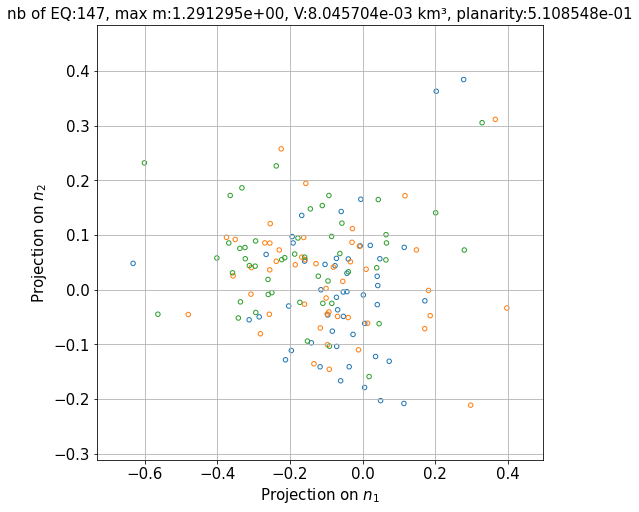

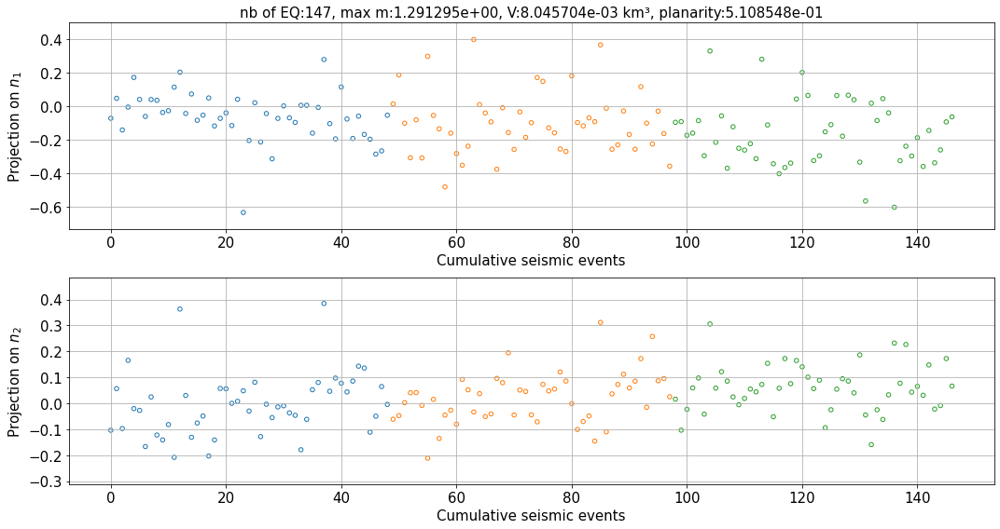

swarm n°: 38 
tiers_factor = 22


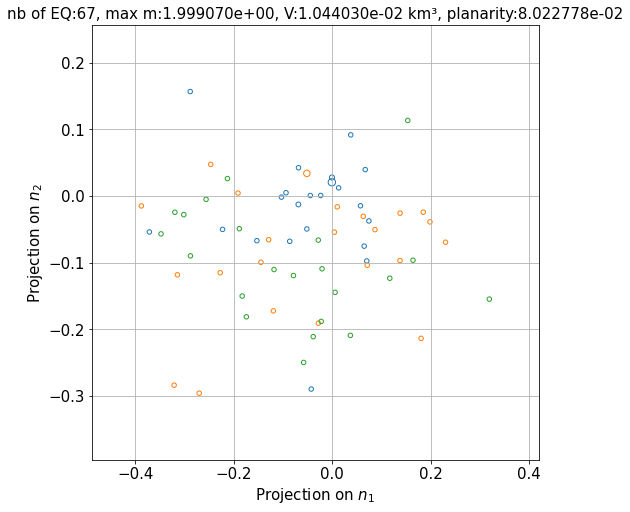

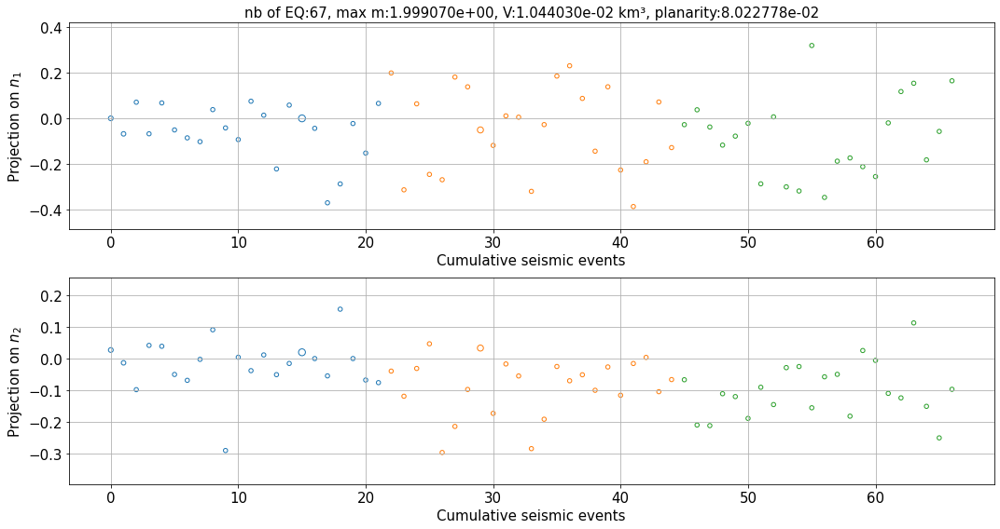

swarm n°: 39 
tiers_factor = 17


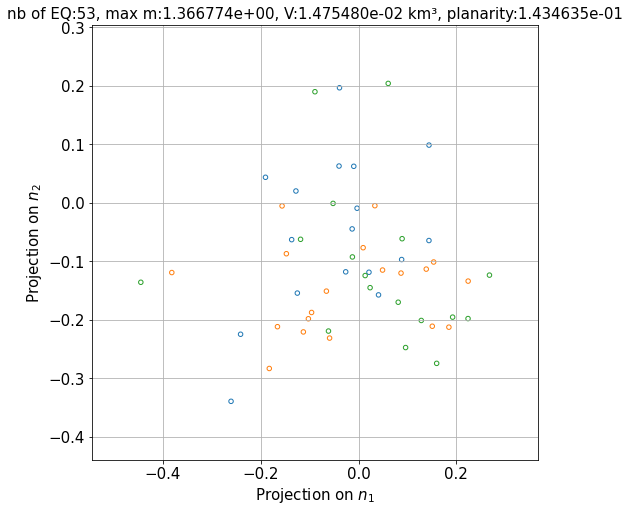

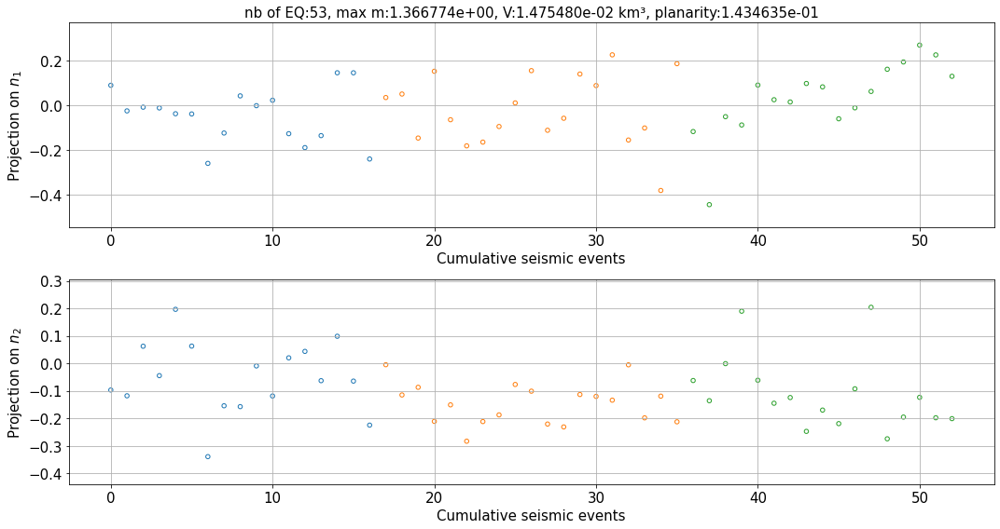

swarm n°: 40 
tiers_factor = 39


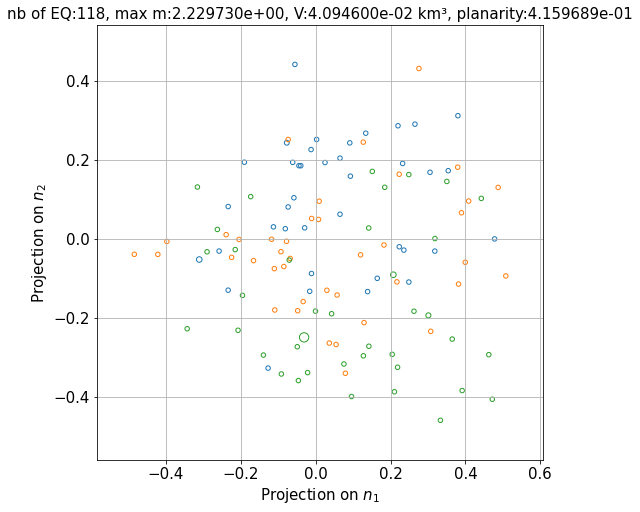

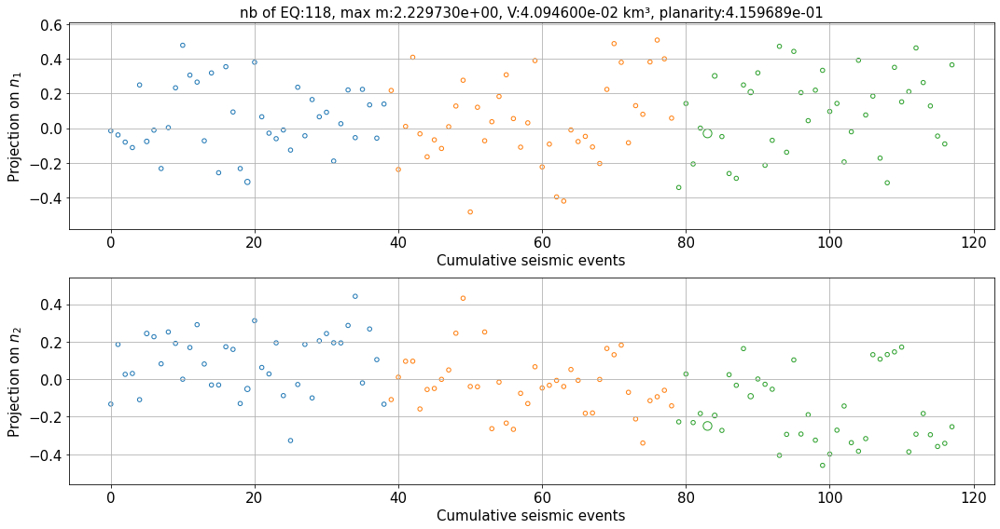

CPU times: user 28.7 s, sys: 21.8 s, total: 50.5 s
Wall time: 23.2 s


In [9]:
%%time

all_X1 = []
all_Y1 = []
all_I = []
all_m = []
all_T = []

#
for i in np.unique(df0.swarms_num)[1:] :
#for i in np.unique(df0.swarms_num)[1:3] :

    # select swarm:
    I = df0[df0.swarms_num == i]
    I.index = np.arange(0, len(I))
    all_I.append(I.index.values)
    all_T.append(I.t.values)
    all_m.append(I.m.values)
    
    #print target swarm:
    print("swarm n°:", int(i),"")

    #difference lat, lon, z:
    dx_km, dy_km, dz = I.x_km.max()-I.x_km.min(), I.y_km.max()-I.y_km.min(), I.z.max()-I.z.min() 
    
    #covariance matrix:
    cov = np.cov([I.x_km, I.y_km, I.z]) 
    #eigen values, vectors:
    ValP, VecP = np.linalg.eigh(cov)
    ValP = np.sqrt(ValP)
    ValP_sort = sorted(ValP, reverse = True) ##sort the array in descending order 
    arg_sort = np.argsort(ValP) ##give ascending order therefore if the biggest value is the max of arg_sort

    #compute volume based on eigen values:
    V2 = ValP[0]*ValP[1]*ValP[2]*2**3##volume basé sure l'écart-type plus robuste 
    #compute planarity based on eigen values:
    plana = 1 - (ValP_sort[2]/ValP_sort[1]) #1-thickness/lat
    
    #projection:
    ##get centroid of the first 5 points:
    centroid5 = np.array([np.mean(I.x_km.iloc[:5]),
                         np.mean(I.y_km.iloc[:5]),
                         np.mean(I.z.iloc[:5]),
                         np.mean(I.t.iloc[:5])])
    
    x1, y1, z1 = centroid5[0], centroid5[1], centroid5[2]
    
    OM = np.array([I.x_km.values - x1, I.y_km.values - y1, I.z.values - z1])
    
    n1, n2 = VecP[:,np.max(arg_sort)], VecP[:,np.max(arg_sort)-1] ##length, width
    
    X1 = np.dot(OM.T, n1)
    Y1 = np.dot(OM.T, n2)
    
    all_X1.append(X1)
    all_Y1.append(Y1)
    
    #plot diffusion map lat vs lon (x-y-axis) along time (3 differents colors, divising the cluster into 3):
    tiers_factor = int(np.floor(len(I)/3))
    print("tiers_factor =", tiers_factor)
    
    X1_tiers1, Y1_tiers1 = X1[0:tiers_factor], Y1[0:tiers_factor]
    X1_tiers2, Y1_tiers2 = X1[tiers_factor:-tiers_factor], Y1[tiers_factor:-tiers_factor]
    X1_tiers3, Y1_tiers3 = X1[-tiers_factor:], Y1[-tiers_factor:]
    
    #define a minimum size of representation:
    m_size = np.exp(2*I.m)
    
    m_size_factor = 20 ##<=> m=2.99, for m_size_factor = 30 <=> m=3.4
    
    m_size.mask(m_size <=m_size_factor ,int(m_size_factor), inplace=True)
    
    m_size1 = m_size.iloc[0:tiers_factor]
    m_size2 = m_size.iloc[tiers_factor:-tiers_factor]
    m_size3 = m_size.iloc[-tiers_factor:]
    
    plt.figure(figsize=(8,8))
    #plt.scatter(Y1, X1, s=np.exp(3*I.m), facecolors='none', edgecolors='k', linewidths=1)
    plt.scatter(X1_tiers1, Y1_tiers1, s=m_size1, facecolors='none', edgecolors='tab:blue', linewidths=1)
    plt.scatter(X1_tiers2, Y1_tiers2, s=m_size2, facecolors='none', edgecolors='tab:orange', linewidths=1)
    plt.scatter(X1_tiers3, Y1_tiers3, s=m_size3, facecolors='none', edgecolors='tab:green', linewidths=1)
    plt.xlabel("Projection on $n_1$", fontsize=15)
    plt.ylabel("Projection on $n_2$", fontsize=15)
    plt.title("nb of EQ:" + str(len(I)) + ", max m:"+ str("{:e}".format(np.max(I.m))) + ", V:" + str("{:e}".format(V2)) + " km³, planarity:"+ str("{:e}".format(plana)), fontsize=15)
    plt.xlim((np.min(X1)-0.1, np.max(X1)+0.1))
    plt.ylim((np.min(Y1)-0.1, np.max(Y1)+0.1))
    plt.xticks(fontsize=15,)
    plt.yticks(fontsize=15,)
    #plt.axis('equal')
    plt.grid(True)
    #plt.savefig("fig_diffusion/map/map_proj_3times_swarm"+str(int(i))+".png")
    plt.show()
    
    plt.figure(figsize=(15,8))
    plt.subplot(2,1,1)
    #plt.scatter(I.t, X1, s=np.exp(3*I.m), facecolors='none', edgecolors='k', linewidths=1)
    plt.scatter(I.index[0:tiers_factor], X1_tiers1, s=m_size1, facecolors='none', edgecolors='tab:blue', linewidths=1)
    plt.scatter(I.index[tiers_factor:-tiers_factor], X1_tiers2, s=m_size2, facecolors='none', edgecolors='tab:orange', linewidths=1)
    plt.scatter(I.index[-tiers_factor:], X1_tiers3, s=m_size3, facecolors='none', edgecolors='tab:green', linewidths=1)
    plt.xlabel("Cumulative seismic events", fontsize=15)
    plt.ylabel("Projection on $n_1$", fontsize=15)
    plt.title("nb of EQ:" + str(len(I)) + ", max m:"+ str("{:e}".format(np.max(I.m))) + ", V:" + str("{:e}".format(V2)) + " km³, planarity:"+ str("{:e}".format(plana)), fontsize=15)
    plt.ylim((np.min(X1)-0.1, np.max(X1)+0.1))
    plt.xticks(fontsize=15,)
    plt.yticks(fontsize=15,)
    plt.grid(True)
    
    plt.subplot(2,1,2)
    #plt.scatter(I.t, Y1, s=np.exp(3*I.m), facecolors='none', edgecolors='k', linewidths=1)
    plt.scatter(I.index[0:tiers_factor], Y1_tiers1, s=m_size1, facecolors='none', edgecolors='tab:blue', linewidths=1)
    plt.scatter(I.index[tiers_factor:-tiers_factor], Y1_tiers2, s=m_size2, facecolors='none', edgecolors='tab:orange', linewidths=1)
    plt.scatter(I.index[-tiers_factor:], Y1_tiers3, s=m_size3, facecolors='none', edgecolors='tab:green', linewidths=1)
    plt.xlabel("Cumulative seismic events", fontsize=15)
    plt.ylabel("Projection on $n_2$", fontsize=15)
    plt.ylim((np.min(Y1)-0.1, np.max(Y1)+0.1))
    plt.xticks(fontsize=15,)
    plt.yticks(fontsize=15,)
    plt.grid(True)
    plt.tight_layout()
    #plt.savefig("fig_diffusion/2_proj/2plots_3times_swarm"+str(int(i))+".png")
    plt.show()

## Régression linéaire :

## $n_1$ or $n_2$ along cumul seis events:

## Computing linear regression model by ourself:

In [10]:
def restructure_df(X, Y, I, M, T):
    
    """
    For one target cluster:
        X: a list containing all projection on n1 values.
        Y: a list containing all projection on n2 values.
        I: a list containing all index values.
        M: a list containing all magnitude values.
        T: a list containing all occurrence time values.

    Return a dataframe.
    """
    
    data_ = {"X":np.array(X), "Y": np.array(Y), "I": np.array(I), "M": np.array(M), "T": np.array(T)}
    dff_ = pd.DataFrame(data_)

    return dff_

In [11]:
def use_linear_regression_model(X, Y, I, M, T, i, plot=True):
    
    """
    Compute linear regression model and fit for X and Y along I.
    
    For one target cluster i:
        X: a list containing all projection on n1 values.
        Y: a list containing all projection on n2 values.
        I: a list containing all index values.
        M: a list containing all magnitude values.
        T: a list containing all occurrence time values.
        L: length of target swarm.

    Return parameters of linear regression model AND rho:determination coeff.
    """
    L = len(M)
    
    all_msize = []

    ###For projection on n_1:
    #print("Projection on $n_1$:")
    covX = np.sum((I - I.mean()) * (X - X.mean()))/L
    rhoX = covX/(np.std(I)*np.std(X))
    #print("Correlation coeff:", rhoX)
    #print("R2 score:", rhoX**2)
    aX = rhoX * (np.std(X)/np.std(I))
    bX = X.mean() - aX * I.mean()
    #print("  ")

    ###For projection on n_2:
    #print("Projection on $n_2$:")
    covY = np.sum((I - I.mean()) * (Y - Y.mean()))/L
    #rhoY = covY/(np.std(dff0_.I)*np.std(Y))
    rhoY = covY/(np.std(I)*np.std(Y))
    #print("Correlation coeff:", rhoY)
    #print("R2 score:", rhoY**2)
    aY = rhoY * (np.std(Y)/np.std(I))
    bY = Y.mean() - aY * I.mean()

    #####Predict:
    dataP = np.arange(np.min(I), np.max(I)+1, 1)
    yX = aX * dataP + bX
    yY = aY * dataP + bY
    
    #####Velocity:
    #print("i =", i, "T =", T, "I =", I)
    #print("aX =", aX, "aY =", aY)
    vX = np.abs(aX*(len(I))/(T.max() - T.min())) ##km/d ##slope*(nbEQ/duration) of the target swarm
    vY = np.abs(aY*(len(I))/(T.max() - T.min())) ##km/d
    
    if plot:
        #####Dealing with scatter size:
        m_size = np.exp(2*M)

        m_size_factor = 20 ##<=> m=2.99, for m_size_factor = 30 <=> m=3.4

        m_size.mask(m_size <= m_size_factor ,int(m_size_factor), inplace=True)
        
        all_msize.append(m_size)


        #####Plot:
        plt.figure(figsize=(15,8))
        plt.subplot(2,1,1)
        plt.scatter(I, X, s=m_size, facecolors='none', edgecolors='tab:blue', linewidths=1)
        plt.plot(dataP, yX, '-.', c='darkblue', linewidth=2, label='linear regression')
        plt.xlabel("Earthquake index", fontsize=15)
        plt.ylabel("$X$ (Projection on $n_1$) in km", fontsize=15)
        #
        plt.xlim((np.min(I), np.max(I)))
        #plt.xlim(np.max(I)-3, np.max(I))
        plt.ylim((np.min(X)-0.1, np.max(X)+0.1))
        plt.title("a:"+str("{:e}".format(aX))+", b:"+str("{:e}".format(bX))+", v="+str("{:e}".format(vX))+"km/d", fontsize=15)
        plt.xticks(fontsize=15,)
        plt.yticks(fontsize=15,)
        plt.grid()
        #plt.legend()

        plt.subplot(2,1,2)
        plt.scatter(I, Y, s=m_size, facecolors='none', edgecolors='tab:blue', linewidths=1)
        plt.plot(dataP, yY, '-.', c='magenta', linewidth=2, label='linear regression')
        plt.xlabel("Earthquake index", fontsize=15)
        plt.ylabel("$Y$ (Projection on $n_2$) in km", fontsize=15)
        #
        plt.xlim((np.min(I), np.max(I)))
        #plt.xlim(np.max(I)-3, np.max(I))
        plt.ylim((np.min(Y)-0.1, np.max(Y)+0.1))
        plt.title("a:"+str("{:e}".format(aY))+", b:"+str("{:e}".format(bY))+", v="+str("{:e}".format(vY))+"km/d", fontsize=15)
        plt.xticks(fontsize=15,)
        plt.yticks(fontsize=15,)
        plt.grid()
        #plt.legend()
        
        plt.tight_layout()
        plt.show()
        
    return rhoX, rhoY, aX, aY, bX, bY, vX, vY, dataP, yX, yY, X, Y, I, all_msize

In [12]:
def stats_gaussian(all_aX, all_aY, i, plot=False):
    
    """
    For one target swarm i:
        rhoX: a list containing all slope of X values. ##1swarm == 1 slope
        rhoY: a list containing all slope of Y values. ##1swarm == 1 slope

    Return probaX and probaY.
    """
    
    from scipy.stats import norm
    import scipy.special as scp

    ###ABOUT SLOPE:
    #PDF of Normal Distribution (get gaussian curve):
    minX, maxX, meanX, stdX = np.min(all_aX), np.max(all_aX), np.mean(all_aX), np.std(all_aX)
    rvsX = np.linspace(minX, maxX, 100)
    pdfX = norm.pdf(rvsX, meanX, stdX)

    minY, maxY, meanY, stdY = np.min(all_aY), np.max(all_aY), np.mean(all_aY), np.std(all_aY)
    rvsY = np.linspace(minY, maxY, 100)
    pdfY = norm.pdf(rvsY, meanY, stdX)

    if plot:
        ##Plots:
        plt.figure(figsize=(12,5))
        plt.subplot(1,2,1)
        #plt.hist(all_aX, bins=500, density=True)
        plt.axvline(all_aX[0], ls="--", c="crimson")
        plt.axvline(meanX-stdX, ls="--", c="g", label="std", lw="2")
        plt.axvline(meanX+stdX, ls="--", c="g", lw="2")
        plt.plot(rvsX, pdfX, c="k", label="pdf", lw="3")
        plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
        plt.xticks(fontsize=15,)
        plt.yticks(fontsize=15,)
        plt.title("mean:" + str("{:e}".format(meanX)) + " & std:" + str("{:e}".format(stdX)), fontsize=15)
        plt.xlabel("Slope (in km/event)", fontsize=15)
        plt.legend()
        plt.grid()

        plt.subplot(1,2,2)
        #plt.hist(all_aY, bins=500, density=True)
        plt.axvline(all_aY[0], ls="--", c="crimson")
        plt.axvline(meanY-stdY, ls="--", c="g", label="std", lw="2")
        plt.axvline(meanY+stdY, ls="--", c="g", lw="2")
        plt.plot(rvsY, pdfY, c="k", label="pdf", lw="3")
        plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
        plt.xticks(fontsize=15,)
        plt.yticks(fontsize=15,)
        plt.title("mean:" + str("{:e}".format(meanY)) + " & std:" + str("{:e}".format(stdY)), fontsize=15)
        plt.xlabel("Slope (in km/event)", fontsize=15)
        plt.legend()
        plt.grid()

        plt.tight_layout()
        plt.savefig("v0_d03_n50_every1_clusters/fig_migration/gaussian/stats_gaussian_swarm"+str(i)+".png")
        plt.show()

    ###COMPUTE THE INTEGRAL UNDER THE CURVE:
    if (all_aX[0] < 0): ##position [0] associated to the intial value of the slope 
        zX = all_aX[0]/ (np.sqrt(2)*stdX) ##std based on the 1000 shuffle 
        IX = (1/2) - (1/2) * scp.erf(zX)
        
    else: 
        zX = all_aX[0]/ (np.sqrt(2)*stdX) ##std based on the 1000 shuffle
        IX = (1/2) + (1/2) * scp.erf(zX)
        
    if (all_aY[0] < 0): ##position [0] associated to the intial value of the slope 
        zY = all_aY[0]/ (np.sqrt(2)*stdY) ##std based on the 1000 shuffle 
        IY = (1/2) - (1/2) * scp.erf(zY)
        
    else:
        zY = all_aY[0]/ (np.sqrt(2)*stdY) ##std based on the 1000 shuffle 
        IY = (1/2) + (1/2) * scp.erf(zY)
        
    return IX, IY, all_aX[0], meanX, stdX, rvsX, pdfX, all_aY[0], meanY, stdY, rvsY, pdfY

In [13]:
def quick_features(num_swarm):
    
    """
    For a target swarm:
        Compute nb of EQ, highest EQ magnitude, volume based on eigen values and planarity value.
    
    """
    
    ##Select swarm:
    I = df0[df0.swarms_num == num_swarm]
    #print("swarm n°:", num_swarm,"")
    
    ##Get features:
    duration = I.t.max() - I.t.min()
    
    dx_km, dy_km, dz = I.x_km.max()-I.x_km.min(), I.y_km.max()-I.y_km.min(), I.z.max()-I.z.min() 
    cov = np.cov([I.x_km, I.y_km, I.z]) 
    ValP, VecP = np.linalg.eigh(cov)
    ValP = np.sqrt(ValP) ##radius
    ValP_sort = sorted(ValP, reverse = True) ##sort the array in descending order 
    V2 = ValP[0]*ValP[1]*ValP[2]*2**3 ##km^3 ##2**3 because of radius
    plana = 1 - (ValP_sort[2]/ValP_sort[1]) #1-thickness/lat
    
    N = len(I)
    Max_m = np.max(I.m)
    
    return N, round(Max_m,4), round(V2,4), round(plana,4), round(duration,4)

i = 0


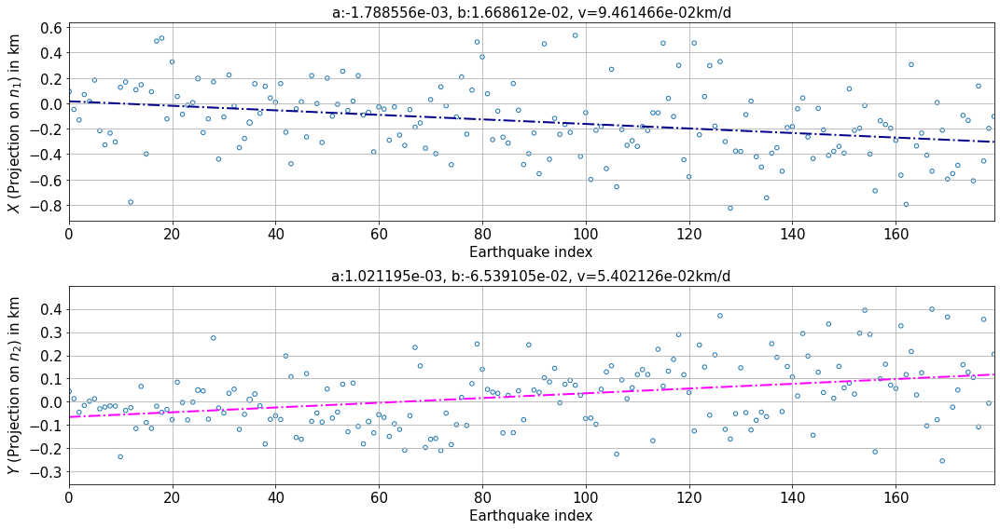

i = 1


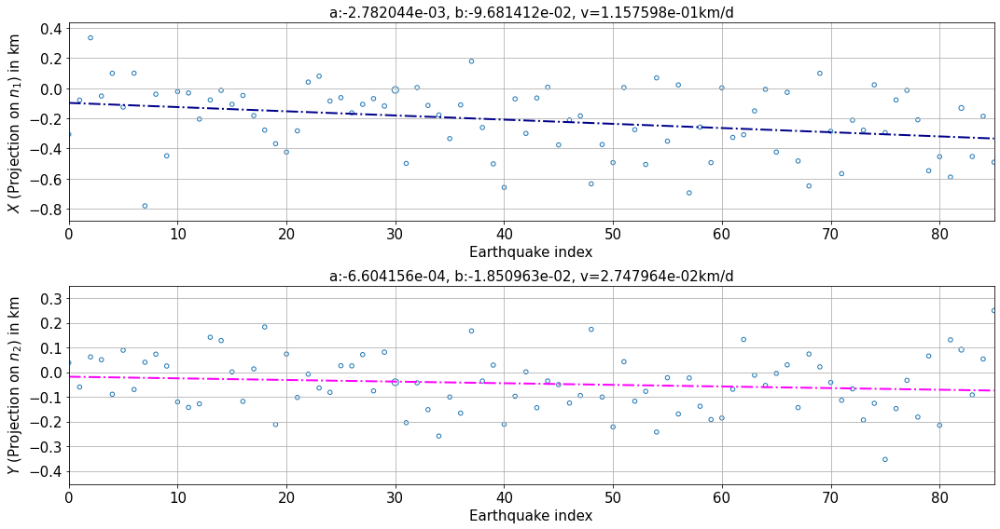

i = 2


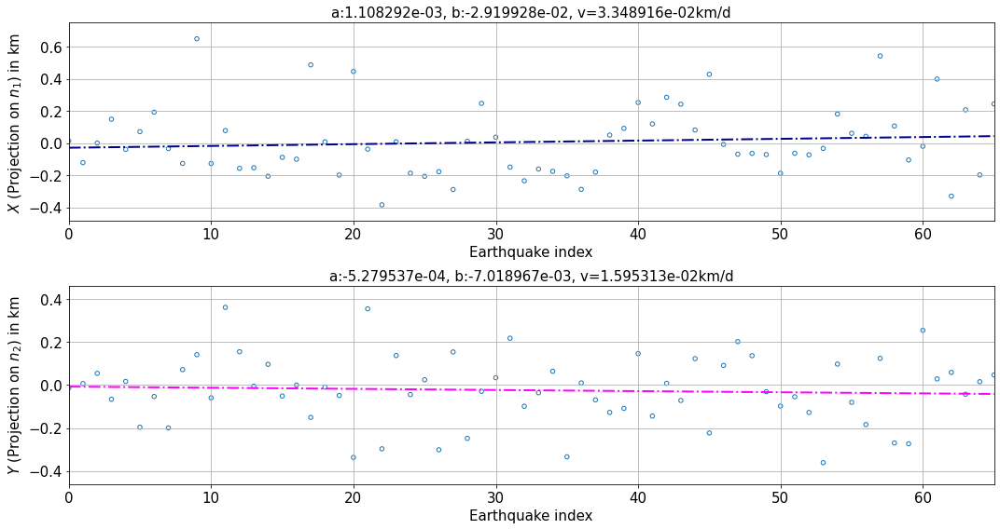

i = 3


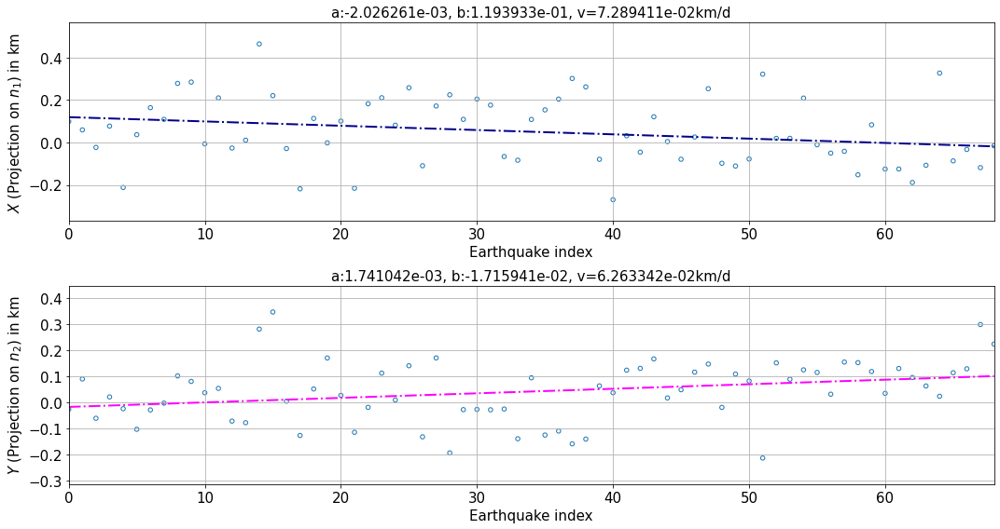

i = 4


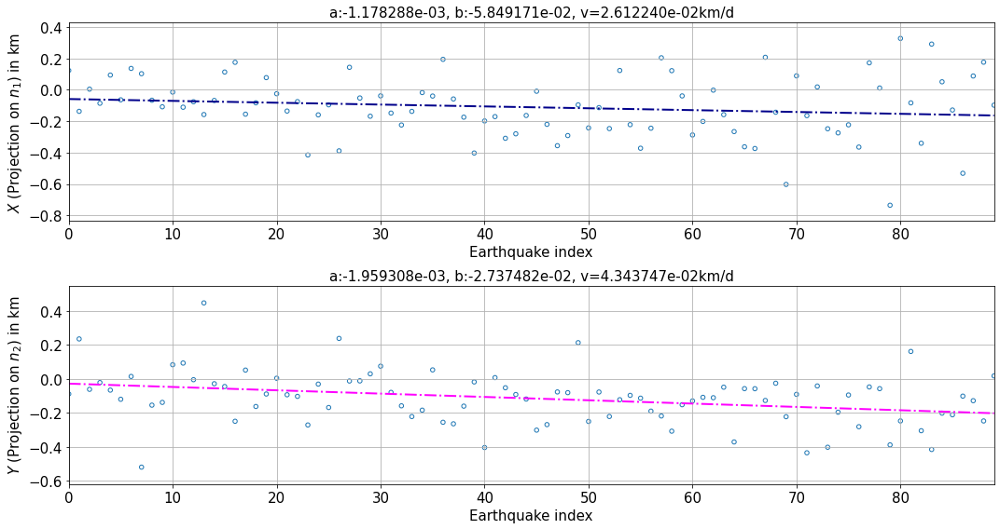

i = 5


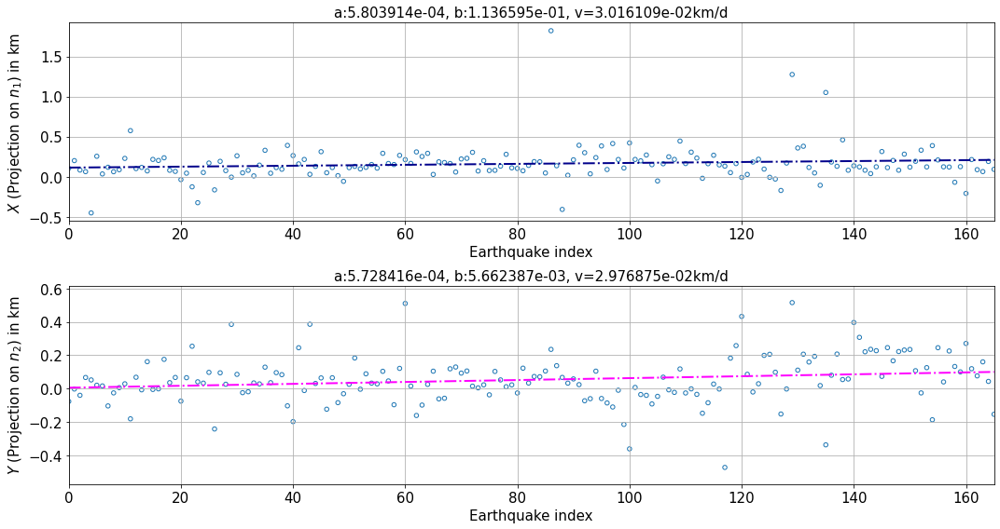

i = 6


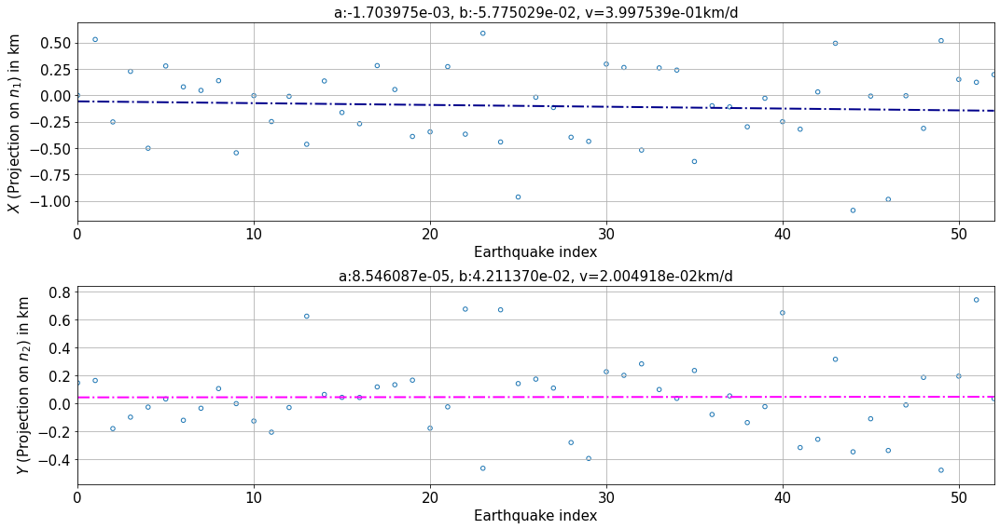

i = 7


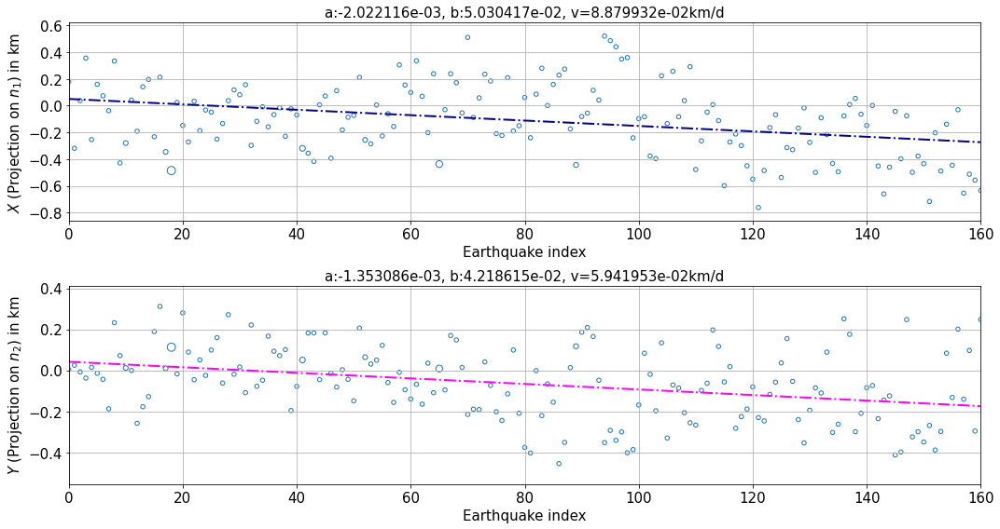

i = 8


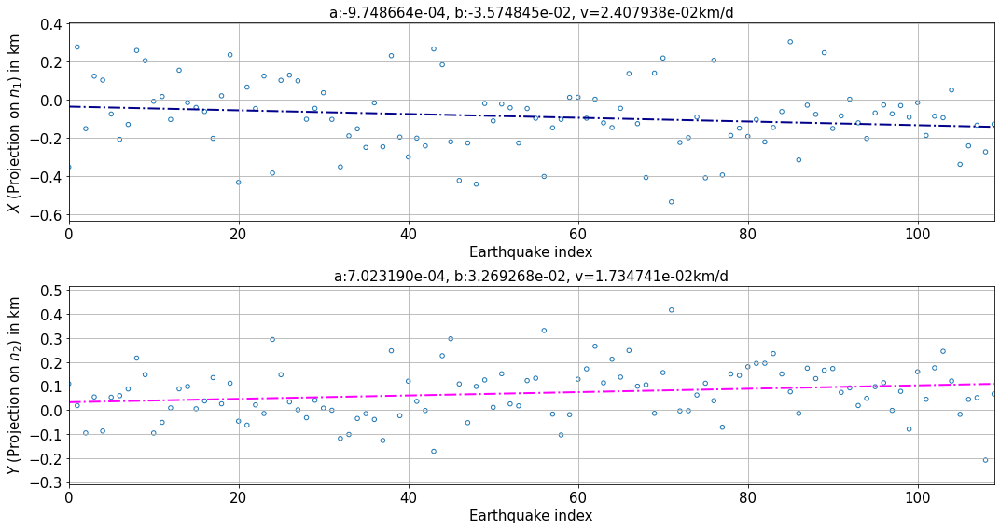

i = 9


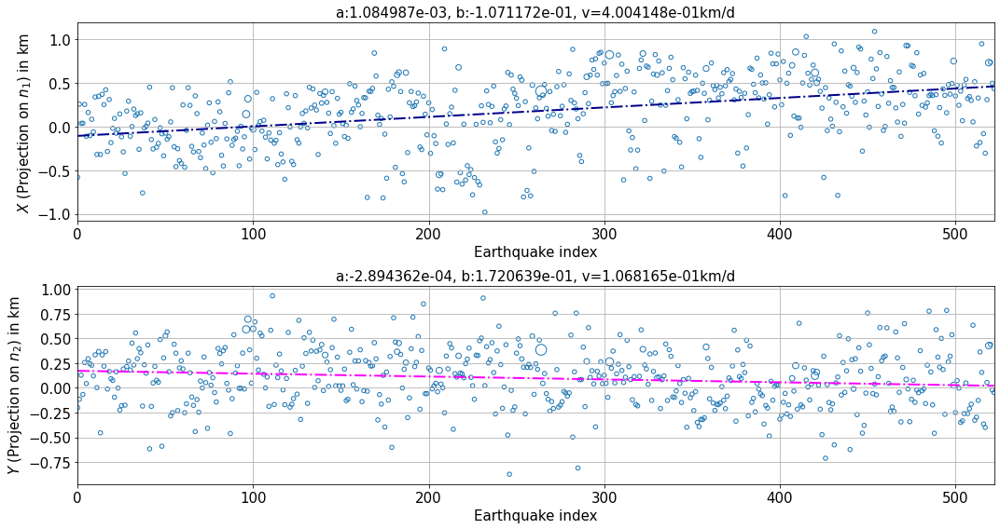

i = 10


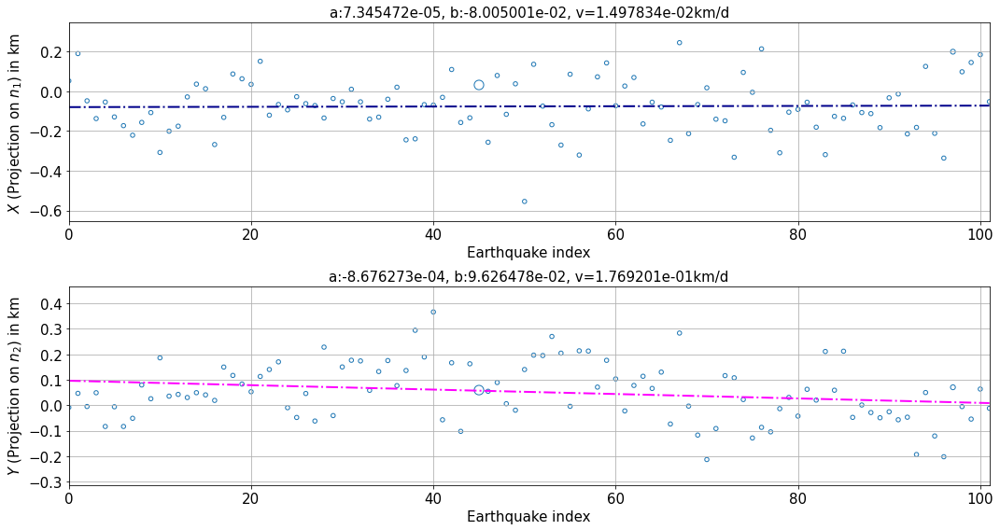

i = 11


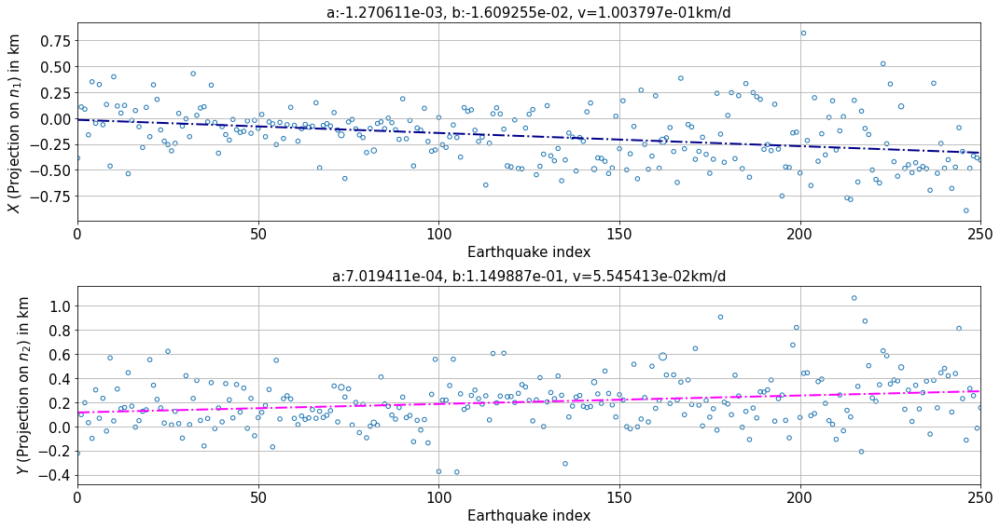

i = 12


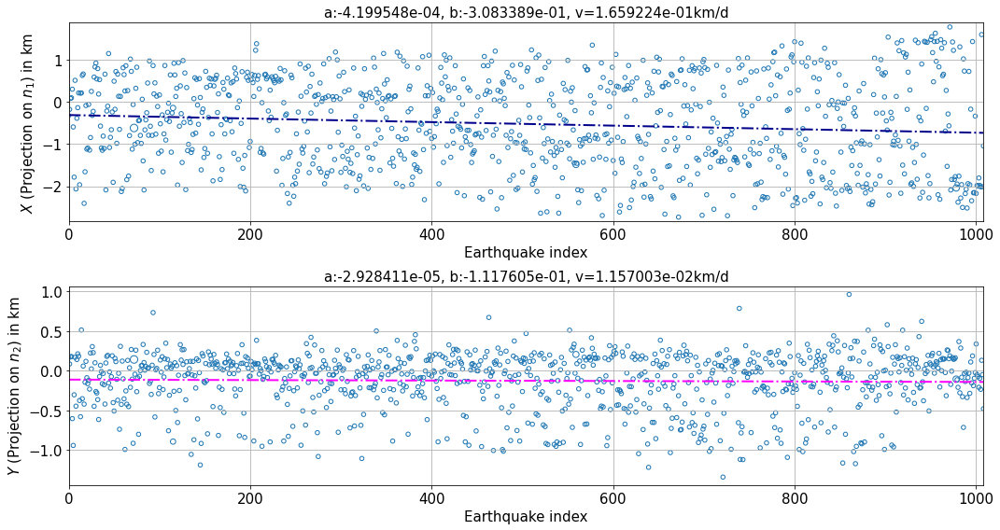

i = 13


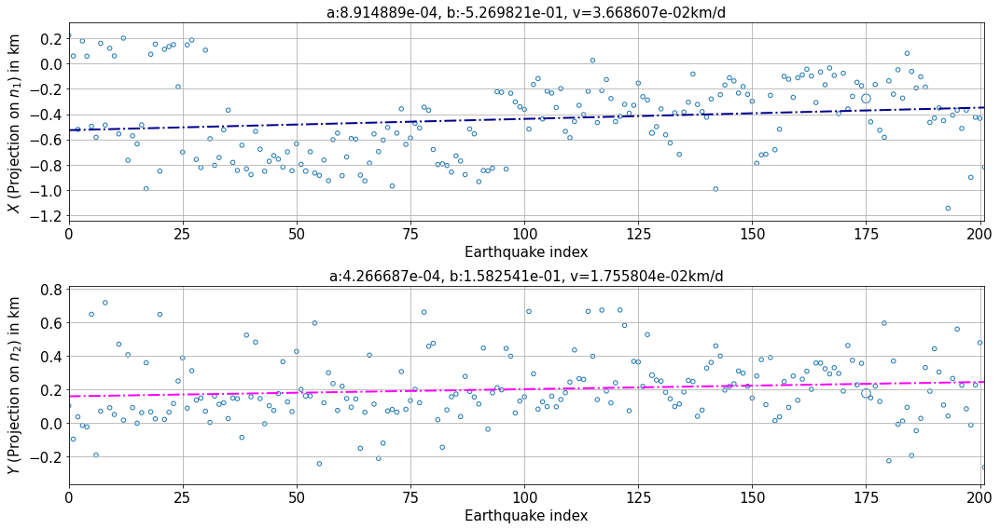

i = 14


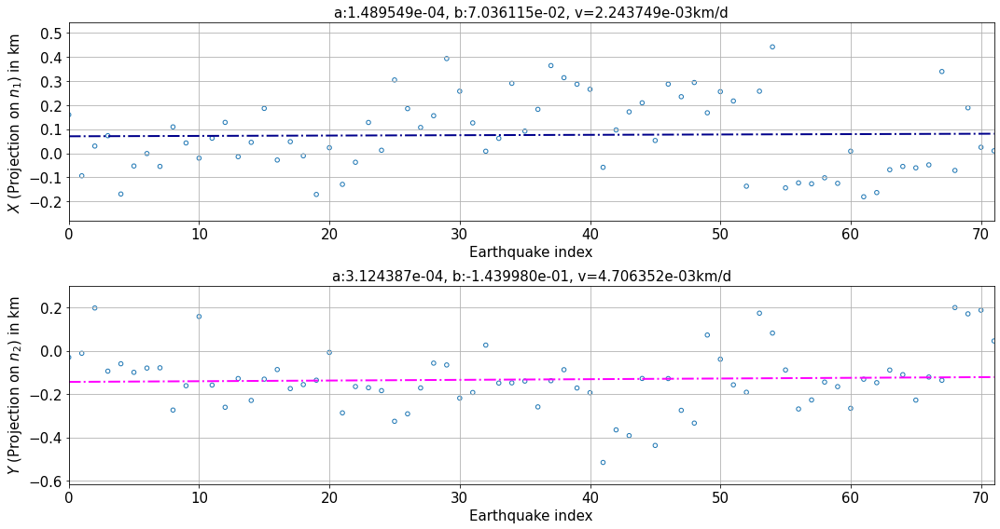

i = 15


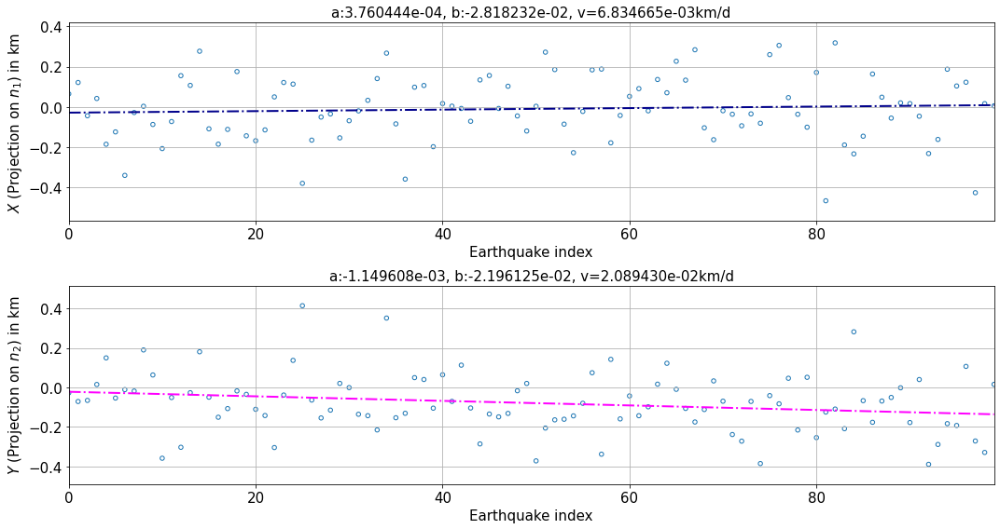

i = 16


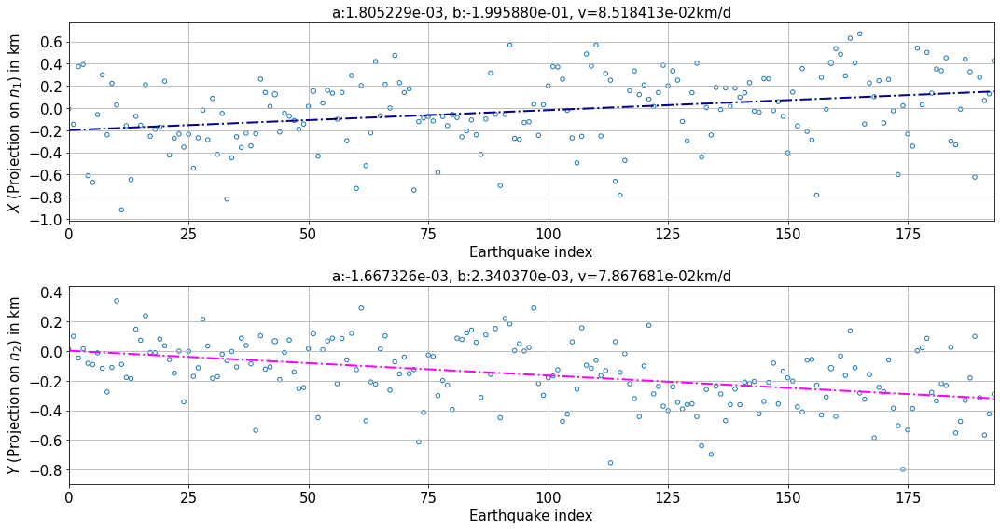

i = 17


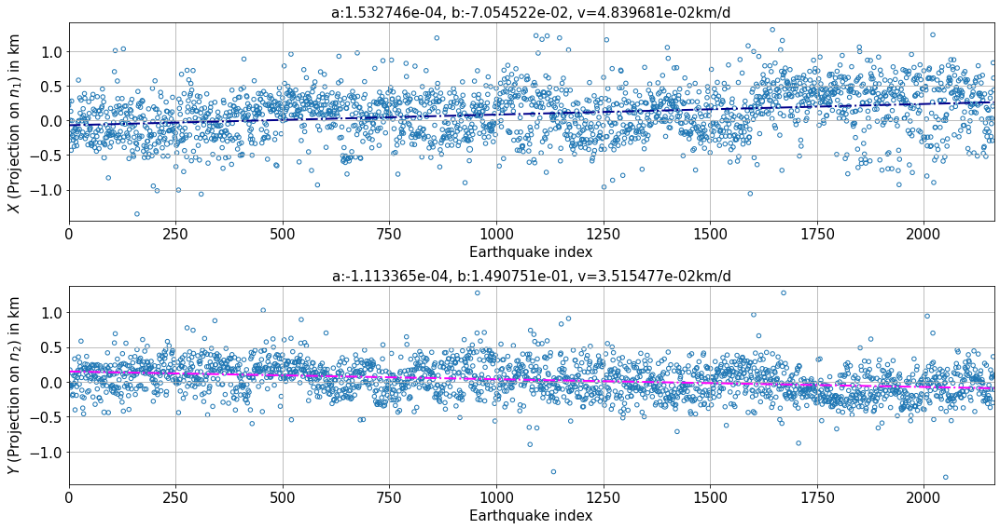

i = 18


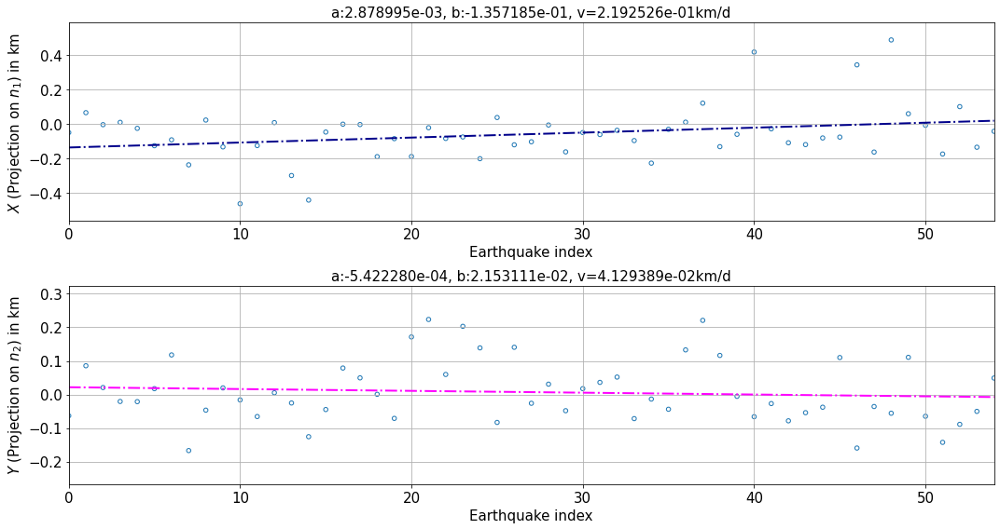

i = 19


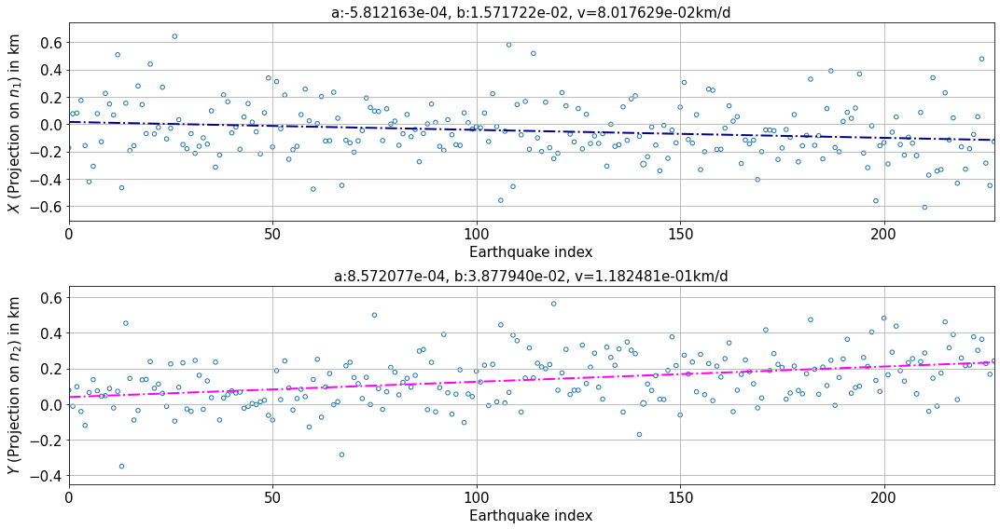

i = 20


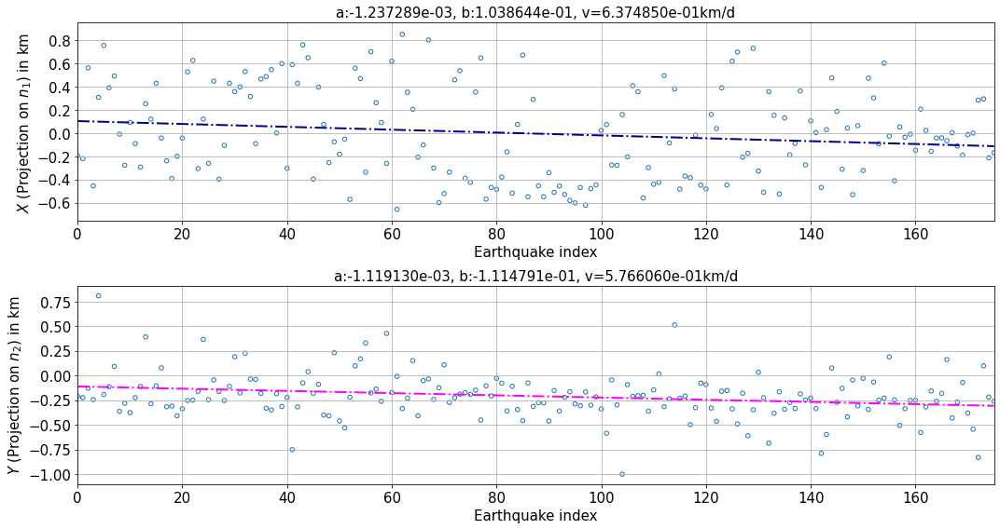

i = 21


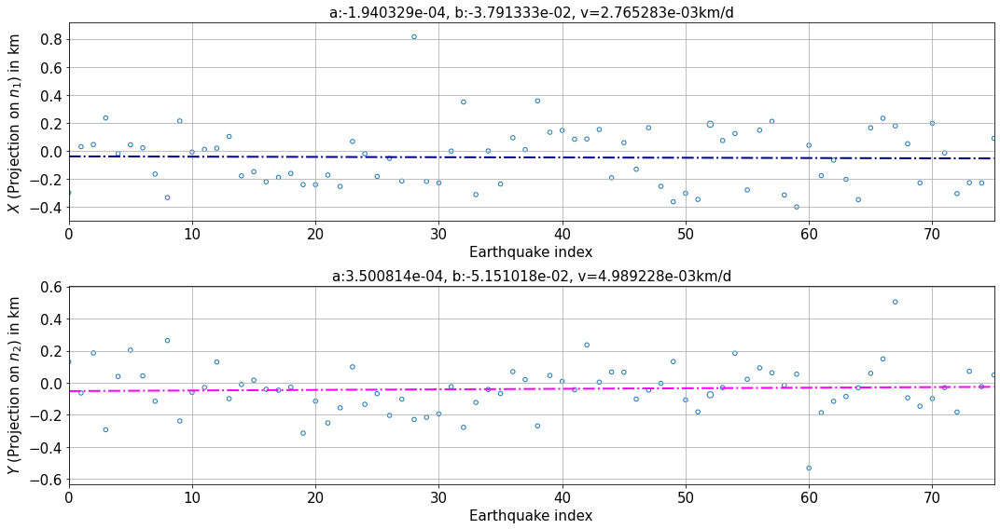

i = 22


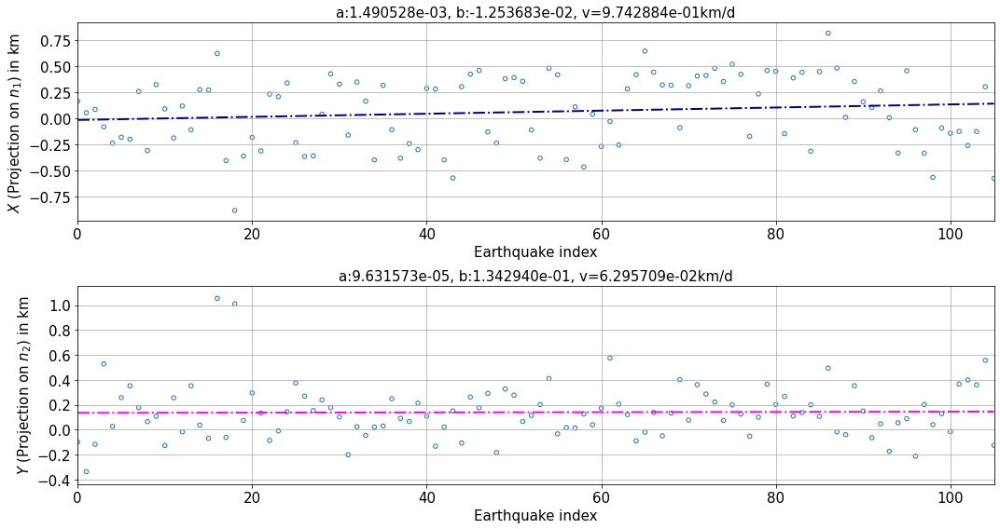

i = 23


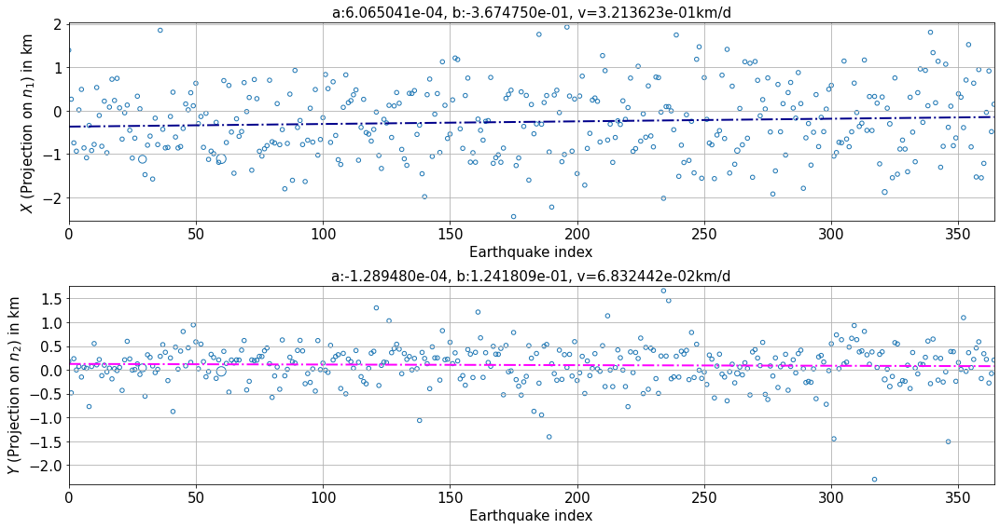

i = 24


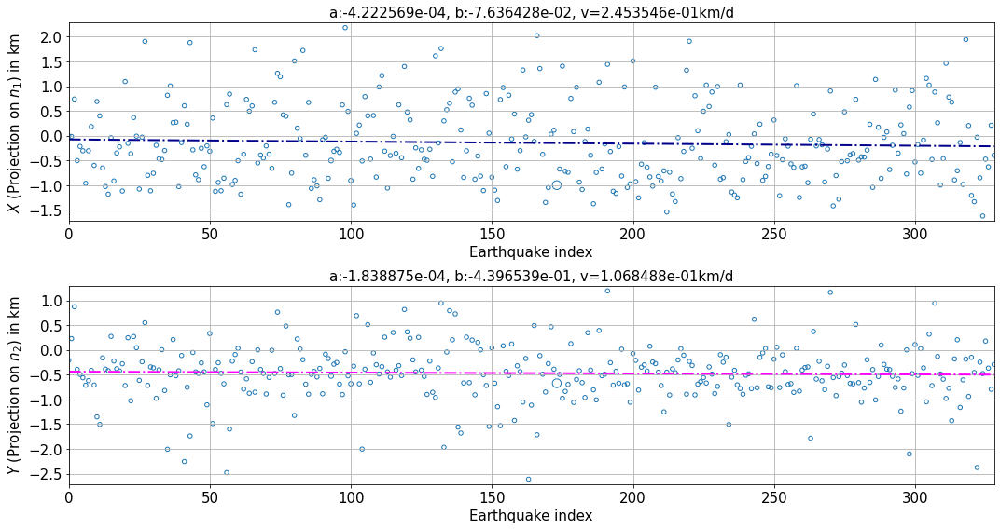

i = 25


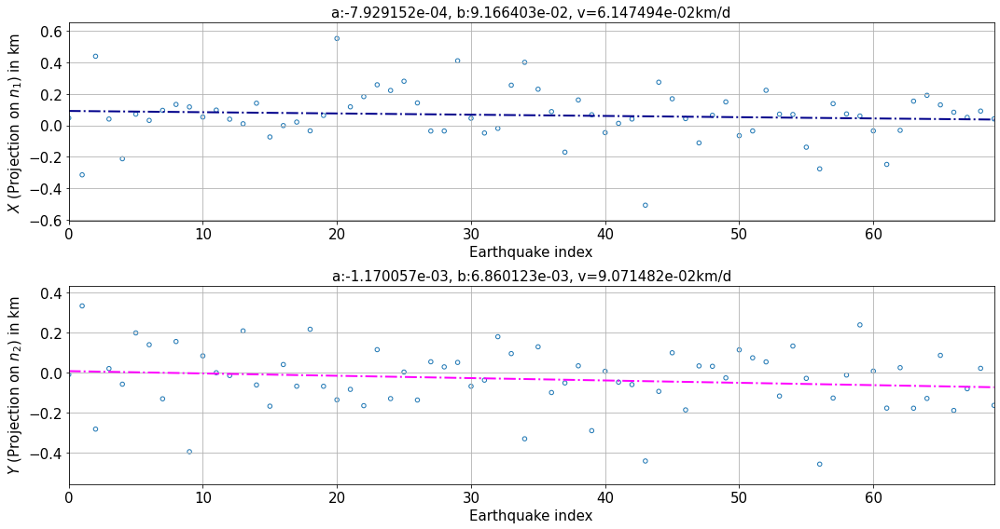

i = 26


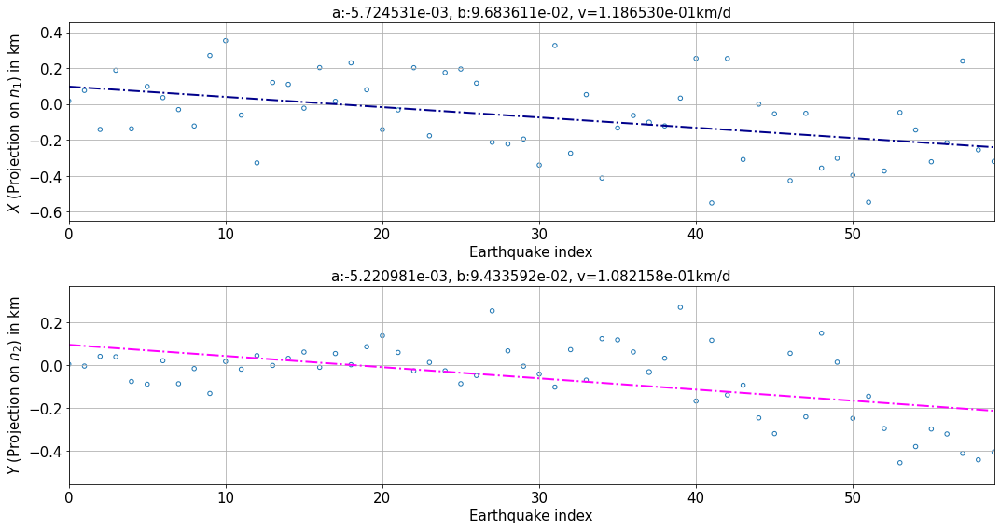

i = 27


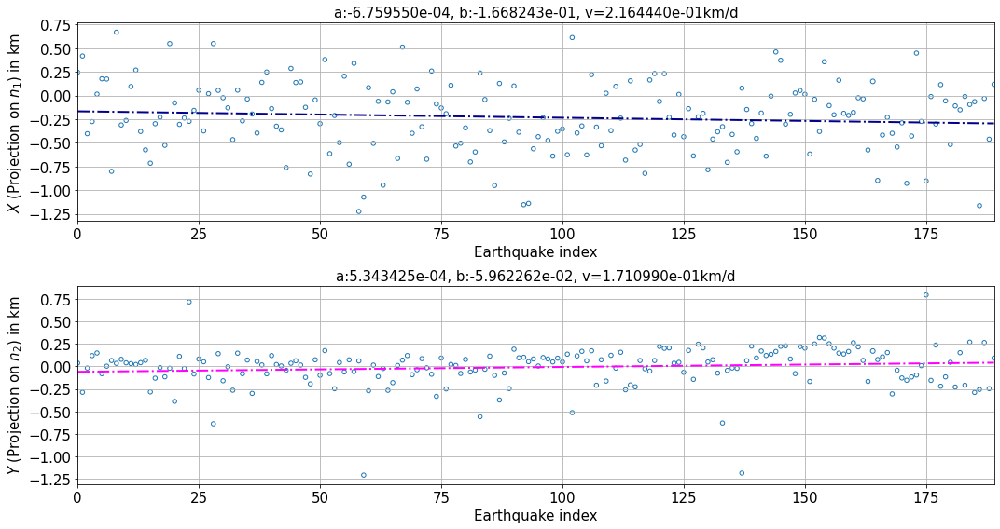

i = 28


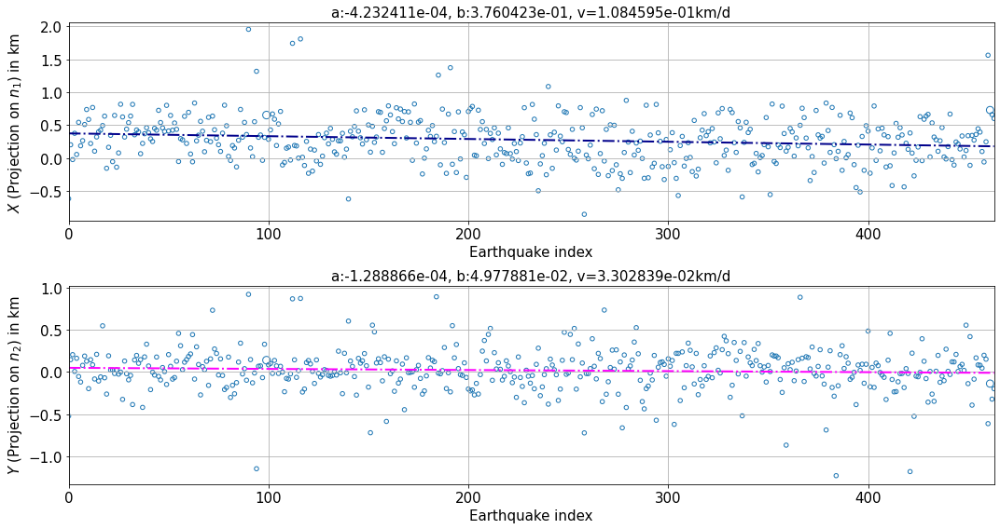

i = 29


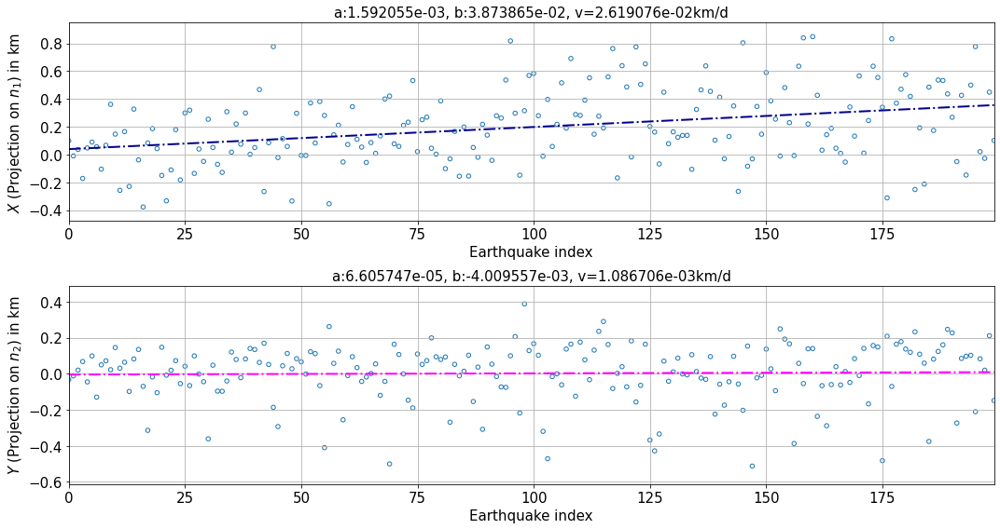

i = 30


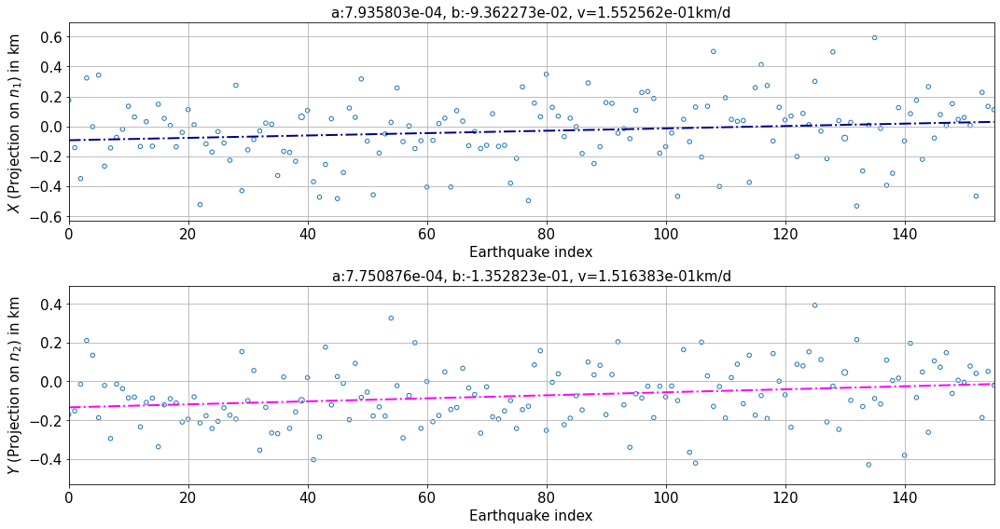

i = 31


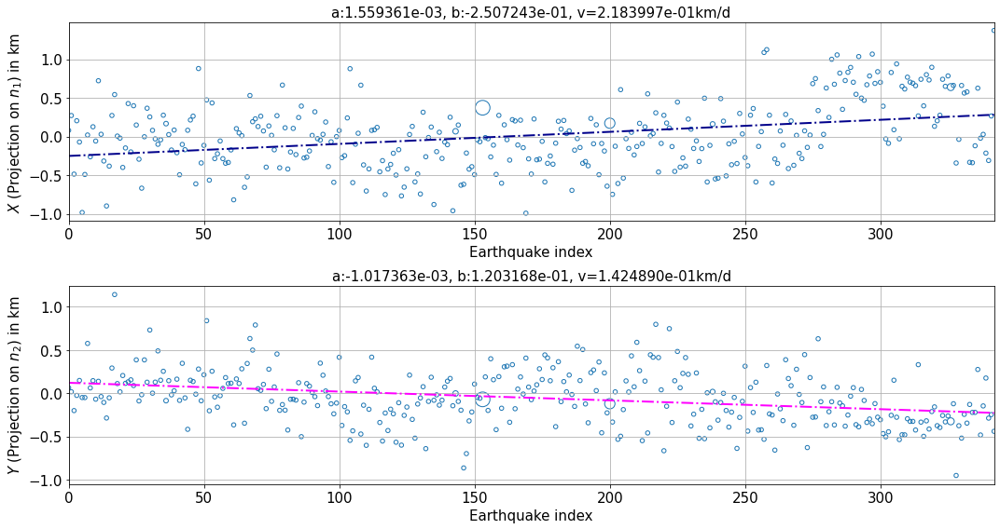

i = 32


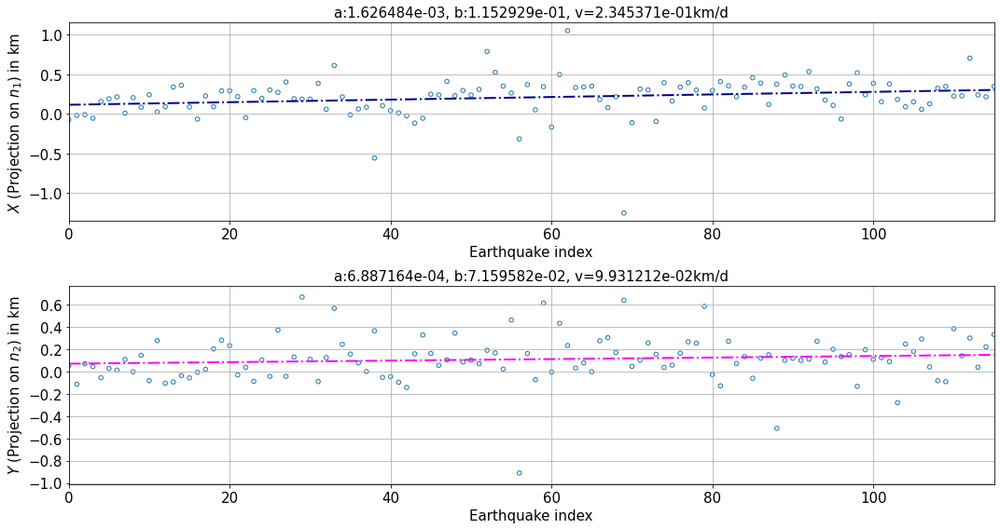

i = 33


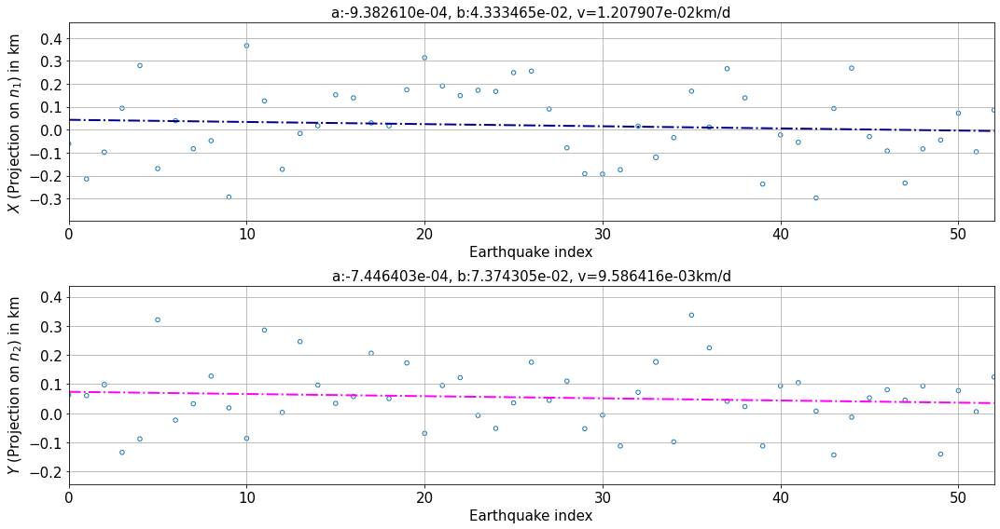

i = 34


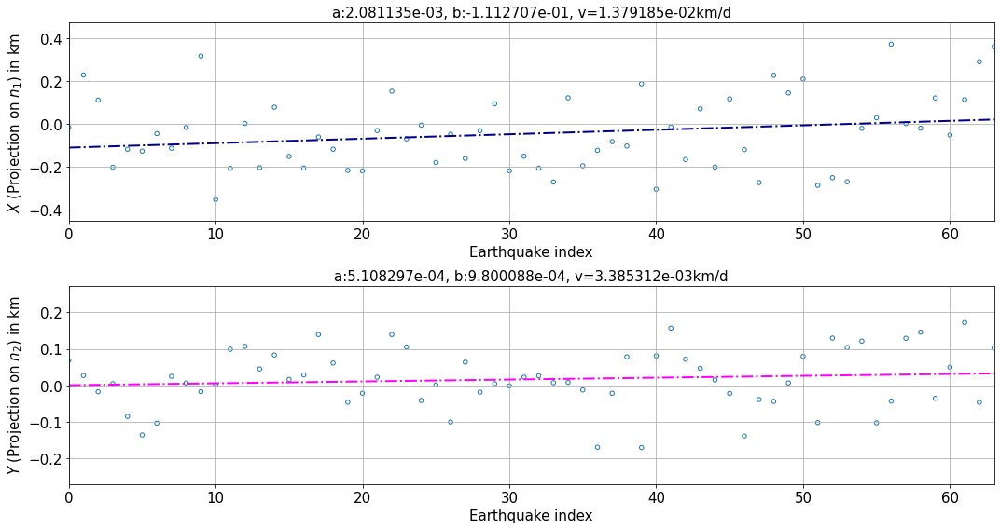

i = 35


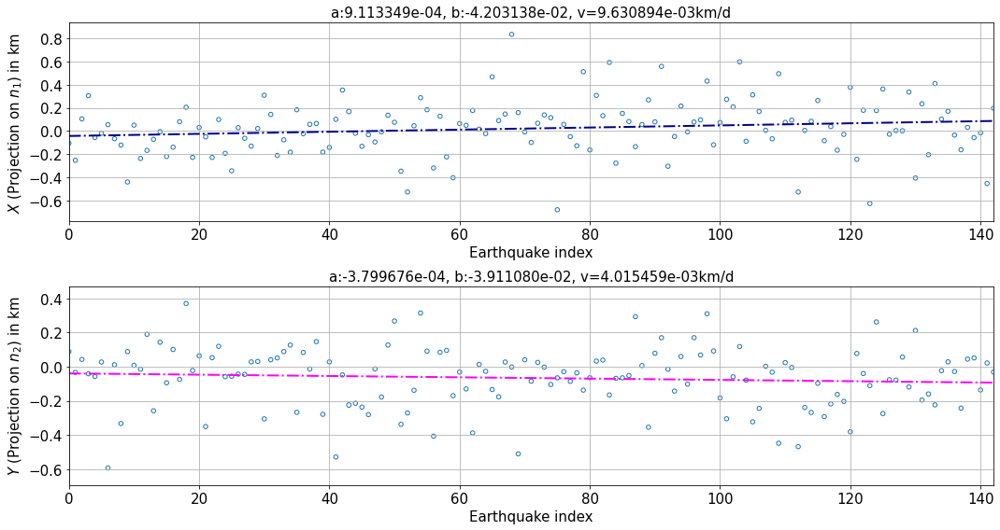

i = 36


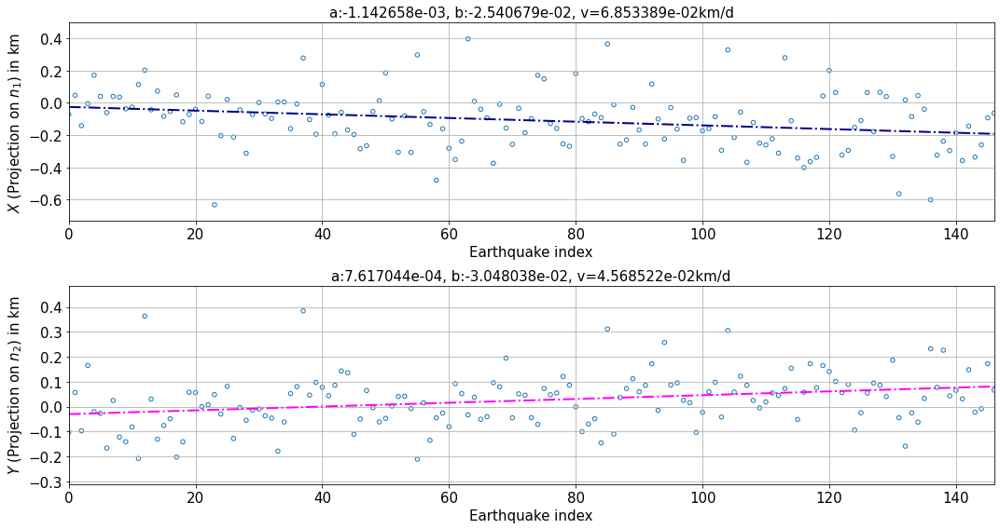

i = 37


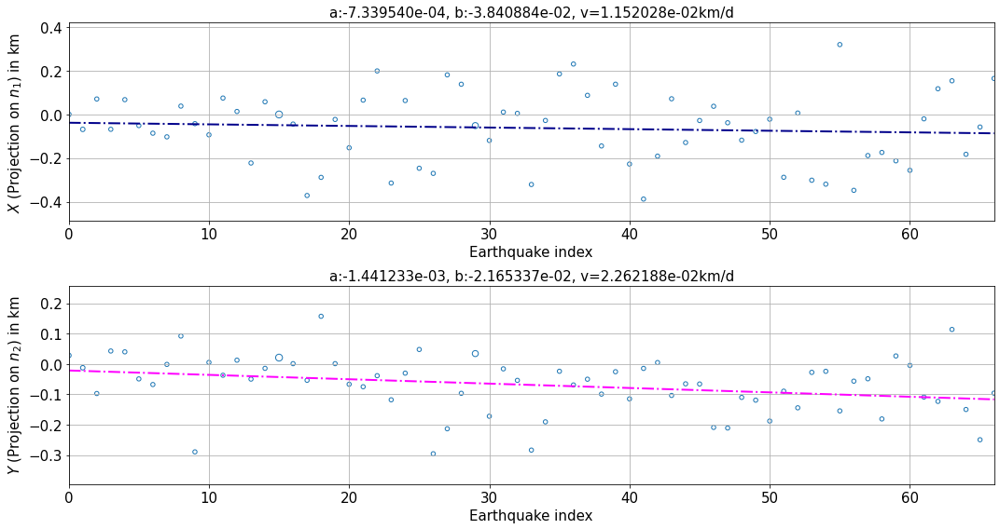

i = 38


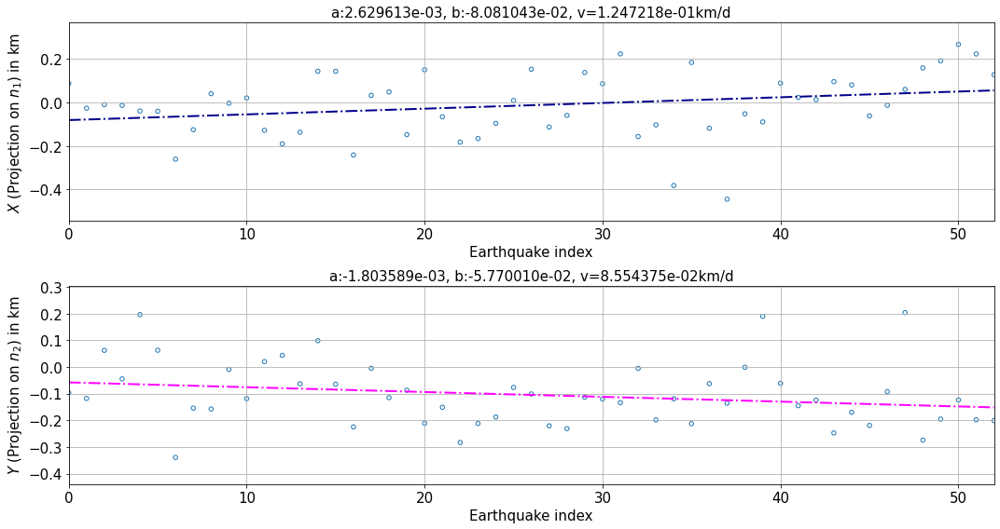

i = 39


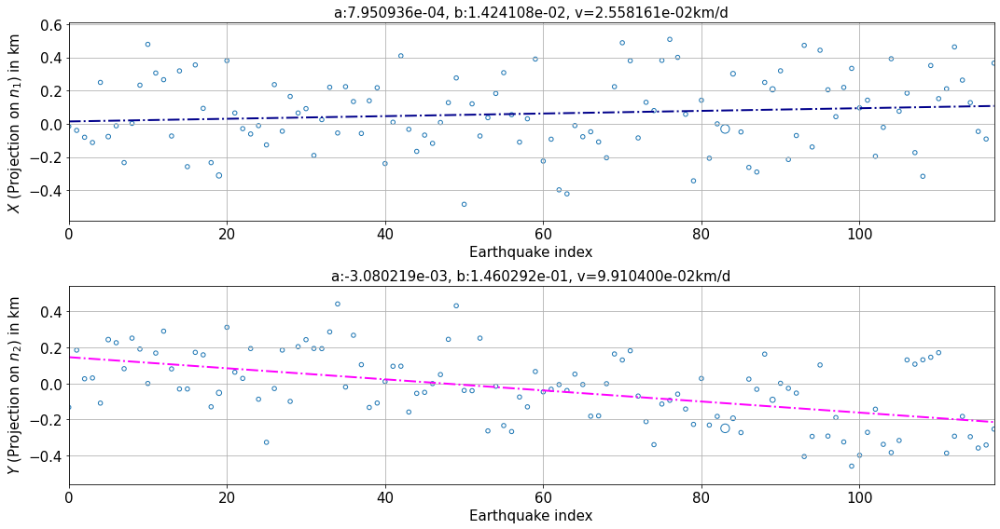

CPU times: user 2min 19s, sys: 12.8 s, total: 2min 32s
Wall time: 2min 16s


In [14]:
%%time 

####SUMMARY:

############################################################################################
###########################################STEP1############################################
############################################################################################
###Parameters:
nb_ite = 1000 #as we don't have/count the original state
proba_factor = 5 #%

all_IX = [] ##get all slope values on X for each swarm
all_IY = [] ##get all slope values on Y for each swarm
all_VX = [] ##get all velocity values on X for each swarm
all_VY = [] ##get all velocity values on Y for each swarm


###To get a 4 plots:
all_all_dataP = []
all_all_yX = []
all_all_yY = []
all_all_X = []
all_all_Y = []
all_all_I = []
all_all_msize = []  

all_all_aX = [] 
all_all_aY = []

all_aX0 = []
all_meanX = []
all_stdX = []
all_rvsX = []
all_pdfX = []

all_aY0 = []
all_meanY = []
all_stdY = []
all_rvsY = []
all_pdfY = []

for i in range(0, len(all_X1)):
    print("i =", i)
    
    all_aX = []
    all_aY = []
    

    ##A target swarm:
    X, Y, I, M, T = all_X1[i], all_Y1[i], all_I[i], all_m[i], all_T[i] 
    dff0_ = restructure_df(X, Y, I, M, T)

    X, Y, I, M, T = dff0_.X, dff0_.Y, dff0_.I, dff0_.M, dff0_["T"]
    R0 = use_linear_regression_model(X, Y, I, M, T, i, plot=True)
    ##structure:rhoX, rhoY, aX, aY, bX, bY, vX, vY, dataP, yX, yY, all_msize

    all_aX.append(R0[2]) #aX
    all_aY.append(R0[3]) #aY
    all_VX.append(R0[6]) #vX
    all_VY.append(R0[7]) #vY
    
    all_all_dataP.append(R0[8])
    all_all_yX.append(R0[9])
    all_all_yY.append(R0[10])
    all_all_X.append(R0[11])
    all_all_Y.append(R0[12])
    all_all_I.append(R0[13])
    all_all_msize.append(R0[14])

    for n in np.zeros(nb_ite)+1:
        ##Shuffle:
        dff0__ = dff0_.copy()
        dff0__['X'] = dff0_.sample(frac=n).values
        dff0__['Y'] = dff0_.sample(frac=n).values

        X, Y, I, M, T = dff0__.X, dff0__.Y, dff0__.I, dff0__.M, dff0__["T"]
        new_R0 = use_linear_regression_model(X, Y, I, M, T, i, plot=False)
        ##structure:rhoX,rhoY,aX,aY,bX,bY,vX,vY

        all_aX.append(new_R0[2]) #aX
        all_aY.append(new_R0[3]) #aY

############################################################################################
##########print(np.intersect1d(swarm_migrate, UP95+1))#################################STEP2############################################
############################################################################################
    get_data = stats_gaussian(all_aX, all_aY, i, plot=False)
    #structure:IX, IY, all_aX[0], meanX, stdX, rvsX, pdfX, all_aY[0], meanY, stdY, rvsY, pdfY
    
    all_all_aX.append(all_aX) #aX
    all_all_aY.append(all_aY) #aY
    
    all_aX0.append(get_data[2]) ##initial
    all_meanX.append(get_data[3])
    all_stdX.append(get_data[4])
    all_rvsX.append(get_data[5])
    all_pdfX.append(get_data[6])
    
    all_aY0.append(get_data[7]) ##initial
    all_meanY.append(get_data[8])
    all_stdY.append(get_data[9])
    all_rvsY.append(get_data[10])
    all_pdfY.append(get_data[11])

    all_IX.append(get_data[0])#IX
    all_IY.append(get_data[1])#IY

/home/xianglo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:53: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
/home/xianglo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


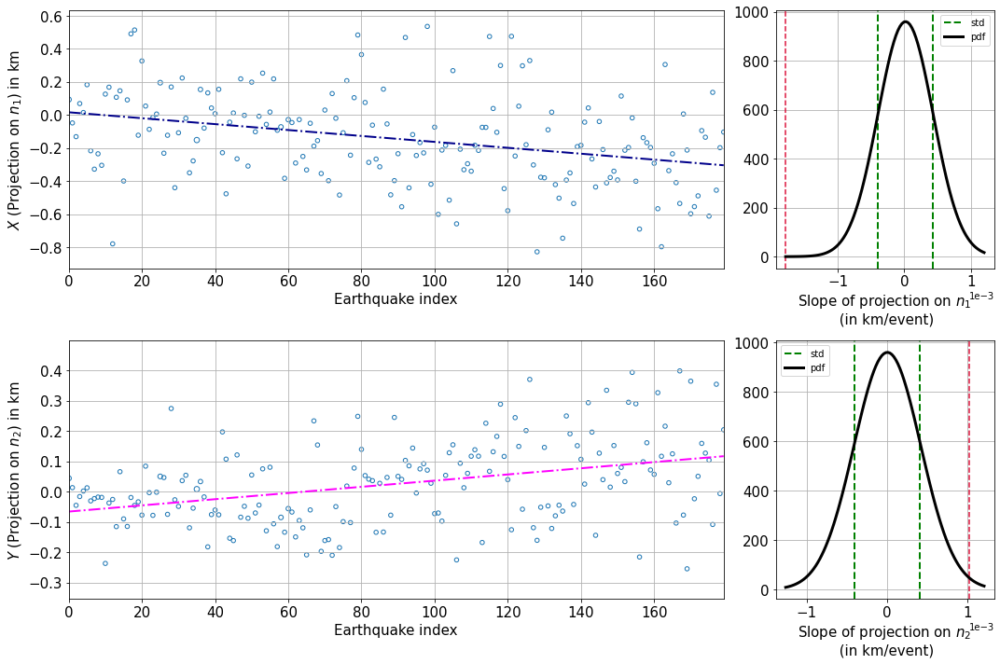

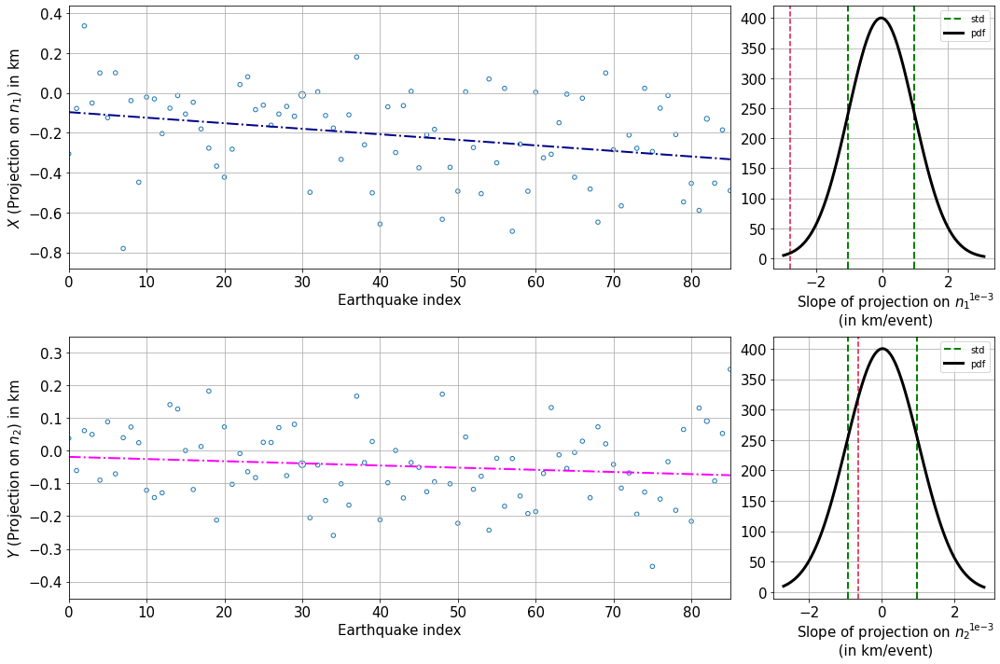

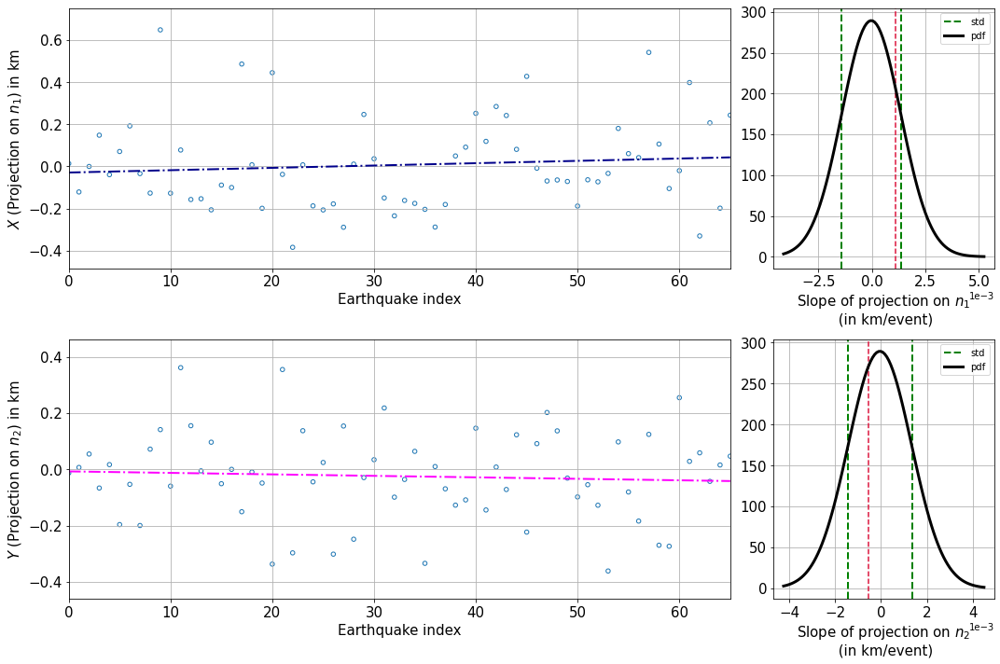

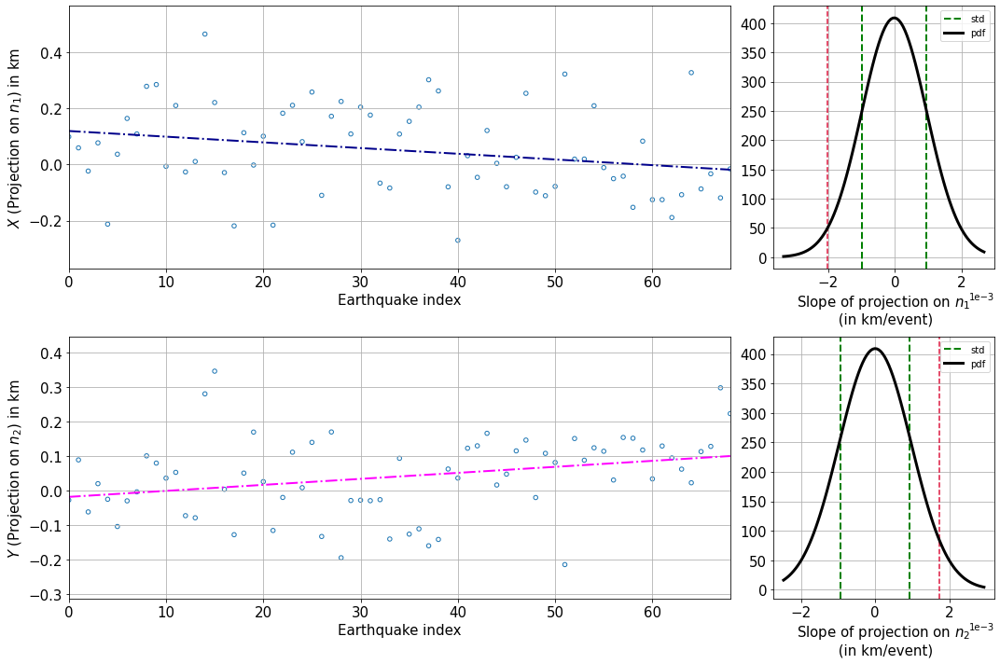

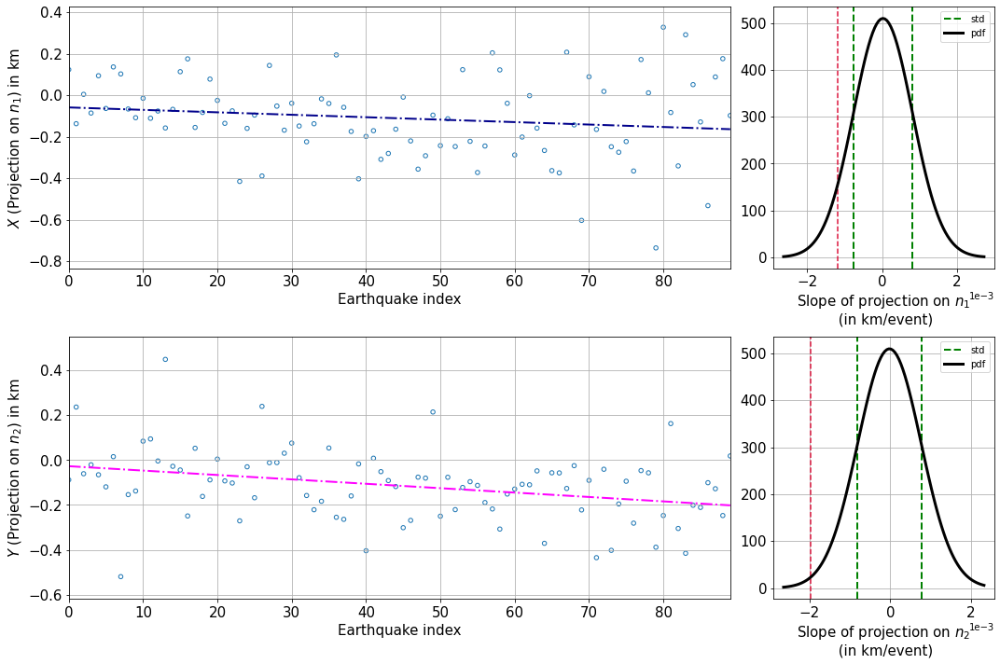

...

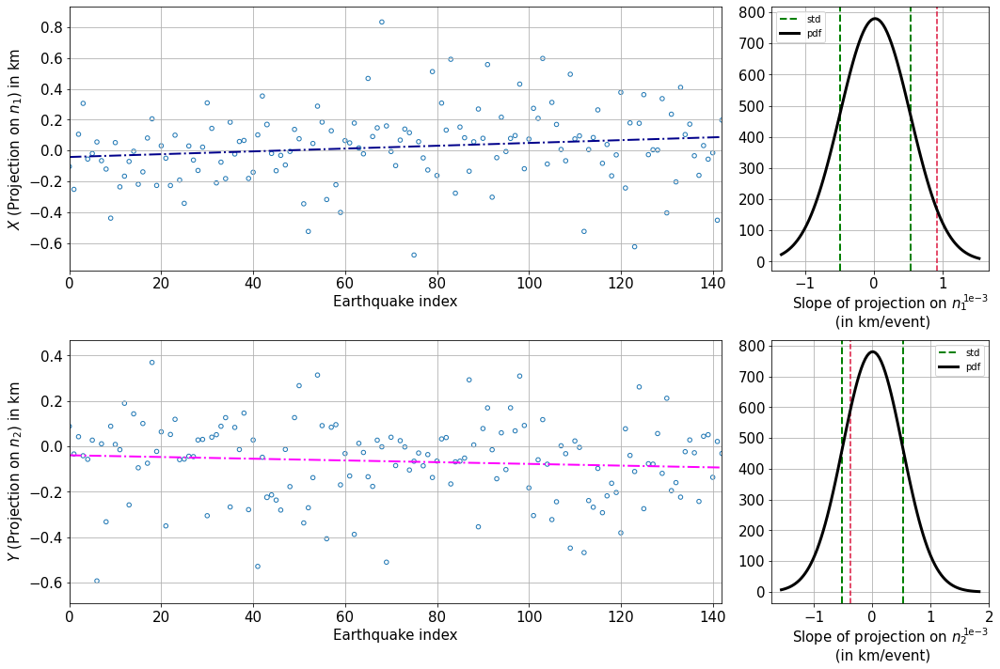

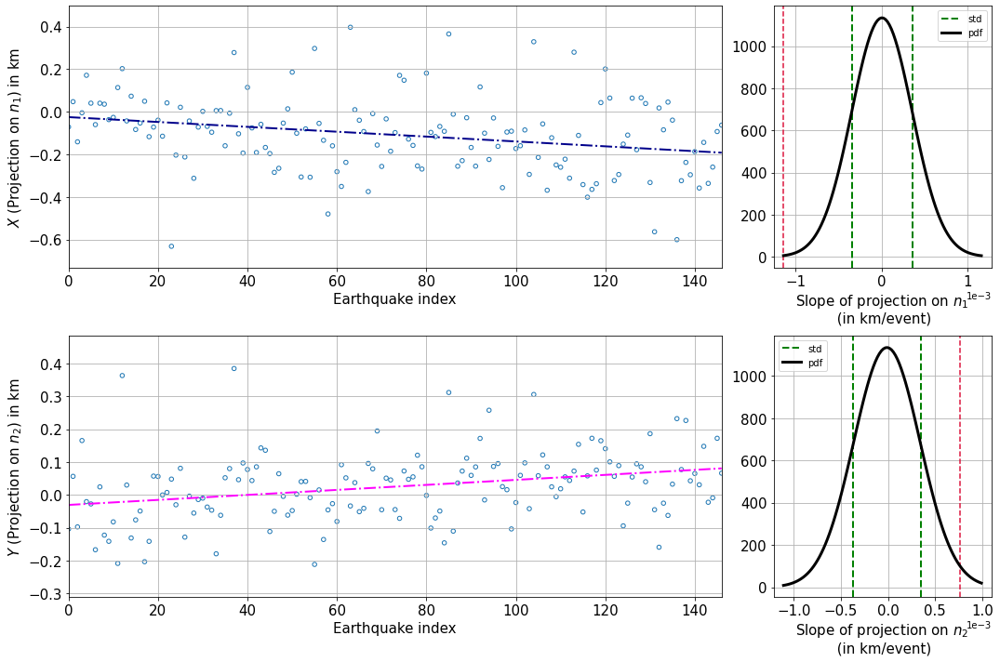

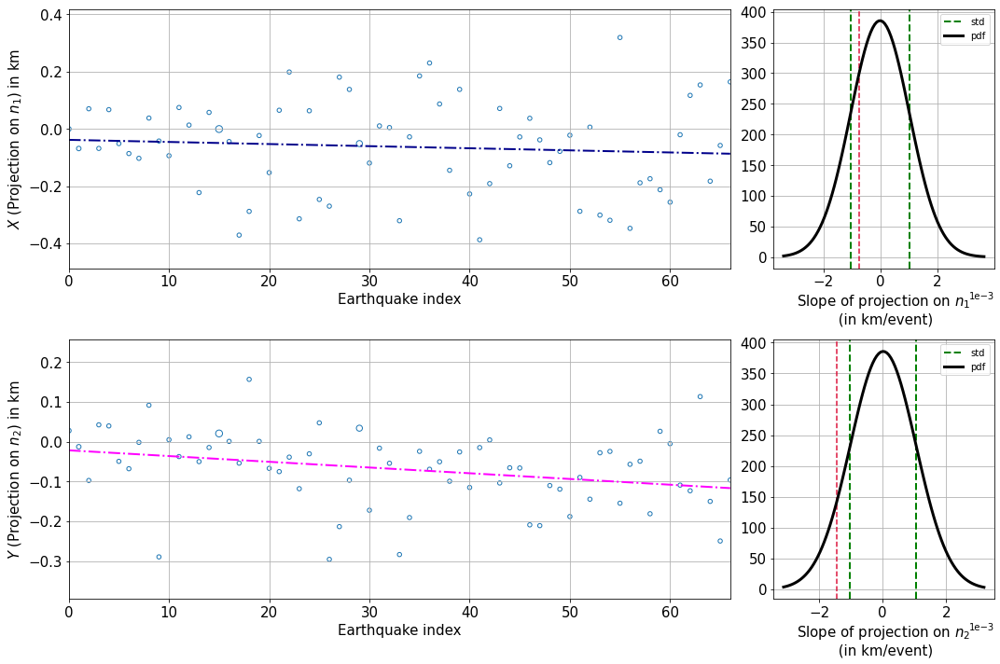

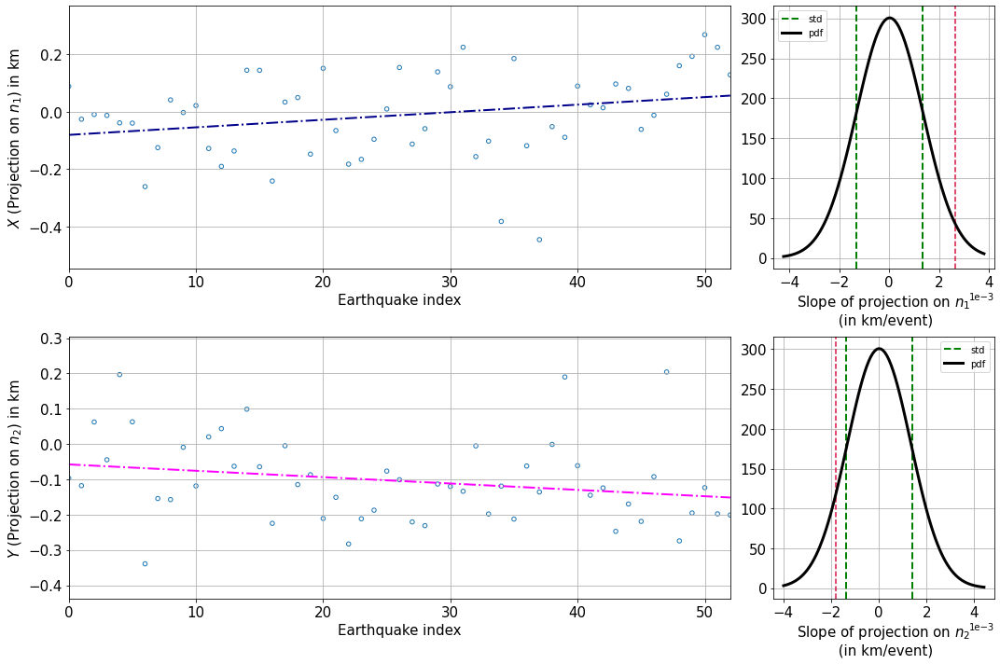

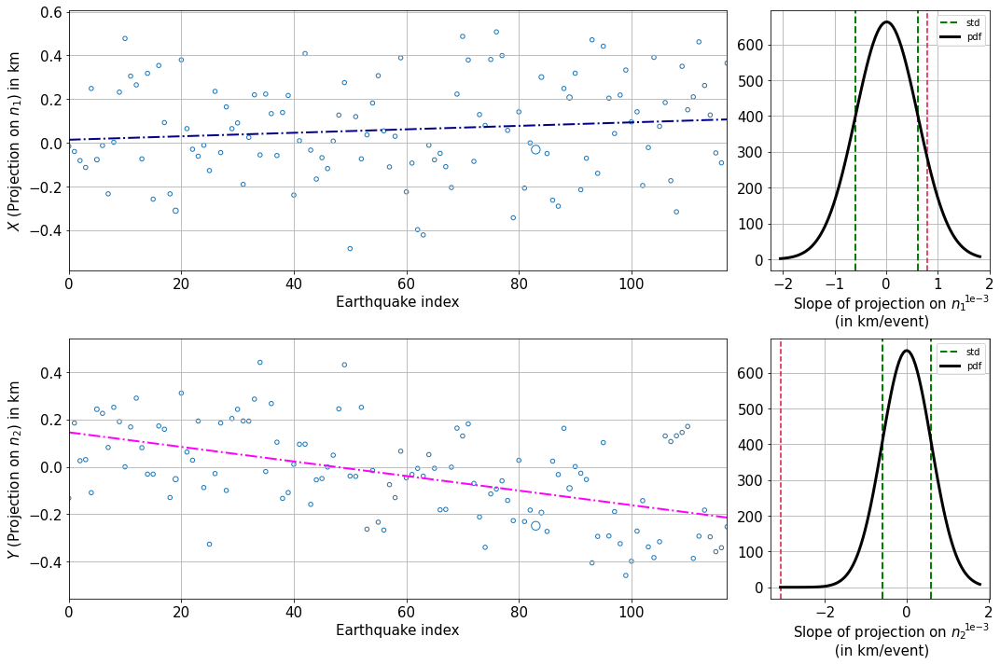

In [15]:
path = "/home/xianglo/Bureau/DATA_AMATRICE/DBSCAN_David/new_all_run_files_for_etas_23052024_2/new_all_run_files_for_etas/v0_d03_n50_every1_clusters/fig_migration/"

if not os.path.exists(path):
    os.mkdir(path)

for i in range(0, len(all_X1)):

    #####Plot:
    f, [[a0, a1], [a2, a3]] = plt.subplots(2, 2, gridspec_kw={'width_ratios': [3, 1]}, figsize=(15,10))
    a0.scatter(all_all_I[i], all_all_X[i], s=all_all_msize[i], facecolors='none', edgecolors='tab:blue', linewidths=1)
    a0.plot(all_all_dataP[i], all_all_yX[i], '-.', c='darkblue', linewidth=2, label='linear regression')
    a0.set_xlabel("Earthquake index", fontsize=15)
    a0.set_ylabel("$X$ (Projection on $n_1$) in km", fontsize=15)
    a0.set_xlim((np.min(all_all_I[i]), np.max(all_all_I[i])))
    a0.set_ylim((np.min(all_all_X[i])-0.1, np.max(all_all_X[i])+0.1))
    a0.tick_params(axis='both',labelsize=15)
    a0.grid()

    a2.scatter(all_all_I[i], all_all_Y[i], s=all_all_msize[i], facecolors='none', edgecolors='tab:blue', linewidths=1)
    a2.plot(all_all_dataP[i], all_all_yY[i], '-.', c='magenta', linewidth=2, label='linear regression')
    a2.set_xlabel("Earthquake index", fontsize=15)
    a2.set_ylabel("$Y$ (Projection on $n_2$) in km", fontsize=15)
    a2.set_xlim((np.min(all_all_I[i]), np.max(all_all_I[i])))
    a2.set_ylim((np.min(all_all_Y[i])-0.1, np.max(all_all_Y[i])+0.1))
    a2.tick_params(axis='both',labelsize=15)
    a2.grid()

    a1.axvline(all_aX0[i], ls="--", c="crimson")
    a1.axvline(all_meanX[i]-all_stdX[i], ls="--", c="g", label="std", lw="2")
    a1.axvline(all_meanX[i]+all_stdX[i], ls="--", c="g", lw="2")
    a1.plot(all_rvsX[i], all_pdfX[i], c="k", label="pdf", lw="3")
    a1.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
    a1.tick_params(axis='both',labelsize=15)
    a1.set_xlabel("Slope of projection on $n_1$ \n (in km/event)", fontsize=15)
    a1.legend()
    a1.grid()

    a3.axvline(all_aY0[i], ls="--", c="crimson")
    a3.axvline(all_meanY[i]-all_stdY[i], ls="--", c="g", label="std", lw="2")
    a3.axvline(all_meanY[i]+all_stdY[i], ls="--", c="g", lw="2")
    a3.plot(all_rvsY[i], all_pdfY[i], c="k", label="pdf", lw="3")
    a3.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
    a3.tick_params(axis='both',labelsize=15)
    a3.set_xlabel("Slope of projection on $n_2$ \n (in km/event)", fontsize=15)
    a3.legend()
    a3.grid()
    
    #print("i", i)
    #print("mean:", "{:.4e}".format(all_meanX[i]), "& std:", "{:.4e}".format(all_stdX[i]))

    f.tight_layout()
    f.savefig("v0_d03_n50_every1_clusters/fig_migration/4fig_swarm"+str(i)+".png")
    f.show()

In [16]:
#Saving velocity values:
df_velocity = pd.DataFrame({"vX":all_VX, "vY":all_VY})
df_velocity["v"] = np.sqrt(df_velocity.vX.values**2 + df_velocity.vY.values**2)
df_velocity.to_csv("v0_d03_n50_every1_clusters/df_swarms_velocity.csv", index=False)


df_velocity = pd.read_csv("v0_d03_n50_every1_clusters/df_swarms_velocity.csv")

df_velocity

,vX,vY,v
0,0.094615,0.054021,0.108951
1,0.115760,0.027480,0.118977
2,0.033489,0.015953,0.037095
3,0.072894,0.062633,0.096107
4,0.026122,0.043437,0.050687
5,0.030161,0.029769,0.042378
6,0.399754,0.020049,0.400256
7,0.088799,0.059420,0.106846
8,0.024079,0.017347,0.029677
9,0.400415,0.106817,0.414417


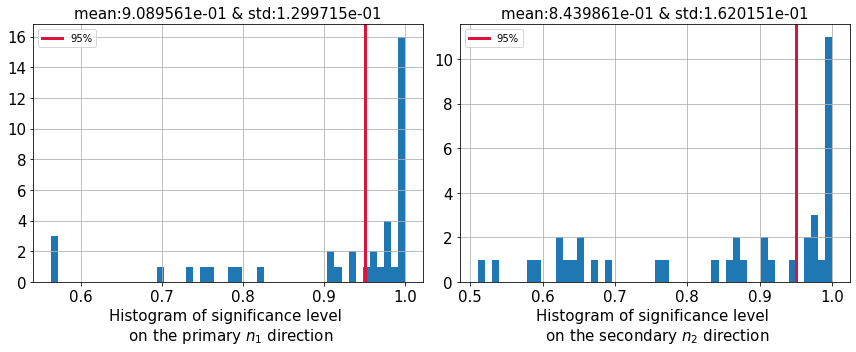

In [17]:
#PDF of Normal Distribution (get gaussian curve):
minX, maxX, meanX, stdX = np.min(all_IX), np.max(all_IX), np.mean(all_IX), np.std(all_IX)
rvsX = np.linspace(minX, maxX, 100)
pdfX = norm.pdf(rvsX, meanX, stdX)

minY, maxY, meanY, stdY = np.min(all_IY), np.max(all_IY), np.mean(all_IY), np.std(all_IY)
rvsY = np.linspace(minY, maxY, 100)
pdfY = norm.pdf(rvsY, meanY, stdX)

##Plots:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.hist(all_IX, bins=50, density=False)
#plt.plot(rvsX, pdfX, c="k", label="pdf", lw="3")
plt.axvline(0.95, ls='-', label='95%', c="crimson", lw="3")
plt.title("mean:" + str("{:e}".format(meanX)) + " & std:" + str("{:e}".format(stdX)), fontsize=15)
plt.xticks(fontsize=15,)
plt.yticks(fontsize=15,)
plt.xlabel("Histogram of significance level \n on the primary $n_1$ direction", fontsize=15)
plt.legend()
plt.grid()

plt.subplot(1,2,2)
plt.hist(all_IY, bins=50, density=False)
#plt.plot(rvsY, pdfY, c="k", label="pdf", lw="3")
plt.axvline(0.95, ls='-', label='95%', c="crimson", lw="3")
plt.title("mean:" + str("{:e}".format(meanY)) + " & std:" + str("{:e}".format(stdY)), fontsize=15)
plt.xticks(fontsize=15,)
plt.yticks(fontsize=15,)
plt.xlabel("Histogram of significance level \n on the secondary $n_2$ direction", fontsize=15)
plt.legend()
plt.grid()

plt.tight_layout()
plt.savefig("v0_d03_n50_every1_clusters/fig_migration/select_migration.png")
plt.show()

In [18]:
###Saving all_IX and all_IY for later:
dataI_ = {"IX": np.array(all_IX), "IY": np.array(all_IY)}
dfI_ = pd.DataFrame(dataI_)

dfI_.to_csv("/home/xianglo/Bureau/DATA_AMATRICE/DBSCAN_David/new_all_run_files_for_etas_23052024_2/new_all_run_files_for_etas/v0_d03_n50_every1_clusters/df_integral.csv", index=False)

dfI_.head()

,IX,IY
0,0.999992,0.994197
1,0.997384,0.758680
2,0.789291,0.646592
3,0.981163,0.968004
4,0.933878,0.993515


In [19]:
###Find swarms who has at least integral of X and/or Y >= 0.95:
X95 = np.argwhere(np.array(all_IX) >= 0.95).T[0]
Y95 = np.argwhere(np.array(all_IY) >= 0.95).T[0]

##Rename:
X95 = X95+1
Y95 = Y95+1

#
print("X95:", X95, "total:", len(X95), "\n Y95:", Y95, "total:", len(Y95), "\n")
#print(len(X95), len(Y95))

UP95 = np.unique(np.concatenate((X95,Y95), axis=0))
print("UP95 =", UP95, "total:", len(UP95), "\n")

X95: [ 1  2  4  6  8  9 10 12 13 14 17 18 19 20 21 27 29 30 31 32 33 35 36 37
 39] total: 25 
 Y95: [ 1  4  5  8 10 11 12 16 17 18 20 21 27 31 32 37 40] total: 17 

UP95 = [ 1  2  4  5  6  8  9 10 11 12 13 14 16 17 18 19 20 21 27 29 30 31 32 33
 35 36 37 39 40] total: 29 



In [20]:
inter = np.intersect1d(X95, Y95)
inter = np.argwhere(np.in1d(UP95, np.intersect1d(UP95,inter)) == False).flatten().tolist()
print(inter, "total:", len(inter)) ##no +1 for beginning name swarm at 0 instead of 1
##take only max of X95,Y95 if both, else take vX OR vY only !!!!

[1, 3, 4, 6, 8, 10, 11, 12, 15, 19, 20, 23, 24, 25, 27, 28] total: 16


In [21]:
##Save data:
with open('v0_d03_n50_every1_clusters/X95_Y95_inter.npy', 'wb') as f:
    np.save(f, X95)
    np.save(f, Y95)
    np.save(f, inter)

In [22]:
##Compare with integral:

print(UP95, len(UP95))

###Some %tage:
dfM = 0

for j in UP95:
    if j == UP95[0]:
        M = quick_features(j)
        ##structure:N,max_m,V2km^3,plana
        dfM = pd.DataFrame({"N":[M[0]], "max_m":[M[1]], "V2":[M[2]], "plana":[M[3]], "I":j, "duration":[M[4]]})
    else:
        new_M = quick_features(j)
        new_row = {"N":new_M[0], "max_m":new_M[1], "V2":new_M[2], "plana":new_M[3], "I":j, "duration":new_M[4]}
        #dfM = dfM.append(new_row, ignore_index=True)
        dfM = pd.concat([dfM, pd.DataFrame([new_row])], ignore_index=True)
        
    dfM['I'] = dfM['I'].astype('int')
    
dfM.describe()

[ 1  2  4  5  6  8  9 10 11 12 13 14 16 17 18 19 20 21 27 29 30 31 32 33
 35 36 37 39 40] 29


,N,max_m,V2,plana,I,duration
count,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000
mean,266.586207,1.710793,0.072059,0.393910,19.827586,3.649755
std,412.360151,0.499439,0.168851,0.148169,12.221378,3.259746
min,53.000000,0.717300,0.006200,0.066900,1.000000,0.341600
25%,100.000000,1.366800,0.015600,0.350600,10.000000,1.652800
50%,156.000000,1.731200,0.032100,0.434400,18.000000,2.894800
75%,202.000000,2.099400,0.053800,0.448900,31.000000,4.111300
max,2165.000000,2.757000,0.927400,0.623300,40.000000,13.531500


In [23]:
###Add velocity data:
dfM["v"] = dfM["N"].values * np.nan

for i in X95: ##mets tous les X95
    ind = np.argwhere(i == UP95)[0][0]
    dfM["v"].iloc[ind] = df_velocity.iloc[ind-1].vX
    
for i in Y95: ##mets tous les Y95, écrase les X95 si déjà une valeur
    ind = np.argwhere(i == UP95)[0][0]
    dfM["v"].iloc[ind] = df_velocity.iloc[ind-1].vY

for i in inter: ##mets que les max entre X95 et Y95 donc écrase les valeurs précédentes
    dfM["v"].iloc[i] = np.max([df_velocity.iloc[i-1].vX, df_velocity.iloc[i-1].vY])
        
print("min:", np.min(dfM["v"]))
print("max:", np.max(dfM["v"]))
print("median:", np.median(dfM["v"]))

dfM["swarms"] = UP95

dfM

min: 0.0047063520334964
max: 0.9742884397979494
median: 0.0887993187874942


/home/xianglo/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,N,max_m,V2,plana,I,duration,v,swarms
0,180,1.7358,0.0403,0.0669,1,3.4026,0.099104,1
1,86,1.9626,0.0152,0.3706,2,2.0668,0.094615,2
2,69,0.7173,0.0093,0.4461,4,1.9180,0.027480,4
3,90,1.5348,0.0229,0.4009,5,4.0596,0.033489,5
4,166,1.5023,0.0244,0.3296,6,3.1943,0.072894,6
5,161,2.1737,0.0259,0.6164,8,3.6663,0.043437,8
6,110,1.1609,0.0156,0.1055,9,4.4534,0.030161,9
7,523,2.4513,0.1044,0.6143,10,1.4172,0.020049,10
8,102,2.3205,0.0083,0.4228,11,0.5002,0.088799,11
9,251,2.0582,0.0538,0.4356,12,3.1772,0.017347,12


In [24]:
dfM.to_csv("/home/xianglo/Bureau/DATA_AMATRICE/DBSCAN_David/new_all_run_files_for_etas_23052024_2/new_all_run_files_for_etas/v0_d03_n50_every1_clusters/dfM.csv", index=False)

dfM.head()

,N,max_m,V2,plana,I,duration,v,swarms
0,180,1.7358,0.0403,0.0669,1,3.4026,0.099104,1
1,86,1.9626,0.0152,0.3706,2,2.0668,0.094615,2
2,69,0.7173,0.0093,0.4461,4,1.9180,0.027480,4
3,90,1.5348,0.0229,0.4009,5,4.0596,0.033489,5
4,166,1.5023,0.0244,0.3296,6,3.1943,0.072894,6


In [25]:
###Get no migration swarm:
no95 = np.arange(1, len(df_swarms)+1)
no95 = list(set(no95) - set(UP95))
no95 = np.sort(no95)
print(no95)

[ 3  7 15 22 23 24 25 26 28 34 38]


In [26]:
###Some %tage:
dfNM = 0

for j in no95:
    if j == no95[0]:
        NM = quick_features(j)
        ##structure:N,max_m,V2km^3,plana
        dfNM = pd.DataFrame({"N":[NM[0]], "max_m":[NM[1]], "V2":[NM[2]], "plana":[NM[3]], "I":j, "duration":[NM[4]]})
    else:
        new_NM = quick_features(j)
        new_row = {"N":new_NM[0], "max_m":new_NM[1], "V2":new_NM[2], "plana":new_NM[3], "I":j, "duration":new_NM[4]}
        #dfNM = dfNM.append(new_row, ignore_index=True)
        dfNM = pd.concat([dfNM, pd.DataFrame([new_row])], ignore_index=True)
        
    dfNM['I'] = dfNM['I'].astype('int')
    
###Add velocity data:
dfNM["v"] = dfNM["N"].values * np.nan

for i in no95: ##mets que les max entre X95 et Y95 donc écrase les valeurs précédentes
    ind = np.argwhere(i == no95)[0][0]
    dfNM["v"].iloc[ind] = np.max([df_velocity.iloc[ind-1].vX, df_velocity.iloc[ind-1].vY])
        
print("min:", np.min(dfNM["v"]))
print("max:", np.max(dfNM["v"]))
print("median:", np.median(dfNM["v"]))

dfNM["swarms"] = no95

dfNM.describe()

min: 0.0240793761560439
max: 0.4004147527346497
median: 0.0887993187874942


/home/xianglo/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,N,max_m,V2,plana,I,duration,v,swarms
count,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000,11.000000
mean,131.545455,1.624245,0.116909,0.500336,22.272727,2.165609,0.127501,22.272727
std,113.480715,0.427335,0.194466,0.192135,10.488955,2.041472,0.138270,10.488955
min,53.000000,1.130700,0.009100,0.080200,3.000000,0.162200,0.024079,3.000000
25%,66.500000,1.290350,0.016200,0.416100,18.500000,0.579800,0.038463,18.500000
50%,72.000000,1.592600,0.025800,0.486300,24.000000,0.902900,0.088799,24.000000
75%,148.000000,1.943750,0.079000,0.680000,27.000000,4.192750,0.107432,27.000000
max,365.000000,2.313100,0.596700,0.710700,38.000000,5.332700,0.400415,38.000000


In [27]:
dfNM.to_csv("/home/xianglo/Bureau/DATA_AMATRICE/DBSCAN_David/new_all_run_files_for_etas_23052024_2/new_all_run_files_for_etas/v0_d03_n50_every1_clusters/dfNM.csv", index=False)

dfNM

,N,max_m,V2,plana,I,duration,v,swarms
0,66,1.3078,0.0246,0.4368,3,2.1842,0.099104,3
1,53,1.2729,0.1146,0.5108,7,0.2259,0.094615,7
2,72,1.3143,0.0157,0.3954,15,4.7798,0.115760,15
3,76,1.8884,0.0258,0.3519,22,5.3327,0.033489,22
4,106,1.1799,0.0364,0.7107,23,0.1622,0.072894,23
5,365,2.3131,0.3926,0.6542,24,0.6889,0.043437,24
6,329,2.2404,0.5967,0.7058,25,0.5662,0.030161,25
7,70,1.1307,0.0167,0.4863,26,0.9029,0.399754,26
8,190,1.5926,0.0434,0.7093,28,0.5934,0.088799,28
9,53,1.6275,0.0091,0.4623,34,4.1169,0.024079,34


In [31]:
print("min v =", np.min(dfM.v), "km/d <=>", np.min(dfM.v)*10**3, "m/d")
print("max v =", np.max(dfM.v), "km/d <=>", np.max(dfM.v)*10**3, "m/d")
print("mean v =", np.mean(dfM.v), "km/d <=>", np.mean(dfM.v)*10**3, "m/d")
print("median v =", np.median(dfM.v), "km/d <=>", np.median(dfM.v)*10**3, "m/d")

min v = 0.0047063520334964 km/d <=> 4.706352033496399 m/d
max v = 0.9742884397979494 km/d <=> 974.2884397979494 m/d
mean v = 0.1468815186226057 km/d <=> 146.8815186226057 m/d
median v = 0.0887993187874942 km/d <=> 88.7993187874942 m/d


In [33]:
###How much does it rps ? 
L_swarm_migrate = np.sum(dfM.N) 
L_catalog = len(df0)
RPS = 100*L_swarm_migrate/L_catalog
print("swarms showing migration represent", round(RPS,2), "%")

swarms showing migration represent 0.86 %


In [35]:
###Some %tage:

list_swarms = np.unique(df0.swarms_num.values)[1:]
#  print(list_swarms)

dfA = 0

for j in list_swarms:
    if j == list_swarms[0]:
        A = quick_features(j)
        ##structure:N,max_m,V2km^3,plana
        dfA = pd.DataFrame({"N":[A[0]], "max_m":[A[1]], "V2":[A[2]], "plana":[A[3]], "I":j, "duration":[A[4]]})
    else:
        new_A = quick_features(j)
        new_row = {"N":new_A[0], "max_m":new_A[1], "V2":new_A[2], "plana":new_A[3], "I":j, "duration":new_A[4]}
        #dfA = dfA.append(new_row, ignore_index=True)
        dfA = pd.concat([dfA, pd.DataFrame([new_row])], ignore_index=True)
        
    dfA['I'] = dfA['I'].astype('int')
    
###Add velocity data:
dfA["v"] = dfA["N"] * np.nan
for i in list_swarms: ##mets que les max entre X95 et Y95 donc écrase les valeurs précédentes
    ind = np.argwhere(i == list_swarms)[0][0]
    dfA["v"].iloc[ind] = np.max([df_velocity.iloc[ind-1].vX, df_velocity.iloc[ind-1].vY])
    
dfA.to_csv("/home/xianglo/Bureau/DATA_AMATRICE/DBSCAN_David/new_all_run_files_for_etas_23052024_2/new_all_run_files_for_etas/v0_d03_n50_every1_clusters/quick_stats_all_swarms.csv", index=False)

dfA.describe()

/home/xianglo/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,N,max_m,V2,plana,I,duration,v
count,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000,40.000000
mean,229.450000,1.686992,0.084393,0.423178,20.500000,3.241615,0.149565
std,359.321151,0.476907,0.174864,0.165963,11.690452,3.024553,0.187173
min,53.000000,0.717300,0.006200,0.066900,1.000000,0.162200,0.004706
25%,71.500000,1.303675,0.015675,0.365925,10.750000,0.878275,0.032657
50%,130.500000,1.640350,0.029000,0.436650,20.500000,2.502350,0.096859
75%,200.500000,2.091375,0.055325,0.495425,30.250000,4.154825,0.186801
max,2165.000000,2.757000,0.927400,0.710700,40.000000,13.531500,0.974288


In [36]:
print("min v =", np.min(dfA.v), "km/d <=>", np.min(dfA.v)*10**3, "m/d")
print("max v =", np.max(dfA.v), "km/d <=>", np.max(dfA.v)*10**3, "m/d")
print("mean v =", np.mean(dfA.v), "km/d <=>", np.mean(dfA.v)*10**3, "m/d")
print("median v =", np.median(dfA.v), "km/d <=>", np.median(dfA.v)*10**3, "m/d")

min v = 0.0047063520334964 km/d <=> 4.706352033496399 m/d
max v = 0.9742884397979494 km/d <=> 974.2884397979494 m/d
mean v = 0.14956530680109317 km/d <=> 149.5653068010932 m/d
median v = 0.0968593331425357 km/d <=> 96.8593331425357 m/d


In [38]:
###How much does it rps ? 
L_swarm_migrate = np.sum(dfA.N) 
L_catalog = len(df0)
RPS = 100*L_swarm_migrate/L_catalog
print("swarms showing migration represent", round(RPS,2), "%")

swarms showing migration represent 1.03 %


## Comparison with Danré et al. 2022:

In [39]:
##Get the line from "Danre_et_al_JGR_2022" (fig4):
##log-log scale:
x1=1 ##1st point
y1=3*10**2 ##1st point

x2=10**1 ##2nd point
y2=9*10**1 ##2nd point

##line defined as : log(y) = a*log(x)+b:
m1 = y2/y1
m2 = x2/x1
m = np.log(m1)/np.log(m2) ##slope

c = y1/(x1**m) ##intercept

print("y =", m,"x+", c)

x = np.arange(10**(-2),10**4, 10**1)
y = c*(x**m)
#print(y)

y = -0.5228787452803376 x+ 300.0


In [40]:
###Add supply data from Danré et al. [2022]:
path_supply = "/home/xianglo/Bureau/DATA_AMATRICE/DBSCAN_David/new_all_run_files_for_etas_23052024_2/new_all_run_files_for_etas/supplementary/"

df_supply1 = pd.read_csv(path_supply + "supply_data_migration_v_duration_part1.csv", sep=";")
##structure: Migration duration (days), Velocity (m/day)
##Il manque des points mais y a pas plus de points dans le document...

df_supply2 = pd.read_csv(path_supply + "supply_data_migration_v_duration_part2.csv", sep=";")
##structure: Duration (day), Vrpt (km/s)
##Il manque des points, peutêtr-e qu'il faudra add ++

df_supply2

,regions,duration,velocity
0,Cascadia,56.0,3.380000e-05
1,Cascadia,52.0,5.590000e-05
2,Cascadia,23.0,7.690000e-05
3,Cascadia,19.0,1.160000e-04
4,Cascadia,28.0,8.610000e-05
5,Cascadia,23.0,9.540000e-05
6,Cascadia,15.0,5.440000e-05
7,Cascadia,15.0,3.460000e-05
8,Cascadia,19.0,1.020000e-04
9,Cascadia,37.0,4.970000e-05


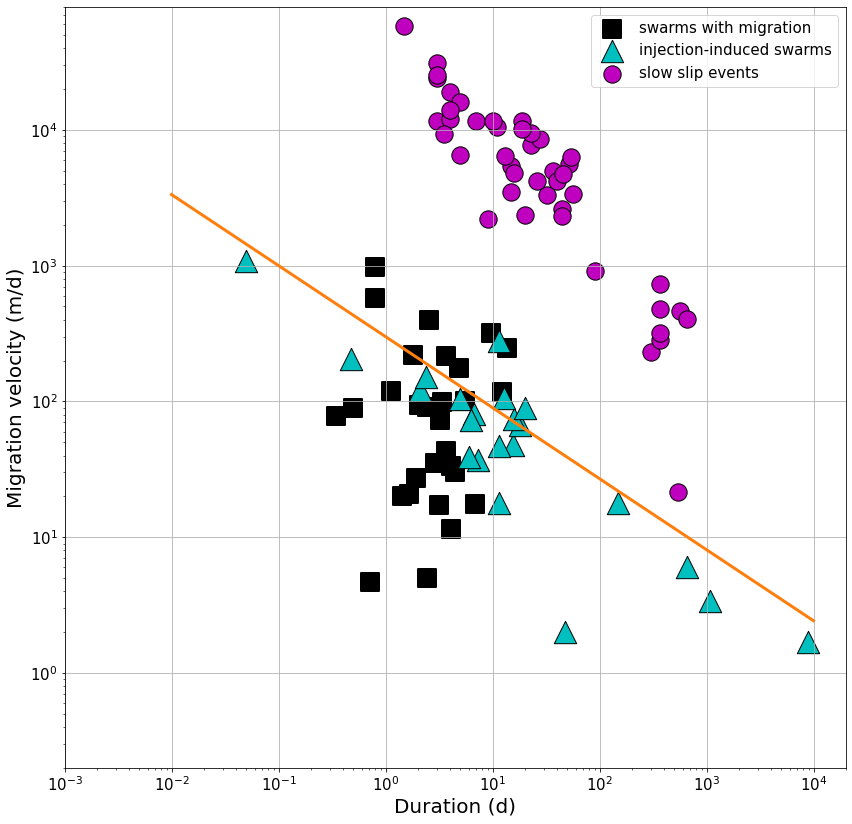

In [41]:
marker_size = 300
marker_size_s = 500

plt.figure(figsize=(14,14))
##our data:
plt.scatter(dfM.duration, dfM.v*10**3, marker='s', c='k', s=marker_size, linewidth=2, label='swarms with migration') ##in m/d

##data from supply:
plt.scatter(df_supply1.duration, df_supply1.velocity, marker='^', s=marker_size_s, linewidth=1,facecolors='c', edgecolors='k', label="injection-induced swarms") ##Natural and fuild-induced swarms in m/d
plt.scatter(df_supply2.duration, df_supply2.velocity.values*10**8, marker='o', s=marker_size, linewidth=1,facecolors='m', edgecolors='k', label="slow slip events") ##SSE

plt.plot(x,y, c='tab:orange', linewidth=3)
plt.xscale("log")
plt.yscale("log")
plt.xlim(1*10**(-3), 2*10**4)
plt.ylim(2*10**(-1), 8*10**4)
plt.xlabel("Duration (d)", fontsize=20)
plt.ylabel("Migration velocity (m/d)", fontsize=20)
plt.tick_params(axis='both',labelsize=15)
plt.legend(fontsize=15)
plt.grid(True)
plt.savefig("v0_d03_n50_every1_clusters/fig_migration/migration_velocity_vs_duration.png")
plt.show()